In [10]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

## Load data

In [24]:
data = pd.read_csv('../../01_exploratory_data_analysis/rainfall/dataset_rainfall.csv')
data.drop(columns='Unnamed: 0', inplace=True)
data.sample(15)

,ISO3_code,Year,pt_gdp_agriculture,oil_rent,democracy_polity,gdp,country,ethnic_fractionation_index,yearly_avg_rainfall,rainfall_var_t,rainfall_var_t_1,yearly_avg_temp,temp_var_t,temp_var_t_1
821,BFA,2010,24.143387,0.000000,0.0,9.088721e+09,Burkina Faso,0.767,705.068182,0.039341,0.038966,299.127841,0.002530,0.024704
1051,BOL,1984,21.545832,2.284818,7.0,1.091592e+10,Bolivia,0.596,1147.329515,0.165170,-0.165505,213.972597,-0.011651,0.014918
2148,DOM,1993,10.781496,0.000000,5.0,2.408534e+10,Dominican Republic,0.435,1307.166667,-0.010090,0.062467,245.985294,-0.003930,0.013519
8719,ZAF,2018,2.260704,0.407107,9.0,3.585516e+11,South Africa,0.857,326.745370,-0.104385,0.015363,187.796852,0.006157,-0.024855
4020,JAM,2006,5.155826,0.683476,9.0,1.448752e+10,Jamaica,0.224,1697.305556,-0.272306,0.637441,252.027778,0.011370,-0.002446
3037,GIN,1986,16.314026,0.000000,-7.0,2.961300e+09,Guinea,0.744,1270.969136,-0.004340,0.052073,253.589506,-0.013784,-0.002180
565,AZE,2010,5.521253,25.515448,-7.0,4.722019e+10,Azerbaijan,0.133,460.570833,0.048012,0.211519,141.591667,0.106960,0.019477
4934,LTU,2013,3.534358,0.073935,10.0,3.892802e+10,Lithuania,0.284,574.596847,-0.120876,0.236721,74.443694,0.109236,-0.103199
1176,BTN,1981,37.618073,0.000000,-10.0,2.159625e+08,Bhutan,0.574,1000.710784,-0.034355,0.068981,47.049020,-0.021411,-0.045636
2447,ESP,1972,4.379625,0.000973,-7.0,4.423933e+11,Spain,0.500,696.423844,0.071295,0.373800,119.962121,-0.022121,-0.036876


In [25]:
import sys
sys.path.insert(0, '.')
sys.path.insert(1, '../../01_exploratory_data_analysis/rainfall')

from utils import diff

### Add features

- GDP variation (`gdp_g`)
- Rainfall difference from all-time average (`rainfall_diff_from_mean_norm`)
- Cumulative difference in rainfall from all-time mean (`cum_rainfall_diff`)
- Number of years in a row we are below average (`n_below_rainfall`)
- (Categorical variable) whether oil rent average over years is above 20% (`oil_prod`)
- (Categorical variable) whether % GDP due to agriculture average over years is above 40% (`agricultural`)

In [26]:
agriculture_cutoff = 30
oil_cutoff = 20

gdp_g = pd.DataFrame()
for country in data['ISO3_code'].unique():
    gdp = data[data['ISO3_code']==country].gdp
    gdp_diff = diff(gdp)
    gdp_diff = np.concatenate(([gdp_diff[0]], gdp_diff))
    gdp_diff[np.where(gdp_diff > 1)] = 0

    years = data[data['ISO3_code']==country].Year
    mean_rainfall = data[data['ISO3_code']==country].yearly_avg_rainfall.mean()
    avg_rainfall = data[data['ISO3_code']==country].yearly_avg_rainfall

    x = (avg_rainfall - mean_rainfall)/mean_rainfall

    n_below = []
    prev = 0
    for i, yr in enumerate(years):
        if avg_rainfall.to_list()[i] < mean_rainfall:
            prev += 1
        else:
            prev = 0
        n_below.append(prev)

    mean_oil = data[data['ISO3_code']==country].oil_rent.mean()
    mean_agr = data[data['ISO3_code']==country].pt_gdp_agriculture.mean()

    to_add = pd.DataFrame({'ISO3_code': [country]*len(gdp_diff),
                           'Year': years,
                           'gdp_g': gdp_diff,
                           'rainfall_diff_from_mean_norm': x,
                           'n_below_rainfall': n_below,
                           'oil_prod': [mean_oil >= oil_cutoff] * len(gdp_diff),
                           'agricultural': [mean_agr >= agriculture_cutoff] * len(gdp_diff),
                           'low_oil_high_agr': [(mean_oil < oil_cutoff) & (mean_agr >= agriculture_cutoff)] * len(gdp_diff),
                           'cum_rainfall_diff': np.cumsum(x)
                          })
    gdp_g = pd.concat([gdp_g, to_add])

data = data.merge(gdp_g, on=['ISO3_code', 'Year'])

data.sample(15)

,ISO3_code,Year,pt_gdp_agriculture,oil_rent,democracy_polity,gdp,country,ethnic_fractionation_index,yearly_avg_rainfall,rainfall_var_t,rainfall_var_t_1,yearly_avg_temp,temp_var_t,temp_var_t_1,gdp_g,rainfall_diff_from_mean_norm,n_below_rainfall,oil_prod,agricultural,low_oil_high_agr,cum_rainfall_diff
5637,MYS,1970,32.580284,0.016815,1.000000,1.888419e+10,Malaysia,0.603,2498.688636,0.050854,0.044793,256.279545,-0.003050,0.009875,0.059865,0.013023,0,False,False,False,-0.109970
7208,SLB,1999,33.598293,0.000000,8.000000,8.980336e+08,Solomon Islands,0.106,2443.083333,0.000000,0.000000,260.270833,-0.000160,0.002970,-0.004857,0.000122,0,False,True,True,-0.002923
8398,UGA,1970,51.028122,0.000000,-7.000000,4.983496e+09,Uganda,0.888,1050.722222,0.107776,-0.122405,226.185185,0.001111,0.025832,0.000000,0.024003,0,False,True,True,0.225660
3574,HTI,1994,33.928257,0.000000,6.000000,8.960564e+09,Haiti,0.106,991.156250,-0.208355,0.326586,253.562500,0.008034,-0.000248,-0.119506,-0.170928,1,False,False,False,-0.302184
4437,KOR,2000,3.857792,0.017111,8.000000,7.989291e+11,Republic of Korea,0.017,1085.478632,-0.235260,-0.026613,117.344017,-0.015666,-0.056788,0.000000,-0.028507,3,False,False,False,-0.664797
7092,SDN,2011,27.847694,15.100498,-4.000000,5.731240e+10,Sudan,0.746,169.551897,-0.179733,0.327997,279.217751,-0.044087,0.020261,-0.032135,-0.122667,1,False,True,True,-1.233917
669,BEL,1978,1.340821,0.000000,10.000000,2.262825e+11,Belgium,0.546,643.200000,-0.142660,0.595117,90.866667,-0.079158,-0.022024,0.028419,-0.106448,1,False,False,False,-0.547163
7486,SRB,2021,5.155865,0.424421,-2.347594,5.102286e+10,Serbia,0.596,611.100000,0.041208,-0.029936,116.290476,-0.057577,-0.048802,0.079491,0.023944,0,False,False,False,0.031347
4505,KWT,2004,0.404757,46.112835,-7.000000,8.180243e+10,Kuwait,0.761,127.763889,0.211511,-0.061086,265.097222,-0.005316,0.000939,0.102403,0.306772,0,True,False,False,2.892570
5612,MWI,2009,25.309301,0.037388,6.000000,7.048630e+09,Malawi,0.791,954.434685,0.012873,-0.017343,226.671171,0.003410,-0.008031,0.083281,0.002761,0,False,True,True,0.221368


In [27]:
subset = data[['ISO3_code',
               'Year',
               'yearly_avg_rainfall',
               'pt_gdp_agriculture',
               'gdp',
               'gdp_g',
               'oil_rent',
               'rainfall_diff_from_mean_norm',
               'n_below_rainfall',
               'rainfall_var_t',
               'rainfall_var_t_1',
               'yearly_avg_temp',
               'oil_prod',
               'agricultural',
               'low_oil_high_agr',
               'cum_rainfall_diff'
              ]].copy()

subset.dropna(inplace=True)
subset[subset['ISO3_code']=='UGA']

,ISO3_code,Year,yearly_avg_rainfall,pt_gdp_agriculture,gdp,gdp_g,oil_rent,rainfall_diff_from_mean_norm,n_below_rainfall,rainfall_var_t,rainfall_var_t_1,yearly_avg_temp,oil_prod,agricultural,low_oil_high_agr,cum_rainfall_diff
8388,UGA,1960,957.014403,49.874860,4.983496e+09,0.000000,0.0,-0.067322,1,0.332699,0.332699,226.232510,False,True,True,-6.732184e-02
8389,UGA,1961,1275.412551,49.922844,4.983496e+09,0.000000,0.0,0.242980,0,0.332699,0.332699,223.682099,False,True,True,1.756578e-01
8390,UGA,1962,1113.368313,49.180824,4.983496e+09,0.000000,0.0,0.085056,0,-0.127052,0.332699,221.256173,False,True,True,2.607139e-01
8391,UGA,1963,1138.208848,47.512920,4.983496e+09,0.000000,0.0,0.109265,0,0.022311,-0.127052,222.989712,False,True,True,3.699788e-01
8392,UGA,1964,1031.688272,47.243397,4.983496e+09,0.000000,0.0,0.005453,0,-0.093586,0.022311,222.003086,False,True,True,3.754320e-01
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8447,UGA,2019,1298.510288,22.945509,3.960005e+10,0.064387,0.0,0.265490,0,0.221933,-0.084493,233.767490,False,True,True,-4.204690e-01
8448,UGA,2020,1215.872428,23.929033,4.076877e+10,0.029513,0.0,0.184954,0,-0.063641,0.221933,233.997942,False,True,True,-2.355154e-01
8449,UGA,2021,1122.934156,23.841805,4.221059e+10,0.035366,0.0,0.094379,0,-0.076438,-0.063641,233.412551,False,True,True,-1.411368e-01
8450,UGA,2022,1142.887860,24.011723,4.414722e+10,0.045880,0.0,0.113825,0,0.017769,-0.076438,233.445473,False,True,True,-2.731178e-02


### Plot some of the new columns for sanity check

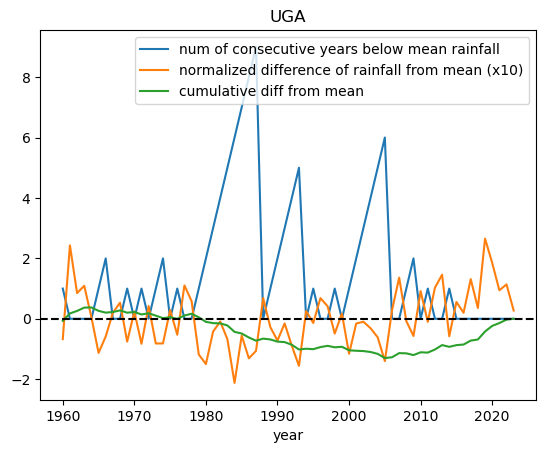

In [43]:
plt.plot(subset[subset['ISO3_code']=='UGA'].Year,
         subset[subset['ISO3_code']=='UGA'].n_below_rainfall,
         label='num of consecutive years below mean rainfall')

plt.plot(subset[subset['ISO3_code']=='UGA'].Year,
         subset[subset['ISO3_code']=='UGA'].rainfall_diff_from_mean_norm*10,
         label='normalized difference of rainfall from mean (x10)')

plt.plot(subset[subset['ISO3_code']=='UGA'].Year,
         subset[subset['ISO3_code']=='UGA'].cum_rainfall_diff,
         label='cumulative diff from mean')

y = subset[subset['ISO3_code']=='UGA'].rainfall_diff_from_mean_norm.to_numpy()
x = subset[subset['ISO3_code']=='UGA'].Year


plt.axhline(0, color='k', linestyle='dashed')

plt.xlabel('year')
plt.legend()
plt.title('UGA')
plt.show()

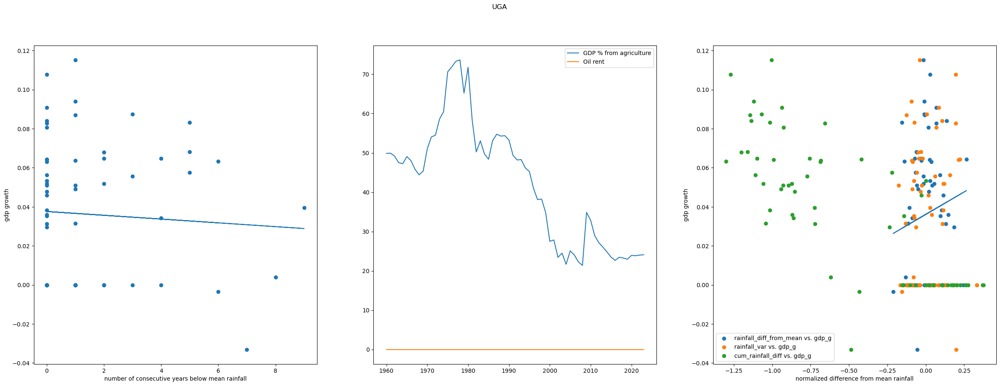

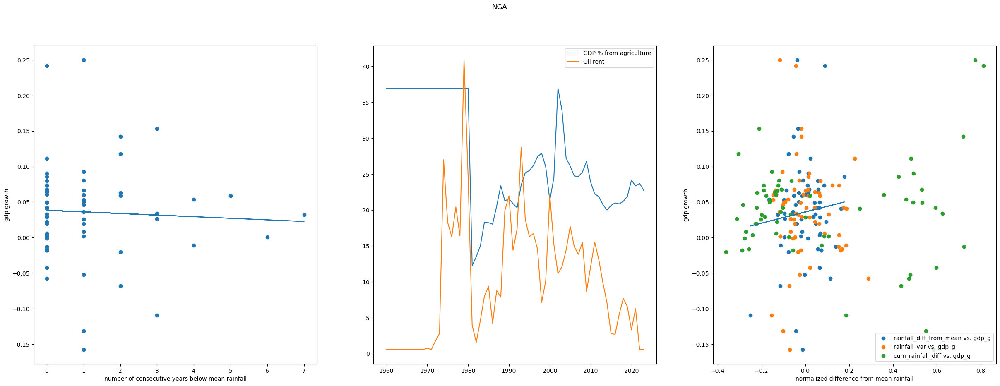

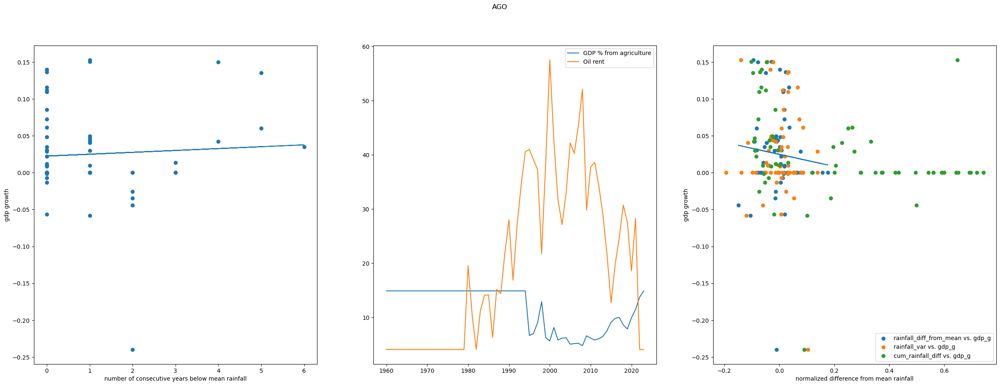

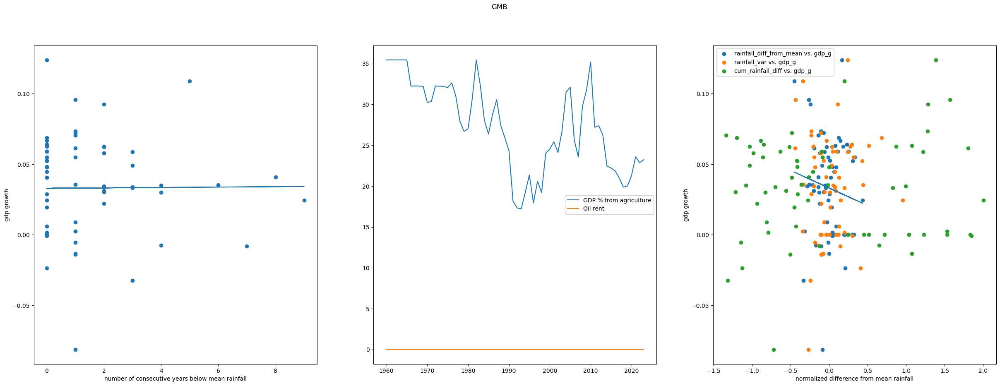

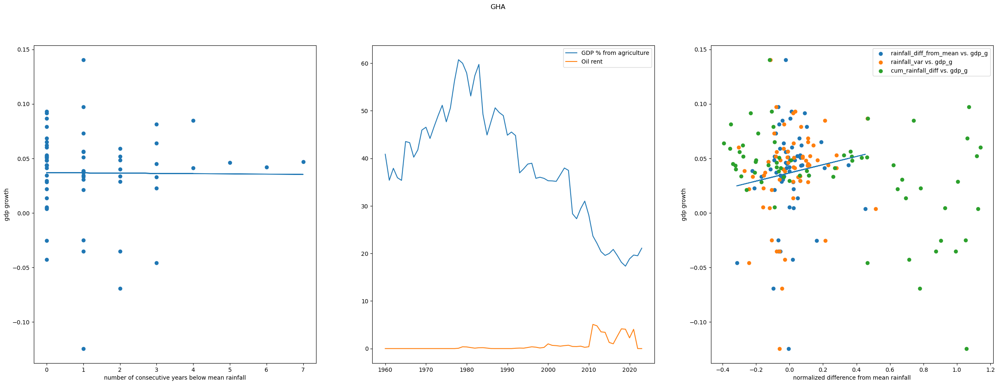

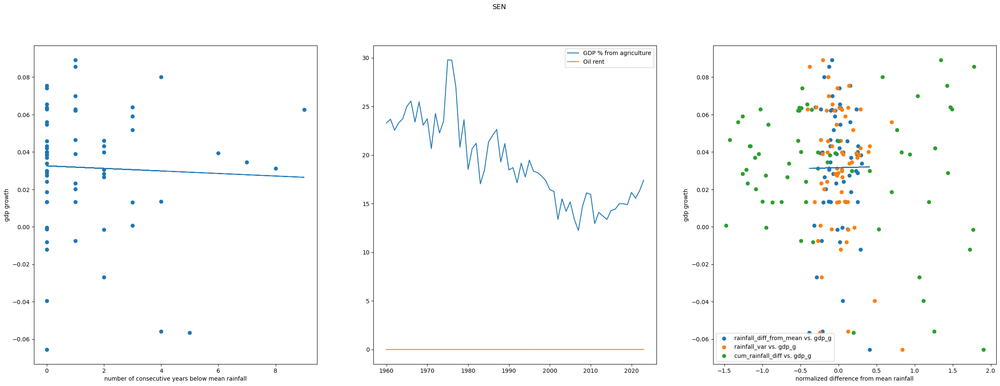

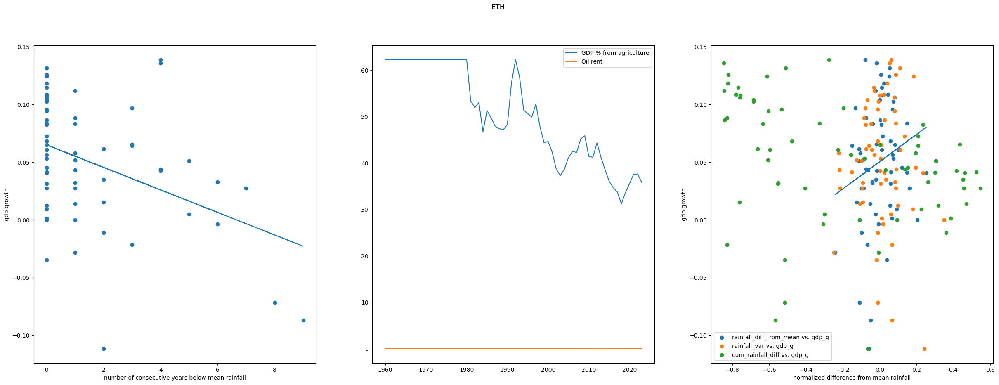

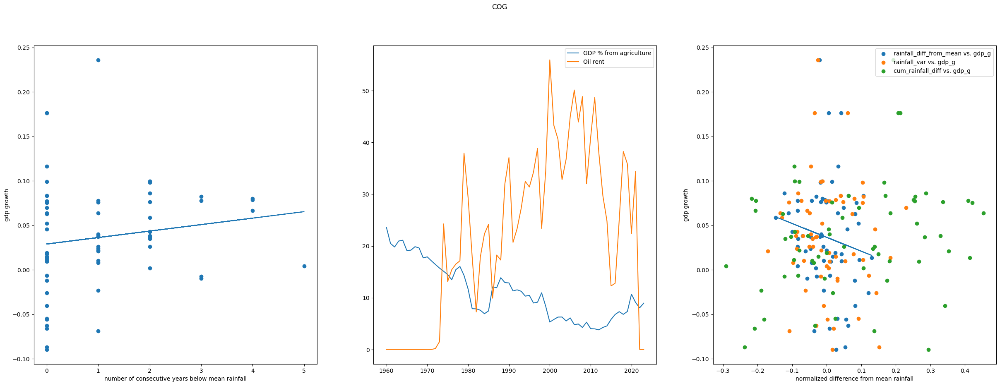

In [47]:
from sklearn.linear_model import LinearRegression

countries = ['UGA', 'NGA', 'AGO', 'GMB', 'GHA', 'SEN', 'ETH', 'COG']

for country in countries:
    fig, ax = plt.subplots(1,3,figsize=(30,10))
    country_subset = subset[subset['ISO3_code']==country]

    ax[0].scatter(country_subset['n_below_rainfall'], country_subset['gdp_g'])

    ols = LinearRegression()
    ols.fit(country_subset[['n_below_rainfall']], country_subset['gdp_g'])
    yp = ols.predict(country_subset[['n_below_rainfall']])
    ax[0].plot(country_subset['n_below_rainfall'], yp)

    ax[0].set_xlabel('number of consecutive years below mean rainfall')
    ax[0].set_ylabel('gdp growth')

    ax[1].plot(country_subset['Year'], country_subset['pt_gdp_agriculture'], label='GDP % from agriculture')
    ax[1].plot(country_subset['Year'], country_subset['oil_rent'], label='Oil rent')
    ax[1].legend()

    ax[2].scatter(country_subset['rainfall_diff_from_mean_norm'], country_subset['gdp_g'], label='rainfall_diff_from_mean vs. gdp_g')
    ols.fit(country_subset[['rainfall_diff_from_mean_norm']], country_subset['gdp_g'])
    yp = ols.predict(country_subset[['rainfall_diff_from_mean_norm']])
    ax[2].plot(country_subset['rainfall_diff_from_mean_norm'], yp)
    ax[2].set_xlabel('normalized difference from mean rainfall')
    ax[2].set_ylabel('gdp growth')

    ax[2].scatter(country_subset['rainfall_var_t'], country_subset['gdp_g'], label='rainfall_var vs. gdp_g')
    ax[2].scatter(country_subset['cum_rainfall_diff'], country_subset['gdp_g'], label='cum_rainfall_diff vs. gdp_g')
    ax[2].legend()

    plt.suptitle(country)
    plt.show()


## Try OLS on countries with low oil production and high agricultural output


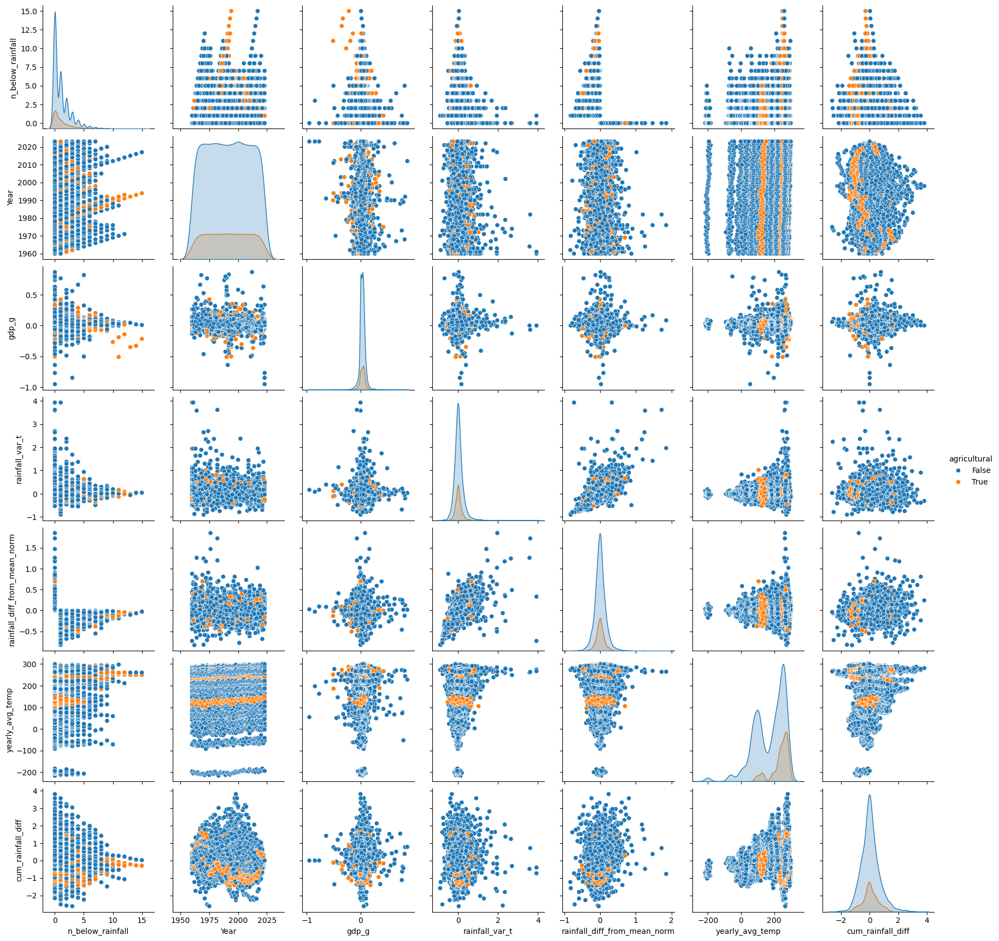

In [48]:
plot_feats = ['n_below_rainfall', 'Year', 'gdp_g', 'rainfall_var_t', 'rainfall_diff_from_mean_norm', 'yearly_avg_temp', 'cum_rainfall_diff']
sns.pairplot(subset,
             x_vars=plot_feats,
             y_vars=plot_feats,
             hue='agricultural')

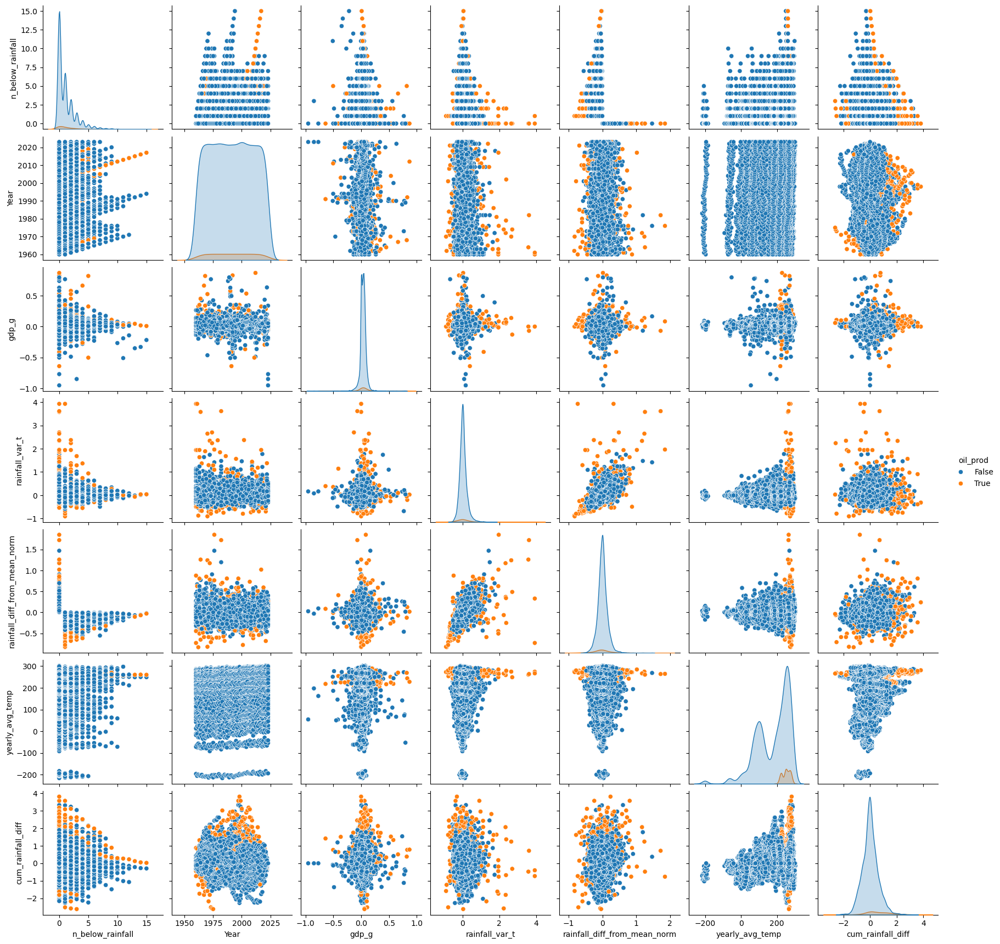

In [49]:
plot_feats = ['n_below_rainfall', 'Year', 'gdp_g', 'rainfall_var_t', 'rainfall_diff_from_mean_norm', 'yearly_avg_temp', 'cum_rainfall_diff']
sns.pairplot(subset,
             x_vars=plot_feats,
             y_vars=plot_feats,
             hue='oil_prod')

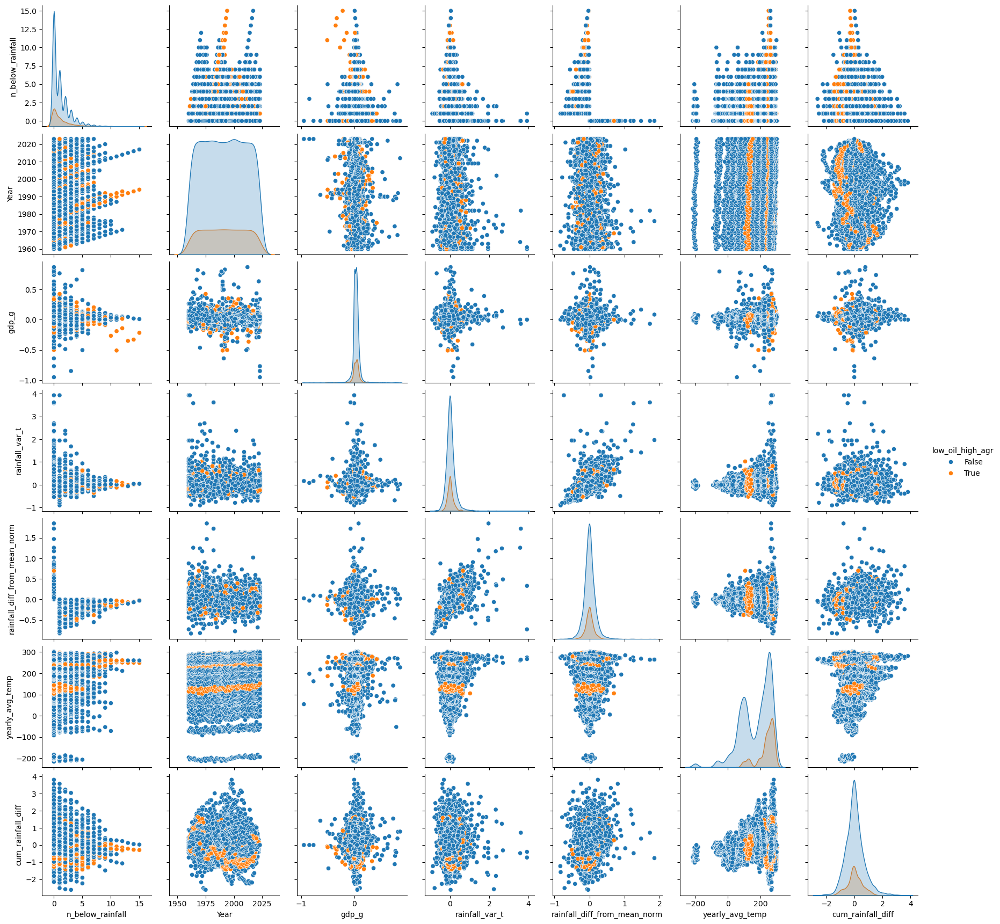

In [50]:
plot_feats = ['n_below_rainfall', 'Year', 'gdp_g', 'rainfall_var_t', 'rainfall_diff_from_mean_norm', 'yearly_avg_temp', 'cum_rainfall_diff']
sns.pairplot(subset,
             x_vars=plot_feats,
             y_vars=plot_feats,
             hue='low_oil_high_agr')

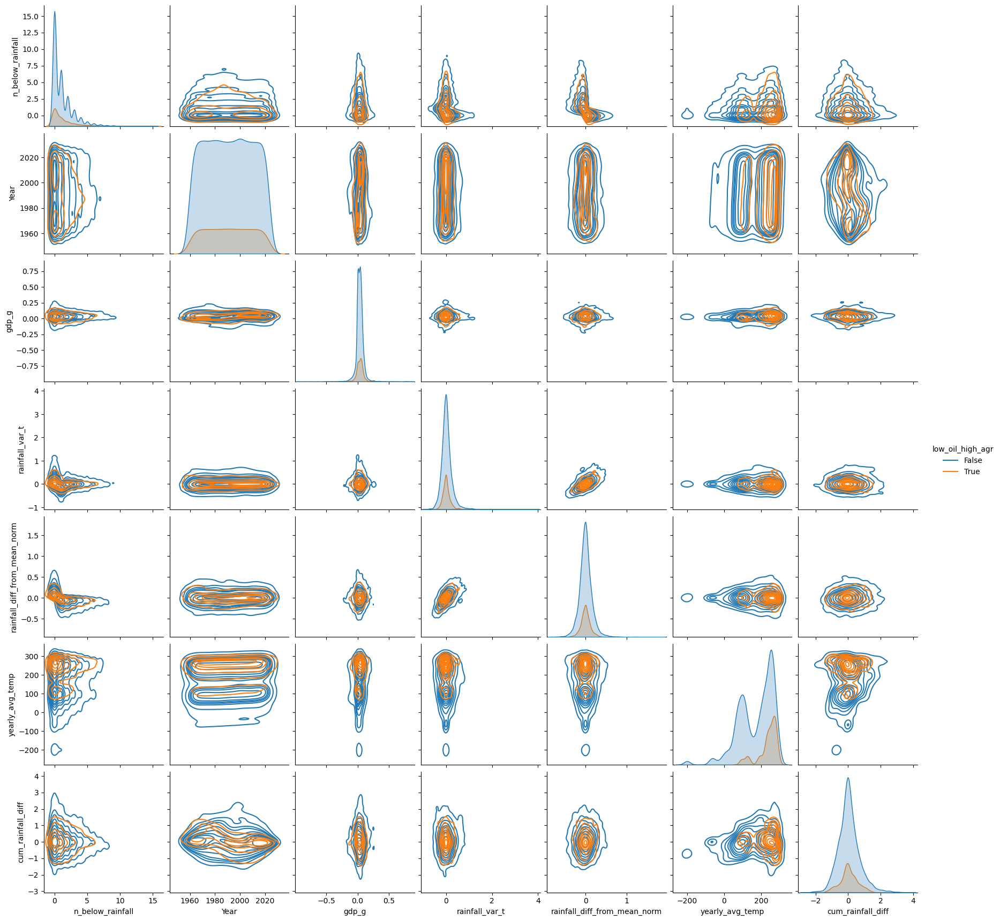

In [51]:
plot_feats = ['n_below_rainfall', 'Year', 'gdp_g', 'rainfall_var_t', 'rainfall_diff_from_mean_norm', 'yearly_avg_temp', 'cum_rainfall_diff']
sns.pairplot(subset,
             x_vars=plot_feats,
             y_vars=plot_feats,
             hue='low_oil_high_agr',
             kind='kde')

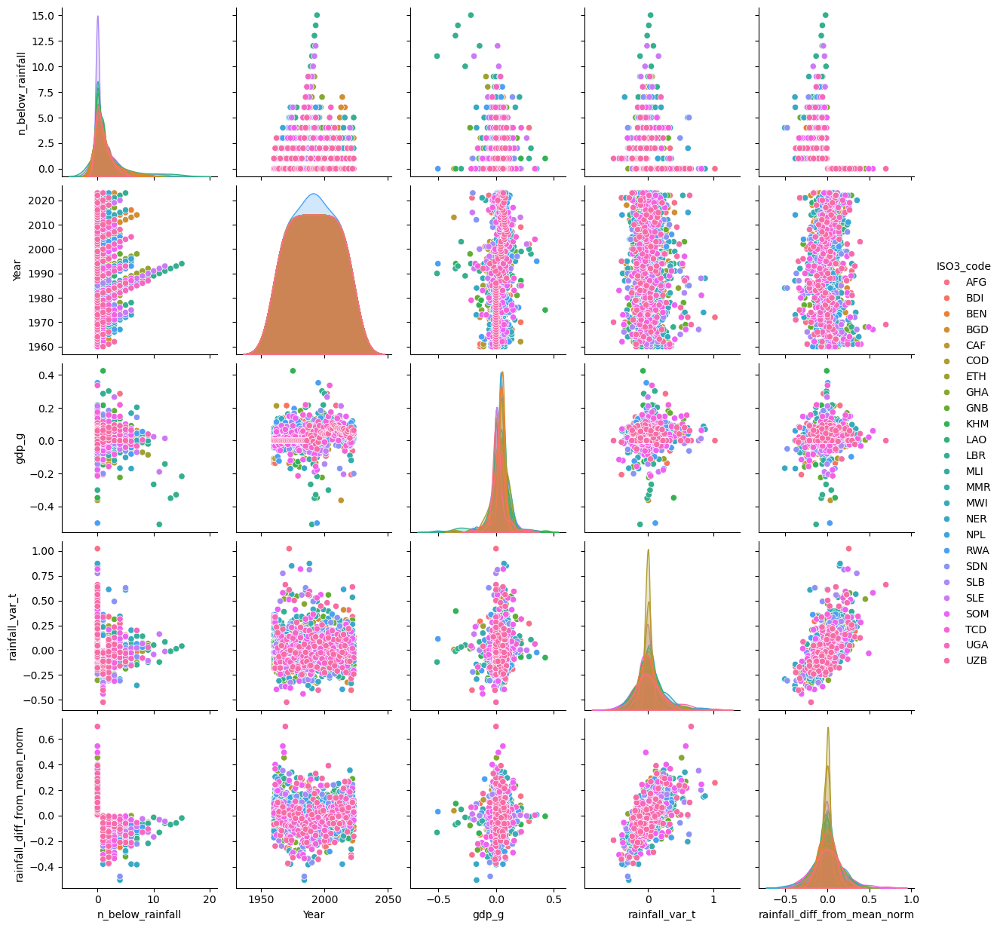

In [13]:
plot_feats = ['n_below_rainfall', 'Year', 'gdp_g', 'rainfall_var_t', 'rainfall_diff_from_mean_norm']

sns.pairplot(subset[subset['low_oil_high_agr']==True],
             x_vars=plot_feats,
             y_vars=plot_feats,
             hue='ISO3_code')

In [14]:
from sklearn.metrics import root_mean_squared_error

low_oil_high_agriculture = subset[subset['low_oil_high_agr']==True].copy()

feat = ['n_below_rainfall']
target = ['gdp_g']

ols = LinearRegression()
ols.fit(low_oil_high_agriculture[feat], low_oil_high_agriculture[target])
r2 = ols.score(low_oil_high_agriculture[feat], low_oil_high_agriculture[target])
ypred = ols.predict(low_oil_high_agriculture[feat])
rmse_lr = root_mean_squared_error(low_oil_high_agriculture[target], ypred)
print(f'R2: {r2:.4f}, rmse:{rmse_lr:.5f}')

R2: 0.0343, rmse:0.06180


In [15]:
feat = ['rainfall_diff_from_mean_norm']
target = ['gdp_g']

ols = LinearRegression()
ols.fit(low_oil_high_agriculture[feat], low_oil_high_agriculture[target])
r2 = ols.score(low_oil_high_agriculture[feat], low_oil_high_agriculture[target])
ypred = ols.predict(low_oil_high_agriculture[feat])
rmse_lr = root_mean_squared_error(low_oil_high_agriculture[target], ypred)
print(f'R2: {r2:.4f}, rmse:{rmse_lr:.5f}')

R2: 0.0082, rmse:0.06263


In [16]:
feat = ['rainfall_var_t']
target = ['gdp_g']

ols = LinearRegression()
ols.fit(low_oil_high_agriculture[feat], low_oil_high_agriculture[target])
r2 = ols.score(low_oil_high_agriculture[feat], low_oil_high_agriculture[target])
ypred = ols.predict(low_oil_high_agriculture[feat])
rmse_lr = root_mean_squared_error(low_oil_high_agriculture[target], ypred)
print(f'R2: {r2:.4f}, rmse:{rmse_lr:.5f}')

R2: 0.0048, rmse:0.06274


In [17]:
feat = ['rainfall_var_t', 'n_below_rainfall', 'rainfall_diff_from_mean_norm', 'yearly_avg_temp']
target = ['gdp_g']

ols = LinearRegression()
ols.fit(low_oil_high_agriculture[feat], low_oil_high_agriculture[target])
r2 = ols.score(low_oil_high_agriculture[feat], low_oil_high_agriculture[target])
ypred = ols.predict(low_oil_high_agriculture[feat])
rmse_lr = root_mean_squared_error(low_oil_high_agriculture[target], ypred)
print(f'R2: {r2:.4f}, rmse:{rmse_lr:.5f}')

R2: 0.0385, rmse:0.06167


### Try random forest regressor

In [18]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import GridSearchCV

In [19]:
grid_cv = GridSearchCV(RandomForestRegressor(),
                       param_grid={'max_depth': range(1, 11),
                                   'n_estimators': [100, 500]},
                                   scoring='neg_root_mean_squared_error',
                                   cv=5)

feat = ['rainfall_var_t', 'n_below_rainfall', 'rainfall_diff_from_mean_norm', 'yearly_avg_temp']
target = 'gdp_g'
grid_cv.fit(low_oil_high_agriculture[feat], low_oil_high_agriculture[target])

GridSearchCV(cv=5, estimator=RandomForestRegressor(),
             param_grid={'max_depth': range(1, 11), 'n_estimators': [100, 500]},
             scoring='neg_root_mean_squared_error')

In [20]:
print(grid_cv.best_params_, grid_cv.best_score_)

{'max_depth': 2, 'n_estimators': 100} -0.06199978267484481


In [21]:
feature_importance_df = pd.DataFrame({
    'Feature': feat,  # List of feature names
    'Importance': grid_cv.best_estimator_.feature_importances_
})

# Sort the features by importance in descending order
feature_importance_df = feature_importance_df.sort_values(by="Importance", ascending=False)

# Reset index for better readability
feature_importance_df.reset_index(drop=True, inplace=True)

# Display the DataFrame
print(feature_importance_df)

                        Feature  Importance
0              n_below_rainfall    0.664532
1  rainfall_diff_from_mean_norm    0.244337
2               yearly_avg_temp    0.051956
3                rainfall_var_t    0.039175


### Try XGBoost

In [22]:
!pip install xgboost

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.2/2.2 MB 24.5 MB/s eta 0:00:00


In [23]:
import xgboost as xgb

rmse:0.0587


[]

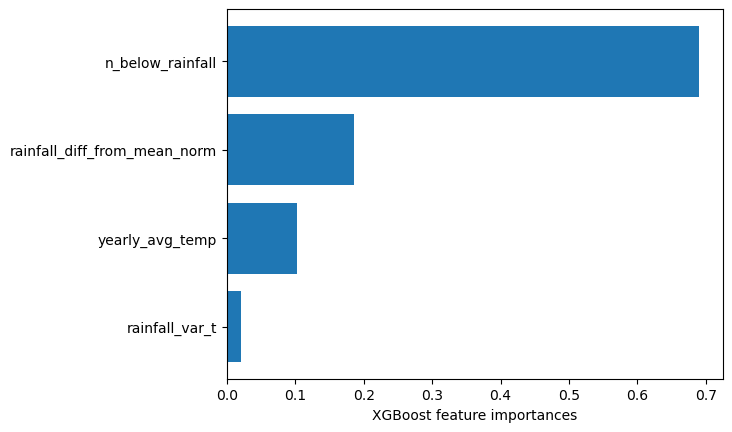

In [24]:
xgb_reg = xgb.XGBRegressor(learning_rate=0.1,
                            max_depth=3,
                            n_estimators=10)

X = low_oil_high_agriculture[feat]
y = low_oil_high_agriculture[target]
xgb_reg.fit(X, y)

ypreds = xgb_reg.predict(X)
rmse_xgb = root_mean_squared_error(y, ypreds)
print(f'rmse:{rmse_xgb:.4f}')

sorted_idx = xgb_reg.feature_importances_.argsort()
plt.barh(X.columns[sorted_idx], xgb_reg.feature_importances_[sorted_idx])
plt.xlabel('XGBoost feature importances')
plt.plot()

rmse:0.0661


[]

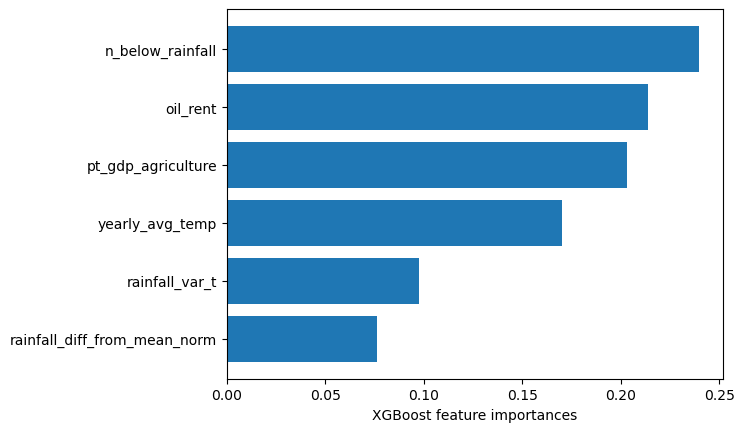

In [25]:
xgb_reg_2 = xgb.XGBRegressor(learning_rate=0.1,
                             max_depth=3,
                             n_estimators=10)

feat = ['n_below_rainfall', 'rainfall_var_t', 'rainfall_diff_from_mean_norm',
        'yearly_avg_temp', 'oil_rent', 'pt_gdp_agriculture']

target = 'gdp_g'

X = subset[feat]
y = subset[target]

xgb_reg_2.fit(X, y)

ypreds = xgb_reg_2.predict(X)
rmse_xgb_2 = root_mean_squared_error(y, ypreds)
print(f'rmse:{rmse_xgb_2:.4f}')

sorted_idx = xgb_reg_2.feature_importances_.argsort()
plt.barh(X.columns[sorted_idx], xgb_reg_2.feature_importances_[sorted_idx])
plt.xlabel('XGBoost feature importances')
plt.plot()

rmse:0.0664


[]

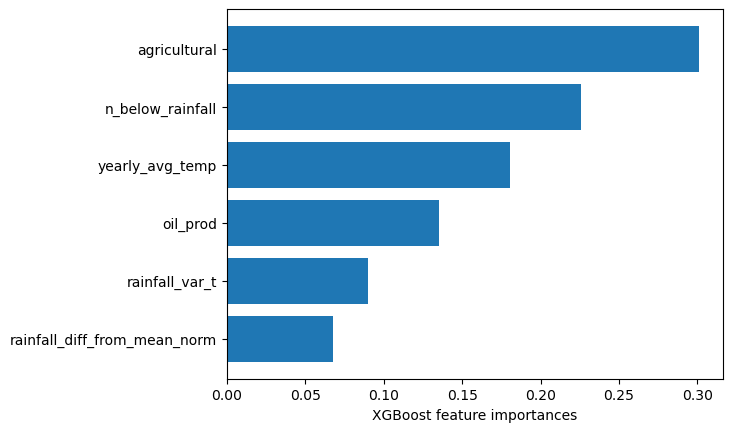

In [26]:
xgb_reg_2 = xgb.XGBRegressor(learning_rate=0.1,
                             max_depth=3,
                             n_estimators=10)

feat = ['n_below_rainfall', 'rainfall_var_t', 'rainfall_diff_from_mean_norm',
        'yearly_avg_temp', 'oil_prod', 'agricultural']

target = 'gdp_g'

X = subset[feat]
y = subset[target]

xgb_reg_2.fit(X, y)

ypreds = xgb_reg_2.predict(X)
rmse_xgb_2 = root_mean_squared_error(y, ypreds)
print(f'rmse:{rmse_xgb_2:.4f}')

sorted_idx = xgb_reg_2.feature_importances_.argsort()
plt.barh(X.columns[sorted_idx], xgb_reg_2.feature_importances_[sorted_idx])
plt.xlabel('XGBoost feature importances')
plt.plot()

With proper cross validation. Requires writing a wrapper class for the XGBoost regressor ([described here](https://stackoverflow.com/a/51997797/2112406)). 

In [27]:
from sklearn.base import BaseEstimator
from sklearn.model_selection import train_test_split
from xgboost import XGBRegressor, XGBClassifier


class XGBoostForSklearn(BaseEstimator):
    def __init__(self, test_size=0.1, **estimator_params):
        self.test_size = test_size        
        if self.estimator is not None:
            self.set_params(**estimator_params)

    def set_params(self, **params):
        return self.estimator.set_params(**params)

    def get_params(self, **params):
        return self.estimator.get_params()

    def fit(self, X, y):
        x_train, x_val, y_train, y_val = train_test_split(X, y, test_size=self.test_size)
        self.estimator.fit(x_train, y_train, eval_set=[(x_val, y_val)])
        return self

    def predict(self, X):
        return self.estimator.predict(X)

class XGBoostRegressorForSklearn(XGBoostForSklearn):
    def __init__(self, *args, **kwargs):
        self.estimator = XGBRegressor()
        super(XGBoostRegressorForSklearn, self).__init__(*args, **kwargs)

class XGBoostClassifierForSklearn(XGBoostForSklearn):
    def __init__(self, *args, **kwargs):
        self.estimator = XGBClassifier()
        super(XGBoostClassifierForSklearn, self).__init__(*args, **kwargs)

In [28]:
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import GridSearchCV

pipe = Pipeline([
    ('scaler', StandardScaler()),
    ('xgb', XGBoostRegressorForSklearn())
])

param_grid = {
    'xgb__n_estimators': [10, 100, 500],
    'xgb__max_depth': [1, 3, 5, 10]
}

grid = GridSearchCV(pipe, param_grid, scoring='neg_root_mean_squared_error')

feat = ['n_below_rainfall', 'rainfall_var_t', 'rainfall_diff_from_mean_norm',
        'yearly_avg_temp', 'oil_prod', 'agricultural']

target = 'gdp_g'

X = subset[feat].copy()
y = subset[target].copy()

grid.fit(X, y)

print(grid.best_params_, grid_cv.best_score_)

[0]	validation_0-rmse:0.05884
[1]	validation_0-rmse:0.05873
[2]	validation_0-rmse:0.05858
[3]	validation_0-rmse:0.05838
[4]	validation_0-rmse:0.05829
[5]	validation_0-rmse:0.05824
[6]	validation_0-rmse:0.05820
[7]	validation_0-rmse:0.05807
[8]	validation_0-rmse:0.05804
[9]	validation_0-rmse:0.05806
[0]	validation_0-rmse:0.05925
[1]	validation_0-rmse:0.05920
[2]	validation_0-rmse:0.05920
[3]	validation_0-rmse:0.05910
[4]	validation_0-rmse:0.05910
[5]	validation_0-rmse:0.05914
[6]	validation_0-rmse:0.05916
[7]	validation_0-rmse:0.05913
[8]	validation_0-rmse:0.05913
[9]	validation_0-rmse:0.05911
[0]	validation_0-rmse:0.06910
[1]	validation_0-rmse:0.06916
[2]	validation_0-rmse:0.06917
[3]	validation_0-rmse:0.06924
[4]	validation_0-rmse:0.06926
[5]	validation_0-rmse:0.06931
[6]	validation_0-rmse:0.06931
[7]	validation_0-rmse:0.06933
[8]	validation_0-rmse:0.06934
[9]	validation_0-rmse:0.06938
[0]	validation_0-rmse:0.07465
[1]	validation_0-rmse:0.07465
[2]	validation_0-rmse:0.07460
[3]	valida

/usr/local/Caskroom/miniconda/base/envs/nature-and-conflicts-irem/lib/python3.12/site-packages/sklearn/pipeline.py:62: FutureWarning: This Pipeline instance is not fitted yet. Call 'fit' with appropriate arguments before using other methods such as transform, predict, etc. This will raise an error in 1.8 instead of the current warning.
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/nature-and-conflicts-irem/lib/python3.12/site-packages/sklearn/pipeline.py:62: FutureWarning: This Pipeline instance is not fitted yet. Call 'fit' with appropriate arguments before using other methods such as transform, predict, etc. This will raise an error in 1.8 instead of the current warning.
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/nature-and-conflicts-irem/lib/python3.12/site-packages/sklearn/pipeline.py:62: FutureWarning: This Pipeline instance is not fitted yet. Call 'fit' with appropriate arguments before using other methods such as transform, predict, etc. This will raise 

[4]	validation_0-rmse:0.06031
[5]	validation_0-rmse:0.06031
[6]	validation_0-rmse:0.06031
[7]	validation_0-rmse:0.06033
[8]	validation_0-rmse:0.06028
[9]	validation_0-rmse:0.06029
[0]	validation_0-rmse:0.08132
[1]	validation_0-rmse:0.08123
[2]	validation_0-rmse:0.08091
[3]	validation_0-rmse:0.08096
[4]	validation_0-rmse:0.08066
[5]	validation_0-rmse:0.08061
[6]	validation_0-rmse:0.08062
[7]	validation_0-rmse:0.08067
[8]	validation_0-rmse:0.08047
[9]	validation_0-rmse:0.08048
[10]	validation_0-rmse:0.08046
[11]	validation_0-rmse:0.08046
[12]	validation_0-rmse:0.08040
[13]	validation_0-rmse:0.08043
[14]	validation_0-rmse:0.08044
[15]	validation_0-rmse:0.08047
[16]	validation_0-rmse:0.08035
[17]	validation_0-rmse:0.08034
[18]	validation_0-rmse:0.08032
[19]	validation_0-rmse:0.08035
[20]	validation_0-rmse:0.08033
[21]	validation_0-rmse:0.08030
[22]	validation_0-rmse:0.08030
[23]	validation_0-rmse:0.08033
[24]	validation_0-rmse:0.08029
[25]	validation_0-rmse:0.08030
[26]	validation_0-rmse:0

/usr/local/Caskroom/miniconda/base/envs/nature-and-conflicts-irem/lib/python3.12/site-packages/sklearn/pipeline.py:62: FutureWarning: This Pipeline instance is not fitted yet. Call 'fit' with appropriate arguments before using other methods such as transform, predict, etc. This will raise an error in 1.8 instead of the current warning.
  warnings.warn(


[71]	validation_0-rmse:0.08016
[72]	validation_0-rmse:0.08013
[73]	validation_0-rmse:0.08019
[74]	validation_0-rmse:0.08013
[75]	validation_0-rmse:0.08013
[76]	validation_0-rmse:0.08012
[77]	validation_0-rmse:0.08014
[78]	validation_0-rmse:0.08014
[79]	validation_0-rmse:0.08014
[80]	validation_0-rmse:0.08014
[81]	validation_0-rmse:0.08014
[82]	validation_0-rmse:0.08014
[83]	validation_0-rmse:0.08015
[84]	validation_0-rmse:0.08016
[85]	validation_0-rmse:0.08016
[86]	validation_0-rmse:0.08015
[87]	validation_0-rmse:0.08020
[88]	validation_0-rmse:0.08016
[89]	validation_0-rmse:0.08016
[90]	validation_0-rmse:0.08015
[91]	validation_0-rmse:0.08014
[92]	validation_0-rmse:0.08015
[93]	validation_0-rmse:0.08021
[94]	validation_0-rmse:0.08015
[95]	validation_0-rmse:0.08015
[96]	validation_0-rmse:0.08015
[97]	validation_0-rmse:0.08015
[98]	validation_0-rmse:0.08016
[99]	validation_0-rmse:0.08016
[0]	validation_0-rmse:0.07513
[1]	validation_0-rmse:0.07513
[2]	validation_0-rmse:0.07505
[3]	validat

/usr/local/Caskroom/miniconda/base/envs/nature-and-conflicts-irem/lib/python3.12/site-packages/sklearn/pipeline.py:62: FutureWarning: This Pipeline instance is not fitted yet. Call 'fit' with appropriate arguments before using other methods such as transform, predict, etc. This will raise an error in 1.8 instead of the current warning.
  warnings.warn(


[89]	validation_0-rmse:0.07459
[90]	validation_0-rmse:0.07460
[91]	validation_0-rmse:0.07460
[92]	validation_0-rmse:0.07459
[93]	validation_0-rmse:0.07459
[94]	validation_0-rmse:0.07458
[95]	validation_0-rmse:0.07459
[96]	validation_0-rmse:0.07459
[97]	validation_0-rmse:0.07459
[98]	validation_0-rmse:0.07458
[99]	validation_0-rmse:0.07459
[0]	validation_0-rmse:0.06722
[1]	validation_0-rmse:0.06709
[2]	validation_0-rmse:0.06701
[3]	validation_0-rmse:0.06694
[4]	validation_0-rmse:0.06690
[5]	validation_0-rmse:0.06686
[6]	validation_0-rmse:0.06685
[7]	validation_0-rmse:0.06687
[8]	validation_0-rmse:0.06684
[9]	validation_0-rmse:0.06682
[10]	validation_0-rmse:0.06685
[11]	validation_0-rmse:0.06685
[12]	validation_0-rmse:0.06683
[13]	validation_0-rmse:0.06685
[14]	validation_0-rmse:0.06684
[15]	validation_0-rmse:0.06684
[16]	validation_0-rmse:0.06685
[17]	validation_0-rmse:0.06684
[18]	validation_0-rmse:0.06685
[19]	validation_0-rmse:0.06683
[20]	validation_0-rmse:0.06684
[21]	validation_0-

/usr/local/Caskroom/miniconda/base/envs/nature-and-conflicts-irem/lib/python3.12/site-packages/sklearn/pipeline.py:62: FutureWarning: This Pipeline instance is not fitted yet. Call 'fit' with appropriate arguments before using other methods such as transform, predict, etc. This will raise an error in 1.8 instead of the current warning.
  warnings.warn(


[0]	validation_0-rmse:0.07363
[1]	validation_0-rmse:0.07382
[2]	validation_0-rmse:0.07384
[3]	validation_0-rmse:0.07384
[4]	validation_0-rmse:0.07383
[5]	validation_0-rmse:0.07400
[6]	validation_0-rmse:0.07396
[7]	validation_0-rmse:0.07399
[8]	validation_0-rmse:0.07399
[9]	validation_0-rmse:0.07397
[10]	validation_0-rmse:0.07408
[11]	validation_0-rmse:0.07408
[12]	validation_0-rmse:0.07407
[13]	validation_0-rmse:0.07407
[14]	validation_0-rmse:0.07410
[15]	validation_0-rmse:0.07412
[16]	validation_0-rmse:0.07411
[17]	validation_0-rmse:0.07415
[18]	validation_0-rmse:0.07415
[19]	validation_0-rmse:0.07415
[20]	validation_0-rmse:0.07415
[21]	validation_0-rmse:0.07416
[22]	validation_0-rmse:0.07416
[23]	validation_0-rmse:0.07416
[24]	validation_0-rmse:0.07417
[25]	validation_0-rmse:0.07420
[26]	validation_0-rmse:0.07417
[27]	validation_0-rmse:0.07417
[28]	validation_0-rmse:0.07415
[29]	validation_0-rmse:0.07417
[30]	validation_0-rmse:0.07417
[31]	validation_0-rmse:0.07418
[32]	validation_0-

/usr/local/Caskroom/miniconda/base/envs/nature-and-conflicts-irem/lib/python3.12/site-packages/sklearn/pipeline.py:62: FutureWarning: This Pipeline instance is not fitted yet. Call 'fit' with appropriate arguments before using other methods such as transform, predict, etc. This will raise an error in 1.8 instead of the current warning.
  warnings.warn(


[66]	validation_0-rmse:0.07429
[67]	validation_0-rmse:0.07429
[68]	validation_0-rmse:0.07430
[69]	validation_0-rmse:0.07430
[70]	validation_0-rmse:0.07431
[71]	validation_0-rmse:0.07431
[72]	validation_0-rmse:0.07431
[73]	validation_0-rmse:0.07431
[74]	validation_0-rmse:0.07431
[75]	validation_0-rmse:0.07431
[76]	validation_0-rmse:0.07431
[77]	validation_0-rmse:0.07433
[78]	validation_0-rmse:0.07432
[79]	validation_0-rmse:0.07433
[80]	validation_0-rmse:0.07432
[81]	validation_0-rmse:0.07433
[82]	validation_0-rmse:0.07433
[83]	validation_0-rmse:0.07434
[84]	validation_0-rmse:0.07434
[85]	validation_0-rmse:0.07436
[86]	validation_0-rmse:0.07435
[87]	validation_0-rmse:0.07436
[88]	validation_0-rmse:0.07435
[89]	validation_0-rmse:0.07437
[90]	validation_0-rmse:0.07438
[91]	validation_0-rmse:0.07438
[92]	validation_0-rmse:0.07437
[93]	validation_0-rmse:0.07439
[94]	validation_0-rmse:0.07439
[95]	validation_0-rmse:0.07439
[96]	validation_0-rmse:0.07439
[97]	validation_0-rmse:0.07440
[98]	val

/usr/local/Caskroom/miniconda/base/envs/nature-and-conflicts-irem/lib/python3.12/site-packages/sklearn/pipeline.py:62: FutureWarning: This Pipeline instance is not fitted yet. Call 'fit' with appropriate arguments before using other methods such as transform, predict, etc. This will raise an error in 1.8 instead of the current warning.
  warnings.warn(


[67]	validation_0-rmse:0.05494
[68]	validation_0-rmse:0.05495
[69]	validation_0-rmse:0.05493
[70]	validation_0-rmse:0.05493
[71]	validation_0-rmse:0.05493
[72]	validation_0-rmse:0.05494
[73]	validation_0-rmse:0.05494
[74]	validation_0-rmse:0.05495
[75]	validation_0-rmse:0.05496
[76]	validation_0-rmse:0.05498
[77]	validation_0-rmse:0.05497
[78]	validation_0-rmse:0.05495
[79]	validation_0-rmse:0.05496
[80]	validation_0-rmse:0.05495
[81]	validation_0-rmse:0.05493
[82]	validation_0-rmse:0.05493
[83]	validation_0-rmse:0.05496
[84]	validation_0-rmse:0.05495
[85]	validation_0-rmse:0.05495
[86]	validation_0-rmse:0.05496
[87]	validation_0-rmse:0.05497
[88]	validation_0-rmse:0.05496
[89]	validation_0-rmse:0.05498
[90]	validation_0-rmse:0.05497
[91]	validation_0-rmse:0.05498
[92]	validation_0-rmse:0.05497
[93]	validation_0-rmse:0.05499
[94]	validation_0-rmse:0.05497
[95]	validation_0-rmse:0.05497
[96]	validation_0-rmse:0.05497
[97]	validation_0-rmse:0.05497
[98]	validation_0-rmse:0.05498
[99]	val

/usr/local/Caskroom/miniconda/base/envs/nature-and-conflicts-irem/lib/python3.12/site-packages/sklearn/pipeline.py:62: FutureWarning: This Pipeline instance is not fitted yet. Call 'fit' with appropriate arguments before using other methods such as transform, predict, etc. This will raise an error in 1.8 instead of the current warning.
  warnings.warn(


[66]	validation_0-rmse:0.07146
[67]	validation_0-rmse:0.07145
[68]	validation_0-rmse:0.07146
[69]	validation_0-rmse:0.07146
[70]	validation_0-rmse:0.07146
[71]	validation_0-rmse:0.07146
[72]	validation_0-rmse:0.07144
[73]	validation_0-rmse:0.07143
[74]	validation_0-rmse:0.07142
[75]	validation_0-rmse:0.07142
[76]	validation_0-rmse:0.07142
[77]	validation_0-rmse:0.07142
[78]	validation_0-rmse:0.07141
[79]	validation_0-rmse:0.07141
[80]	validation_0-rmse:0.07141
[81]	validation_0-rmse:0.07142
[82]	validation_0-rmse:0.07143
[83]	validation_0-rmse:0.07144
[84]	validation_0-rmse:0.07143
[85]	validation_0-rmse:0.07143
[86]	validation_0-rmse:0.07143
[87]	validation_0-rmse:0.07142
[88]	validation_0-rmse:0.07142
[89]	validation_0-rmse:0.07142
[90]	validation_0-rmse:0.07141
[91]	validation_0-rmse:0.07141
[92]	validation_0-rmse:0.07142
[93]	validation_0-rmse:0.07143
[94]	validation_0-rmse:0.07143
[95]	validation_0-rmse:0.07142
[96]	validation_0-rmse:0.07143
[97]	validation_0-rmse:0.07143
[98]	val

/usr/local/Caskroom/miniconda/base/envs/nature-and-conflicts-irem/lib/python3.12/site-packages/sklearn/pipeline.py:62: FutureWarning: This Pipeline instance is not fitted yet. Call 'fit' with appropriate arguments before using other methods such as transform, predict, etc. This will raise an error in 1.8 instead of the current warning.
  warnings.warn(


[65]	validation_0-rmse:0.07538
[66]	validation_0-rmse:0.07538
[67]	validation_0-rmse:0.07538
[68]	validation_0-rmse:0.07538
[69]	validation_0-rmse:0.07539
[70]	validation_0-rmse:0.07539
[71]	validation_0-rmse:0.07538
[72]	validation_0-rmse:0.07540
[73]	validation_0-rmse:0.07540
[74]	validation_0-rmse:0.07539
[75]	validation_0-rmse:0.07538
[76]	validation_0-rmse:0.07538
[77]	validation_0-rmse:0.07538
[78]	validation_0-rmse:0.07538
[79]	validation_0-rmse:0.07539
[80]	validation_0-rmse:0.07538
[81]	validation_0-rmse:0.07539
[82]	validation_0-rmse:0.07539
[83]	validation_0-rmse:0.07539
[84]	validation_0-rmse:0.07539
[85]	validation_0-rmse:0.07539
[86]	validation_0-rmse:0.07539
[87]	validation_0-rmse:0.07540
[88]	validation_0-rmse:0.07539
[89]	validation_0-rmse:0.07539
[90]	validation_0-rmse:0.07539
[91]	validation_0-rmse:0.07540
[92]	validation_0-rmse:0.07539
[93]	validation_0-rmse:0.07544
[94]	validation_0-rmse:0.07544
[95]	validation_0-rmse:0.07544
[96]	validation_0-rmse:0.07545
[97]	val

/usr/local/Caskroom/miniconda/base/envs/nature-and-conflicts-irem/lib/python3.12/site-packages/sklearn/pipeline.py:62: FutureWarning: This Pipeline instance is not fitted yet. Call 'fit' with appropriate arguments before using other methods such as transform, predict, etc. This will raise an error in 1.8 instead of the current warning.
  warnings.warn(


[57]	validation_0-rmse:0.06401
[58]	validation_0-rmse:0.06400
[59]	validation_0-rmse:0.06402
[60]	validation_0-rmse:0.06402
[61]	validation_0-rmse:0.06402
[62]	validation_0-rmse:0.06401
[63]	validation_0-rmse:0.06401
[64]	validation_0-rmse:0.06405
[65]	validation_0-rmse:0.06405
[66]	validation_0-rmse:0.06405
[67]	validation_0-rmse:0.06405
[68]	validation_0-rmse:0.06404
[69]	validation_0-rmse:0.06405
[70]	validation_0-rmse:0.06404
[71]	validation_0-rmse:0.06404
[72]	validation_0-rmse:0.06404
[73]	validation_0-rmse:0.06404
[74]	validation_0-rmse:0.06403
[75]	validation_0-rmse:0.06405
[76]	validation_0-rmse:0.06404
[77]	validation_0-rmse:0.06404
[78]	validation_0-rmse:0.06405
[79]	validation_0-rmse:0.06405
[80]	validation_0-rmse:0.06405
[81]	validation_0-rmse:0.06405
[82]	validation_0-rmse:0.06405
[83]	validation_0-rmse:0.06404
[84]	validation_0-rmse:0.06404
[85]	validation_0-rmse:0.06406
[86]	validation_0-rmse:0.06407
[87]	validation_0-rmse:0.06407
[88]	validation_0-rmse:0.06407
[89]	val

/usr/local/Caskroom/miniconda/base/envs/nature-and-conflicts-irem/lib/python3.12/site-packages/sklearn/pipeline.py:62: FutureWarning: This Pipeline instance is not fitted yet. Call 'fit' with appropriate arguments before using other methods such as transform, predict, etc. This will raise an error in 1.8 instead of the current warning.
  warnings.warn(


[66]	validation_0-rmse:0.05757
[67]	validation_0-rmse:0.05757
[68]	validation_0-rmse:0.05757
[69]	validation_0-rmse:0.05758
[70]	validation_0-rmse:0.05755
[71]	validation_0-rmse:0.05756
[72]	validation_0-rmse:0.05756
[73]	validation_0-rmse:0.05754
[74]	validation_0-rmse:0.05756
[75]	validation_0-rmse:0.05756
[76]	validation_0-rmse:0.05757
[77]	validation_0-rmse:0.05758
[78]	validation_0-rmse:0.05757
[79]	validation_0-rmse:0.05756
[80]	validation_0-rmse:0.05758
[81]	validation_0-rmse:0.05755
[82]	validation_0-rmse:0.05755
[83]	validation_0-rmse:0.05754
[84]	validation_0-rmse:0.05756
[85]	validation_0-rmse:0.05754
[86]	validation_0-rmse:0.05755
[87]	validation_0-rmse:0.05756
[88]	validation_0-rmse:0.05757
[89]	validation_0-rmse:0.05756
[90]	validation_0-rmse:0.05758
[91]	validation_0-rmse:0.05756
[92]	validation_0-rmse:0.05758
[93]	validation_0-rmse:0.05758
[94]	validation_0-rmse:0.05754
[95]	validation_0-rmse:0.05757
[96]	validation_0-rmse:0.05758
[97]	validation_0-rmse:0.05759
[98]	val

/usr/local/Caskroom/miniconda/base/envs/nature-and-conflicts-irem/lib/python3.12/site-packages/sklearn/pipeline.py:62: FutureWarning: This Pipeline instance is not fitted yet. Call 'fit' with appropriate arguments before using other methods such as transform, predict, etc. This will raise an error in 1.8 instead of the current warning.
  warnings.warn(


[93]	validation_0-rmse:0.06458
[94]	validation_0-rmse:0.06457
[95]	validation_0-rmse:0.06459
[96]	validation_0-rmse:0.06460
[97]	validation_0-rmse:0.06460
[98]	validation_0-rmse:0.06459
[99]	validation_0-rmse:0.06459
[100]	validation_0-rmse:0.06459
[101]	validation_0-rmse:0.06460
[102]	validation_0-rmse:0.06460
[103]	validation_0-rmse:0.06461
[104]	validation_0-rmse:0.06461
[105]	validation_0-rmse:0.06461
[106]	validation_0-rmse:0.06463
[107]	validation_0-rmse:0.06460
[108]	validation_0-rmse:0.06460
[109]	validation_0-rmse:0.06461
[110]	validation_0-rmse:0.06463
[111]	validation_0-rmse:0.06461
[112]	validation_0-rmse:0.06460
[113]	validation_0-rmse:0.06460
[114]	validation_0-rmse:0.06461
[115]	validation_0-rmse:0.06461
[116]	validation_0-rmse:0.06460
[117]	validation_0-rmse:0.06460
[118]	validation_0-rmse:0.06460
[119]	validation_0-rmse:0.06460
[120]	validation_0-rmse:0.06459
[121]	validation_0-rmse:0.06460
[122]	validation_0-rmse:0.06459
[123]	validation_0-rmse:0.06459
[124]	validatio

/usr/local/Caskroom/miniconda/base/envs/nature-and-conflicts-irem/lib/python3.12/site-packages/sklearn/pipeline.py:62: FutureWarning: This Pipeline instance is not fitted yet. Call 'fit' with appropriate arguments before using other methods such as transform, predict, etc. This will raise an error in 1.8 instead of the current warning.
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/nature-and-conflicts-irem/lib/python3.12/site-packages/sklearn/pipeline.py:62: FutureWarning: This Pipeline instance is not fitted yet. Call 'fit' with appropriate arguments before using other methods such as transform, predict, etc. This will raise an error in 1.8 instead of the current warning.
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/nature-and-conflicts-irem/lib/python3.12/site-packages/sklearn/pipeline.py:62: FutureWarning: This Pipeline instance is not fitted yet. Call 'fit' with appropriate arguments before using other methods such as transform, predict, etc. This will raise 

[0]	validation_0-rmse:0.08579
[1]	validation_0-rmse:0.08558
[2]	validation_0-rmse:0.08533
[3]	validation_0-rmse:0.08518
[4]	validation_0-rmse:0.08512
[5]	validation_0-rmse:0.08512
[6]	validation_0-rmse:0.08489
[7]	validation_0-rmse:0.08482
[8]	validation_0-rmse:0.08481
[9]	validation_0-rmse:0.08482
[0]	validation_0-rmse:0.06347
[1]	validation_0-rmse:0.06316
[2]	validation_0-rmse:0.06294
[3]	validation_0-rmse:0.06292
[4]	validation_0-rmse:0.06289
[5]	validation_0-rmse:0.06280
[6]	validation_0-rmse:0.06283
[7]	validation_0-rmse:0.06284
[8]	validation_0-rmse:0.06287
[9]	validation_0-rmse:0.06291
[0]	validation_0-rmse:0.06722
[1]	validation_0-rmse:0.06672
[2]	validation_0-rmse:0.06645
[3]	validation_0-rmse:0.06634
[4]	validation_0-rmse:0.06626
[5]	validation_0-rmse:0.06626
[6]	validation_0-rmse:0.06618
[7]	validation_0-rmse:0.06619
[8]	validation_0-rmse:0.06616
[9]	validation_0-rmse:0.06618
[10]	validation_0-rmse:0.06625
[11]	validation_0-rmse:0.06624
[12]	validation_0-rmse:0.06619
[13]	va

/usr/local/Caskroom/miniconda/base/envs/nature-and-conflicts-irem/lib/python3.12/site-packages/sklearn/pipeline.py:62: FutureWarning: This Pipeline instance is not fitted yet. Call 'fit' with appropriate arguments before using other methods such as transform, predict, etc. This will raise an error in 1.8 instead of the current warning.
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/nature-and-conflicts-irem/lib/python3.12/site-packages/sklearn/pipeline.py:62: FutureWarning: This Pipeline instance is not fitted yet. Call 'fit' with appropriate arguments before using other methods such as transform, predict, etc. This will raise an error in 1.8 instead of the current warning.
  warnings.warn(


[42]	validation_0-rmse:0.06683
[43]	validation_0-rmse:0.06684
[44]	validation_0-rmse:0.06691
[45]	validation_0-rmse:0.06692
[46]	validation_0-rmse:0.06695
[47]	validation_0-rmse:0.06694
[48]	validation_0-rmse:0.06695
[49]	validation_0-rmse:0.06695
[50]	validation_0-rmse:0.06689
[51]	validation_0-rmse:0.06695
[52]	validation_0-rmse:0.06697
[53]	validation_0-rmse:0.06698
[54]	validation_0-rmse:0.06702
[55]	validation_0-rmse:0.06703
[56]	validation_0-rmse:0.06702
[57]	validation_0-rmse:0.06717
[58]	validation_0-rmse:0.06712
[59]	validation_0-rmse:0.06710
[60]	validation_0-rmse:0.06708
[61]	validation_0-rmse:0.06710
[62]	validation_0-rmse:0.06714
[63]	validation_0-rmse:0.06709
[64]	validation_0-rmse:0.06713
[65]	validation_0-rmse:0.06713
[66]	validation_0-rmse:0.06713
[67]	validation_0-rmse:0.06713
[68]	validation_0-rmse:0.06712
[69]	validation_0-rmse:0.06716
[70]	validation_0-rmse:0.06712
[71]	validation_0-rmse:0.06712
[72]	validation_0-rmse:0.06714
[73]	validation_0-rmse:0.06713
[74]	val

/usr/local/Caskroom/miniconda/base/envs/nature-and-conflicts-irem/lib/python3.12/site-packages/sklearn/pipeline.py:62: FutureWarning: This Pipeline instance is not fitted yet. Call 'fit' with appropriate arguments before using other methods such as transform, predict, etc. This will raise an error in 1.8 instead of the current warning.
  warnings.warn(


[61]	validation_0-rmse:0.07488
[62]	validation_0-rmse:0.07495
[63]	validation_0-rmse:0.07499
[64]	validation_0-rmse:0.07500
[65]	validation_0-rmse:0.07502
[66]	validation_0-rmse:0.07503
[67]	validation_0-rmse:0.07508
[68]	validation_0-rmse:0.07503
[69]	validation_0-rmse:0.07508
[70]	validation_0-rmse:0.07510
[71]	validation_0-rmse:0.07517
[72]	validation_0-rmse:0.07518
[73]	validation_0-rmse:0.07518
[74]	validation_0-rmse:0.07517
[75]	validation_0-rmse:0.07520
[76]	validation_0-rmse:0.07519
[77]	validation_0-rmse:0.07521
[78]	validation_0-rmse:0.07526
[79]	validation_0-rmse:0.07529
[80]	validation_0-rmse:0.07540
[81]	validation_0-rmse:0.07536
[82]	validation_0-rmse:0.07541
[83]	validation_0-rmse:0.07542
[84]	validation_0-rmse:0.07543
[85]	validation_0-rmse:0.07541
[86]	validation_0-rmse:0.07540
[87]	validation_0-rmse:0.07540
[88]	validation_0-rmse:0.07543
[89]	validation_0-rmse:0.07538
[90]	validation_0-rmse:0.07542
[91]	validation_0-rmse:0.07551
[92]	validation_0-rmse:0.07550
[93]	val

/usr/local/Caskroom/miniconda/base/envs/nature-and-conflicts-irem/lib/python3.12/site-packages/sklearn/pipeline.py:62: FutureWarning: This Pipeline instance is not fitted yet. Call 'fit' with appropriate arguments before using other methods such as transform, predict, etc. This will raise an error in 1.8 instead of the current warning.
  warnings.warn(


[67]	validation_0-rmse:0.05442
[68]	validation_0-rmse:0.05442
[69]	validation_0-rmse:0.05462
[70]	validation_0-rmse:0.05463
[71]	validation_0-rmse:0.05461
[72]	validation_0-rmse:0.05462
[73]	validation_0-rmse:0.05465
[74]	validation_0-rmse:0.05468
[75]	validation_0-rmse:0.05470
[76]	validation_0-rmse:0.05470
[77]	validation_0-rmse:0.05476
[78]	validation_0-rmse:0.05470
[79]	validation_0-rmse:0.05468
[80]	validation_0-rmse:0.05467
[81]	validation_0-rmse:0.05468
[82]	validation_0-rmse:0.05466
[83]	validation_0-rmse:0.05465
[84]	validation_0-rmse:0.05499
[85]	validation_0-rmse:0.05495
[86]	validation_0-rmse:0.05509
[87]	validation_0-rmse:0.05508
[88]	validation_0-rmse:0.05511
[89]	validation_0-rmse:0.05511
[90]	validation_0-rmse:0.05511
[91]	validation_0-rmse:0.05512
[92]	validation_0-rmse:0.05512
[93]	validation_0-rmse:0.05518
[94]	validation_0-rmse:0.05516
[95]	validation_0-rmse:0.05521
[96]	validation_0-rmse:0.05520
[97]	validation_0-rmse:0.05513
[98]	validation_0-rmse:0.05520
[99]	val

/usr/local/Caskroom/miniconda/base/envs/nature-and-conflicts-irem/lib/python3.12/site-packages/sklearn/pipeline.py:62: FutureWarning: This Pipeline instance is not fitted yet. Call 'fit' with appropriate arguments before using other methods such as transform, predict, etc. This will raise an error in 1.8 instead of the current warning.
  warnings.warn(


[62]	validation_0-rmse:0.06623
[63]	validation_0-rmse:0.06625
[64]	validation_0-rmse:0.06617
[65]	validation_0-rmse:0.06619
[66]	validation_0-rmse:0.06629
[67]	validation_0-rmse:0.06633
[68]	validation_0-rmse:0.06633
[69]	validation_0-rmse:0.06636
[70]	validation_0-rmse:0.06635
[71]	validation_0-rmse:0.06635
[72]	validation_0-rmse:0.06635
[73]	validation_0-rmse:0.06632
[74]	validation_0-rmse:0.06635
[75]	validation_0-rmse:0.06641
[76]	validation_0-rmse:0.06640
[77]	validation_0-rmse:0.06641
[78]	validation_0-rmse:0.06646
[79]	validation_0-rmse:0.06644
[80]	validation_0-rmse:0.06647
[81]	validation_0-rmse:0.06649
[82]	validation_0-rmse:0.06650
[83]	validation_0-rmse:0.06653
[84]	validation_0-rmse:0.06654
[85]	validation_0-rmse:0.06660
[86]	validation_0-rmse:0.06664
[87]	validation_0-rmse:0.06664
[88]	validation_0-rmse:0.06668
[89]	validation_0-rmse:0.06669
[90]	validation_0-rmse:0.06667
[91]	validation_0-rmse:0.06680
[92]	validation_0-rmse:0.06681
[93]	validation_0-rmse:0.06681
[94]	val

/usr/local/Caskroom/miniconda/base/envs/nature-and-conflicts-irem/lib/python3.12/site-packages/sklearn/pipeline.py:62: FutureWarning: This Pipeline instance is not fitted yet. Call 'fit' with appropriate arguments before using other methods such as transform, predict, etc. This will raise an error in 1.8 instead of the current warning.
  warnings.warn(


[66]	validation_0-rmse:0.06541
[67]	validation_0-rmse:0.06546
[68]	validation_0-rmse:0.06542
[69]	validation_0-rmse:0.06542
[70]	validation_0-rmse:0.06537
[71]	validation_0-rmse:0.06542
[72]	validation_0-rmse:0.06541
[73]	validation_0-rmse:0.06532
[74]	validation_0-rmse:0.06534
[75]	validation_0-rmse:0.06537
[76]	validation_0-rmse:0.06547
[77]	validation_0-rmse:0.06537
[78]	validation_0-rmse:0.06531
[79]	validation_0-rmse:0.06531
[80]	validation_0-rmse:0.06535
[81]	validation_0-rmse:0.06537
[82]	validation_0-rmse:0.06545
[83]	validation_0-rmse:0.06539
[84]	validation_0-rmse:0.06540
[85]	validation_0-rmse:0.06533
[86]	validation_0-rmse:0.06533
[87]	validation_0-rmse:0.06536
[88]	validation_0-rmse:0.06537
[89]	validation_0-rmse:0.06541
[90]	validation_0-rmse:0.06545
[91]	validation_0-rmse:0.06551
[92]	validation_0-rmse:0.06549
[93]	validation_0-rmse:0.06547
[94]	validation_0-rmse:0.06547
[95]	validation_0-rmse:0.06549
[96]	validation_0-rmse:0.06552
[97]	validation_0-rmse:0.06552
[98]	val

/usr/local/Caskroom/miniconda/base/envs/nature-and-conflicts-irem/lib/python3.12/site-packages/sklearn/pipeline.py:62: FutureWarning: This Pipeline instance is not fitted yet. Call 'fit' with appropriate arguments before using other methods such as transform, predict, etc. This will raise an error in 1.8 instead of the current warning.
  warnings.warn(


[69]	validation_0-rmse:0.07502
[70]	validation_0-rmse:0.07504
[71]	validation_0-rmse:0.07496
[72]	validation_0-rmse:0.07499
[73]	validation_0-rmse:0.07499
[74]	validation_0-rmse:0.07498
[75]	validation_0-rmse:0.07496
[76]	validation_0-rmse:0.07496
[77]	validation_0-rmse:0.07504
[78]	validation_0-rmse:0.07507
[79]	validation_0-rmse:0.07500
[80]	validation_0-rmse:0.07501
[81]	validation_0-rmse:0.07502
[82]	validation_0-rmse:0.07505
[83]	validation_0-rmse:0.07507
[84]	validation_0-rmse:0.07510
[85]	validation_0-rmse:0.07506
[86]	validation_0-rmse:0.07506
[87]	validation_0-rmse:0.07503
[88]	validation_0-rmse:0.07503
[89]	validation_0-rmse:0.07497
[90]	validation_0-rmse:0.07498
[91]	validation_0-rmse:0.07511
[92]	validation_0-rmse:0.07510
[93]	validation_0-rmse:0.07513
[94]	validation_0-rmse:0.07514
[95]	validation_0-rmse:0.07514
[96]	validation_0-rmse:0.07515
[97]	validation_0-rmse:0.07520
[98]	validation_0-rmse:0.07519
[99]	validation_0-rmse:0.07515
[100]	validation_0-rmse:0.07515
[101]	v

/usr/local/Caskroom/miniconda/base/envs/nature-and-conflicts-irem/lib/python3.12/site-packages/sklearn/pipeline.py:62: FutureWarning: This Pipeline instance is not fitted yet. Call 'fit' with appropriate arguments before using other methods such as transform, predict, etc. This will raise an error in 1.8 instead of the current warning.
  warnings.warn(


[74]	validation_0-rmse:0.06060
[75]	validation_0-rmse:0.06059
[76]	validation_0-rmse:0.06061
[77]	validation_0-rmse:0.06060
[78]	validation_0-rmse:0.06069
[79]	validation_0-rmse:0.06066
[80]	validation_0-rmse:0.06074
[81]	validation_0-rmse:0.06077
[82]	validation_0-rmse:0.06082
[83]	validation_0-rmse:0.06083
[84]	validation_0-rmse:0.06083
[85]	validation_0-rmse:0.06082
[86]	validation_0-rmse:0.06080
[87]	validation_0-rmse:0.06082
[88]	validation_0-rmse:0.06081
[89]	validation_0-rmse:0.06079
[90]	validation_0-rmse:0.06088
[91]	validation_0-rmse:0.06094
[92]	validation_0-rmse:0.06097
[93]	validation_0-rmse:0.06094
[94]	validation_0-rmse:0.06095
[95]	validation_0-rmse:0.06097
[96]	validation_0-rmse:0.06099
[97]	validation_0-rmse:0.06099
[98]	validation_0-rmse:0.06099
[99]	validation_0-rmse:0.06088
[100]	validation_0-rmse:0.06098
[101]	validation_0-rmse:0.06106
[102]	validation_0-rmse:0.06102
[103]	validation_0-rmse:0.06098
[104]	validation_0-rmse:0.06097
[105]	validation_0-rmse:0.06096
[1

/usr/local/Caskroom/miniconda/base/envs/nature-and-conflicts-irem/lib/python3.12/site-packages/sklearn/pipeline.py:62: FutureWarning: This Pipeline instance is not fitted yet. Call 'fit' with appropriate arguments before using other methods such as transform, predict, etc. This will raise an error in 1.8 instead of the current warning.
  warnings.warn(


[47]	validation_0-rmse:0.05946
[48]	validation_0-rmse:0.05947
[49]	validation_0-rmse:0.05946
[50]	validation_0-rmse:0.05951
[51]	validation_0-rmse:0.05945
[52]	validation_0-rmse:0.05945
[53]	validation_0-rmse:0.05942
[54]	validation_0-rmse:0.05947
[55]	validation_0-rmse:0.05945
[56]	validation_0-rmse:0.05944
[57]	validation_0-rmse:0.05949
[58]	validation_0-rmse:0.05948
[59]	validation_0-rmse:0.05946
[60]	validation_0-rmse:0.05953
[61]	validation_0-rmse:0.05952
[62]	validation_0-rmse:0.05951
[63]	validation_0-rmse:0.05956
[64]	validation_0-rmse:0.05966
[65]	validation_0-rmse:0.05968
[66]	validation_0-rmse:0.05970
[67]	validation_0-rmse:0.05963
[68]	validation_0-rmse:0.05967
[69]	validation_0-rmse:0.05971
[70]	validation_0-rmse:0.05969
[71]	validation_0-rmse:0.05980
[72]	validation_0-rmse:0.05980
[73]	validation_0-rmse:0.05980
[74]	validation_0-rmse:0.05981
[75]	validation_0-rmse:0.05978
[76]	validation_0-rmse:0.05975
[77]	validation_0-rmse:0.05992
[78]	validation_0-rmse:0.05986
[79]	val

/usr/local/Caskroom/miniconda/base/envs/nature-and-conflicts-irem/lib/python3.12/site-packages/sklearn/pipeline.py:62: FutureWarning: This Pipeline instance is not fitted yet. Call 'fit' with appropriate arguments before using other methods such as transform, predict, etc. This will raise an error in 1.8 instead of the current warning.
  warnings.warn(


[48]	validation_0-rmse:0.06568
[49]	validation_0-rmse:0.06583
[50]	validation_0-rmse:0.06584
[51]	validation_0-rmse:0.06588
[52]	validation_0-rmse:0.06592
[53]	validation_0-rmse:0.06598
[54]	validation_0-rmse:0.06573
[55]	validation_0-rmse:0.06578
[56]	validation_0-rmse:0.06580
[57]	validation_0-rmse:0.06577
[58]	validation_0-rmse:0.06573
[59]	validation_0-rmse:0.06573
[60]	validation_0-rmse:0.06571
[61]	validation_0-rmse:0.06573
[62]	validation_0-rmse:0.06575
[63]	validation_0-rmse:0.06560
[64]	validation_0-rmse:0.06556
[65]	validation_0-rmse:0.06552
[66]	validation_0-rmse:0.06553
[67]	validation_0-rmse:0.06554
[68]	validation_0-rmse:0.06557
[69]	validation_0-rmse:0.06559
[70]	validation_0-rmse:0.06558
[71]	validation_0-rmse:0.06561
[72]	validation_0-rmse:0.06560
[73]	validation_0-rmse:0.06580
[74]	validation_0-rmse:0.06578
[75]	validation_0-rmse:0.06578
[76]	validation_0-rmse:0.06585
[77]	validation_0-rmse:0.06589
[78]	validation_0-rmse:0.06589
[79]	validation_0-rmse:0.06590
[80]	val

/usr/local/Caskroom/miniconda/base/envs/nature-and-conflicts-irem/lib/python3.12/site-packages/sklearn/pipeline.py:62: FutureWarning: This Pipeline instance is not fitted yet. Call 'fit' with appropriate arguments before using other methods such as transform, predict, etc. This will raise an error in 1.8 instead of the current warning.
  warnings.warn(


[49]	validation_0-rmse:0.07812
[50]	validation_0-rmse:0.07816
[51]	validation_0-rmse:0.07818
[52]	validation_0-rmse:0.07831
[53]	validation_0-rmse:0.07831
[54]	validation_0-rmse:0.07831
[55]	validation_0-rmse:0.07828
[56]	validation_0-rmse:0.07828
[57]	validation_0-rmse:0.07828
[58]	validation_0-rmse:0.07827
[59]	validation_0-rmse:0.07830
[60]	validation_0-rmse:0.07831
[61]	validation_0-rmse:0.07831
[62]	validation_0-rmse:0.07830
[63]	validation_0-rmse:0.07841
[64]	validation_0-rmse:0.07838
[65]	validation_0-rmse:0.07847
[66]	validation_0-rmse:0.07851
[67]	validation_0-rmse:0.07850
[68]	validation_0-rmse:0.07858
[69]	validation_0-rmse:0.07857
[70]	validation_0-rmse:0.07858
[71]	validation_0-rmse:0.07856
[72]	validation_0-rmse:0.07856
[73]	validation_0-rmse:0.07856
[74]	validation_0-rmse:0.07854
[75]	validation_0-rmse:0.07849
[76]	validation_0-rmse:0.07811
[77]	validation_0-rmse:0.07819
[78]	validation_0-rmse:0.07825
[79]	validation_0-rmse:0.07852
[80]	validation_0-rmse:0.07855
[81]	val

/usr/local/Caskroom/miniconda/base/envs/nature-and-conflicts-irem/lib/python3.12/site-packages/sklearn/pipeline.py:62: FutureWarning: This Pipeline instance is not fitted yet. Call 'fit' with appropriate arguments before using other methods such as transform, predict, etc. This will raise an error in 1.8 instead of the current warning.
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/nature-and-conflicts-irem/lib/python3.12/site-packages/sklearn/pipeline.py:62: FutureWarning: This Pipeline instance is not fitted yet. Call 'fit' with appropriate arguments before using other methods such as transform, predict, etc. This will raise an error in 1.8 instead of the current warning.
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/nature-and-conflicts-irem/lib/python3.12/site-packages/sklearn/pipeline.py:62: FutureWarning: This Pipeline instance is not fitted yet. Call 'fit' with appropriate arguments before using other methods such as transform, predict, etc. This will raise 

[0]	validation_0-rmse:0.06573
[1]	validation_0-rmse:0.06518
[2]	validation_0-rmse:0.06496
[3]	validation_0-rmse:0.06488
[4]	validation_0-rmse:0.06491
[5]	validation_0-rmse:0.06462
[6]	validation_0-rmse:0.06465
[7]	validation_0-rmse:0.06483
[8]	validation_0-rmse:0.06500
[9]	validation_0-rmse:0.06500
[0]	validation_0-rmse:0.06653
[1]	validation_0-rmse:0.06631
[2]	validation_0-rmse:0.06637
[3]	validation_0-rmse:0.06634
[4]	validation_0-rmse:0.06608
[5]	validation_0-rmse:0.06625
[6]	validation_0-rmse:0.06614
[7]	validation_0-rmse:0.06627
[8]	validation_0-rmse:0.06631
[9]	validation_0-rmse:0.06630
[0]	validation_0-rmse:0.07884
[1]	validation_0-rmse:0.07880
[2]	validation_0-rmse:0.07884
[3]	validation_0-rmse:0.07877
[4]	validation_0-rmse:0.07874
[5]	validation_0-rmse:0.07877
[6]	validation_0-rmse:0.07871
[7]	validation_0-rmse:0.07872
[8]	validation_0-rmse:0.07833
[9]	validation_0-rmse:0.07836
[10]	validation_0-rmse:0.07837
[11]	validation_0-rmse:0.07845
[12]	validation_0-rmse:0.07844
[13]	va

/usr/local/Caskroom/miniconda/base/envs/nature-and-conflicts-irem/lib/python3.12/site-packages/sklearn/pipeline.py:62: FutureWarning: This Pipeline instance is not fitted yet. Call 'fit' with appropriate arguments before using other methods such as transform, predict, etc. This will raise an error in 1.8 instead of the current warning.
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/nature-and-conflicts-irem/lib/python3.12/site-packages/sklearn/pipeline.py:62: FutureWarning: This Pipeline instance is not fitted yet. Call 'fit' with appropriate arguments before using other methods such as transform, predict, etc. This will raise an error in 1.8 instead of the current warning.
  warnings.warn(


[23]	validation_0-rmse:0.07834
[24]	validation_0-rmse:0.07837
[25]	validation_0-rmse:0.07841
[26]	validation_0-rmse:0.07840
[27]	validation_0-rmse:0.07836
[28]	validation_0-rmse:0.07843
[29]	validation_0-rmse:0.07836
[30]	validation_0-rmse:0.07830
[31]	validation_0-rmse:0.07829
[32]	validation_0-rmse:0.07782
[33]	validation_0-rmse:0.07772
[34]	validation_0-rmse:0.07777
[35]	validation_0-rmse:0.07781
[36]	validation_0-rmse:0.07789
[37]	validation_0-rmse:0.07793
[38]	validation_0-rmse:0.07800
[39]	validation_0-rmse:0.07799
[40]	validation_0-rmse:0.07803
[41]	validation_0-rmse:0.07805
[42]	validation_0-rmse:0.07803
[43]	validation_0-rmse:0.07808
[44]	validation_0-rmse:0.07805
[45]	validation_0-rmse:0.07820
[46]	validation_0-rmse:0.07820
[47]	validation_0-rmse:0.07826
[48]	validation_0-rmse:0.07834
[49]	validation_0-rmse:0.07831
[50]	validation_0-rmse:0.07832
[51]	validation_0-rmse:0.07839
[52]	validation_0-rmse:0.07842
[53]	validation_0-rmse:0.07834
[54]	validation_0-rmse:0.07841
[55]	val

/usr/local/Caskroom/miniconda/base/envs/nature-and-conflicts-irem/lib/python3.12/site-packages/sklearn/pipeline.py:62: FutureWarning: This Pipeline instance is not fitted yet. Call 'fit' with appropriate arguments before using other methods such as transform, predict, etc. This will raise an error in 1.8 instead of the current warning.
  warnings.warn(


[40]	validation_0-rmse:0.07160
[41]	validation_0-rmse:0.07158
[42]	validation_0-rmse:0.07166
[43]	validation_0-rmse:0.07163
[44]	validation_0-rmse:0.07163
[45]	validation_0-rmse:0.07171
[46]	validation_0-rmse:0.07172
[47]	validation_0-rmse:0.07179
[48]	validation_0-rmse:0.07185
[49]	validation_0-rmse:0.07183
[50]	validation_0-rmse:0.07196
[51]	validation_0-rmse:0.07199
[52]	validation_0-rmse:0.07209
[53]	validation_0-rmse:0.07215
[54]	validation_0-rmse:0.07224
[55]	validation_0-rmse:0.07225
[56]	validation_0-rmse:0.07228
[57]	validation_0-rmse:0.07237
[58]	validation_0-rmse:0.07237
[59]	validation_0-rmse:0.07232
[60]	validation_0-rmse:0.07237
[61]	validation_0-rmse:0.07252
[62]	validation_0-rmse:0.07251
[63]	validation_0-rmse:0.07248
[64]	validation_0-rmse:0.07259
[65]	validation_0-rmse:0.07259
[66]	validation_0-rmse:0.07259
[67]	validation_0-rmse:0.07259
[68]	validation_0-rmse:0.07258
[69]	validation_0-rmse:0.07264
[70]	validation_0-rmse:0.07264
[71]	validation_0-rmse:0.07266
[72]	val

/usr/local/Caskroom/miniconda/base/envs/nature-and-conflicts-irem/lib/python3.12/site-packages/sklearn/pipeline.py:62: FutureWarning: This Pipeline instance is not fitted yet. Call 'fit' with appropriate arguments before using other methods such as transform, predict, etc. This will raise an error in 1.8 instead of the current warning.
  warnings.warn(


[37]	validation_0-rmse:0.05384
[38]	validation_0-rmse:0.05382
[39]	validation_0-rmse:0.05388
[40]	validation_0-rmse:0.05388
[41]	validation_0-rmse:0.05375
[42]	validation_0-rmse:0.05384
[43]	validation_0-rmse:0.05386
[44]	validation_0-rmse:0.05388
[45]	validation_0-rmse:0.05394
[46]	validation_0-rmse:0.05393
[47]	validation_0-rmse:0.05392
[48]	validation_0-rmse:0.05397
[49]	validation_0-rmse:0.05395
[50]	validation_0-rmse:0.05398
[51]	validation_0-rmse:0.05402
[52]	validation_0-rmse:0.05403
[53]	validation_0-rmse:0.05407
[54]	validation_0-rmse:0.05405
[55]	validation_0-rmse:0.05421
[56]	validation_0-rmse:0.05424
[57]	validation_0-rmse:0.05440
[58]	validation_0-rmse:0.05439
[59]	validation_0-rmse:0.05444
[60]	validation_0-rmse:0.05447
[61]	validation_0-rmse:0.05447
[62]	validation_0-rmse:0.05450
[63]	validation_0-rmse:0.05458
[64]	validation_0-rmse:0.05469
[65]	validation_0-rmse:0.05469
[66]	validation_0-rmse:0.05462
[67]	validation_0-rmse:0.05465
[68]	validation_0-rmse:0.05466
[69]	val

/usr/local/Caskroom/miniconda/base/envs/nature-and-conflicts-irem/lib/python3.12/site-packages/sklearn/pipeline.py:62: FutureWarning: This Pipeline instance is not fitted yet. Call 'fit' with appropriate arguments before using other methods such as transform, predict, etc. This will raise an error in 1.8 instead of the current warning.
  warnings.warn(


[41]	validation_0-rmse:0.06024
[42]	validation_0-rmse:0.06026
[43]	validation_0-rmse:0.06031
[44]	validation_0-rmse:0.06048
[45]	validation_0-rmse:0.06052
[46]	validation_0-rmse:0.06057
[47]	validation_0-rmse:0.06049
[48]	validation_0-rmse:0.06059
[49]	validation_0-rmse:0.06065
[50]	validation_0-rmse:0.06102
[51]	validation_0-rmse:0.06108
[52]	validation_0-rmse:0.06117
[53]	validation_0-rmse:0.06117
[54]	validation_0-rmse:0.06119
[55]	validation_0-rmse:0.06124
[56]	validation_0-rmse:0.06119
[57]	validation_0-rmse:0.06153
[58]	validation_0-rmse:0.06151
[59]	validation_0-rmse:0.06159
[60]	validation_0-rmse:0.06183
[61]	validation_0-rmse:0.06184
[62]	validation_0-rmse:0.06189
[63]	validation_0-rmse:0.06190
[64]	validation_0-rmse:0.06192
[65]	validation_0-rmse:0.06186
[66]	validation_0-rmse:0.06180
[67]	validation_0-rmse:0.06175
[68]	validation_0-rmse:0.06184
[69]	validation_0-rmse:0.06183
[70]	validation_0-rmse:0.06181
[71]	validation_0-rmse:0.06188
[72]	validation_0-rmse:0.06194
[73]	val

/usr/local/Caskroom/miniconda/base/envs/nature-and-conflicts-irem/lib/python3.12/site-packages/sklearn/pipeline.py:62: FutureWarning: This Pipeline instance is not fitted yet. Call 'fit' with appropriate arguments before using other methods such as transform, predict, etc. This will raise an error in 1.8 instead of the current warning.
  warnings.warn(


[52]	validation_0-rmse:0.06952
[53]	validation_0-rmse:0.06962
[54]	validation_0-rmse:0.06958
[55]	validation_0-rmse:0.06976
[56]	validation_0-rmse:0.07015
[57]	validation_0-rmse:0.07008
[58]	validation_0-rmse:0.07005
[59]	validation_0-rmse:0.07002
[60]	validation_0-rmse:0.07004
[61]	validation_0-rmse:0.07003
[62]	validation_0-rmse:0.07009
[63]	validation_0-rmse:0.07017
[64]	validation_0-rmse:0.07018
[65]	validation_0-rmse:0.07029
[66]	validation_0-rmse:0.07022
[67]	validation_0-rmse:0.07023
[68]	validation_0-rmse:0.07025
[69]	validation_0-rmse:0.07031
[70]	validation_0-rmse:0.07031
[71]	validation_0-rmse:0.07033
[72]	validation_0-rmse:0.07044
[73]	validation_0-rmse:0.07047
[74]	validation_0-rmse:0.07041
[75]	validation_0-rmse:0.07055
[76]	validation_0-rmse:0.07046
[77]	validation_0-rmse:0.07042
[78]	validation_0-rmse:0.07077
[79]	validation_0-rmse:0.07082
[80]	validation_0-rmse:0.07084
[81]	validation_0-rmse:0.07085
[82]	validation_0-rmse:0.07086
[83]	validation_0-rmse:0.07085
[84]	val

/usr/local/Caskroom/miniconda/base/envs/nature-and-conflicts-irem/lib/python3.12/site-packages/sklearn/pipeline.py:62: FutureWarning: This Pipeline instance is not fitted yet. Call 'fit' with appropriate arguments before using other methods such as transform, predict, etc. This will raise an error in 1.8 instead of the current warning.
  warnings.warn(


[61]	validation_0-rmse:0.07435
[62]	validation_0-rmse:0.07439
[63]	validation_0-rmse:0.07444
[64]	validation_0-rmse:0.07445
[65]	validation_0-rmse:0.07476
[66]	validation_0-rmse:0.07485
[67]	validation_0-rmse:0.07484
[68]	validation_0-rmse:0.07494
[69]	validation_0-rmse:0.07494
[70]	validation_0-rmse:0.07511
[71]	validation_0-rmse:0.07518
[72]	validation_0-rmse:0.07518
[73]	validation_0-rmse:0.07517
[74]	validation_0-rmse:0.07514
[75]	validation_0-rmse:0.07520
[76]	validation_0-rmse:0.07518
[77]	validation_0-rmse:0.07524
[78]	validation_0-rmse:0.07516
[79]	validation_0-rmse:0.07523
[80]	validation_0-rmse:0.07522
[81]	validation_0-rmse:0.07523
[82]	validation_0-rmse:0.07521
[83]	validation_0-rmse:0.07524
[84]	validation_0-rmse:0.07529
[85]	validation_0-rmse:0.07522
[86]	validation_0-rmse:0.07532
[87]	validation_0-rmse:0.07530
[88]	validation_0-rmse:0.07528
[89]	validation_0-rmse:0.07521
[90]	validation_0-rmse:0.07523
[91]	validation_0-rmse:0.07548
[92]	validation_0-rmse:0.07550
[93]	val

/usr/local/Caskroom/miniconda/base/envs/nature-and-conflicts-irem/lib/python3.12/site-packages/sklearn/pipeline.py:62: FutureWarning: This Pipeline instance is not fitted yet. Call 'fit' with appropriate arguments before using other methods such as transform, predict, etc. This will raise an error in 1.8 instead of the current warning.
  warnings.warn(


[60]	validation_0-rmse:0.06692
[61]	validation_0-rmse:0.06695
[62]	validation_0-rmse:0.06696
[63]	validation_0-rmse:0.06707
[64]	validation_0-rmse:0.06710
[65]	validation_0-rmse:0.06713
[66]	validation_0-rmse:0.06715
[67]	validation_0-rmse:0.06717
[68]	validation_0-rmse:0.06715
[69]	validation_0-rmse:0.06709
[70]	validation_0-rmse:0.06724
[71]	validation_0-rmse:0.06725
[72]	validation_0-rmse:0.06727
[73]	validation_0-rmse:0.06731
[74]	validation_0-rmse:0.06736
[75]	validation_0-rmse:0.06739
[76]	validation_0-rmse:0.06741
[77]	validation_0-rmse:0.06743
[78]	validation_0-rmse:0.06755
[79]	validation_0-rmse:0.06758
[80]	validation_0-rmse:0.06779
[81]	validation_0-rmse:0.06806
[82]	validation_0-rmse:0.06805
[83]	validation_0-rmse:0.06805
[84]	validation_0-rmse:0.06803
[85]	validation_0-rmse:0.06797
[86]	validation_0-rmse:0.06798
[87]	validation_0-rmse:0.06806
[88]	validation_0-rmse:0.06809
[89]	validation_0-rmse:0.06809
[90]	validation_0-rmse:0.06813
[91]	validation_0-rmse:0.06817
[92]	val

/usr/local/Caskroom/miniconda/base/envs/nature-and-conflicts-irem/lib/python3.12/site-packages/sklearn/pipeline.py:62: FutureWarning: This Pipeline instance is not fitted yet. Call 'fit' with appropriate arguments before using other methods such as transform, predict, etc. This will raise an error in 1.8 instead of the current warning.
  warnings.warn(


[42]	validation_0-rmse:0.05552
[43]	validation_0-rmse:0.05572
[44]	validation_0-rmse:0.05574
[45]	validation_0-rmse:0.05580
[46]	validation_0-rmse:0.05599
[47]	validation_0-rmse:0.05626
[48]	validation_0-rmse:0.05628
[49]	validation_0-rmse:0.05629
[50]	validation_0-rmse:0.05644
[51]	validation_0-rmse:0.05646
[52]	validation_0-rmse:0.05667
[53]	validation_0-rmse:0.05671
[54]	validation_0-rmse:0.05675
[55]	validation_0-rmse:0.05676
[56]	validation_0-rmse:0.05692
[57]	validation_0-rmse:0.05696
[58]	validation_0-rmse:0.05702
[59]	validation_0-rmse:0.05707
[60]	validation_0-rmse:0.05711
[61]	validation_0-rmse:0.05715
[62]	validation_0-rmse:0.05721
[63]	validation_0-rmse:0.05742
[64]	validation_0-rmse:0.05739
[65]	validation_0-rmse:0.05740
[66]	validation_0-rmse:0.05737
[67]	validation_0-rmse:0.05735
[68]	validation_0-rmse:0.05736
[69]	validation_0-rmse:0.05754
[70]	validation_0-rmse:0.05753
[71]	validation_0-rmse:0.05755
[72]	validation_0-rmse:0.05762
[73]	validation_0-rmse:0.05763
[74]	val

/usr/local/Caskroom/miniconda/base/envs/nature-and-conflicts-irem/lib/python3.12/site-packages/sklearn/pipeline.py:62: FutureWarning: This Pipeline instance is not fitted yet. Call 'fit' with appropriate arguments before using other methods such as transform, predict, etc. This will raise an error in 1.8 instead of the current warning.
  warnings.warn(


[40]	validation_0-rmse:0.07006
[41]	validation_0-rmse:0.07009
[42]	validation_0-rmse:0.07011
[43]	validation_0-rmse:0.07022
[44]	validation_0-rmse:0.07021
[45]	validation_0-rmse:0.07028
[46]	validation_0-rmse:0.07020
[47]	validation_0-rmse:0.07025
[48]	validation_0-rmse:0.07032
[49]	validation_0-rmse:0.07046
[50]	validation_0-rmse:0.07048
[51]	validation_0-rmse:0.07054
[52]	validation_0-rmse:0.07054
[53]	validation_0-rmse:0.07056
[54]	validation_0-rmse:0.07058
[55]	validation_0-rmse:0.07057
[56]	validation_0-rmse:0.07059
[57]	validation_0-rmse:0.07058
[58]	validation_0-rmse:0.07061
[59]	validation_0-rmse:0.07064
[60]	validation_0-rmse:0.07072
[61]	validation_0-rmse:0.07071
[62]	validation_0-rmse:0.07080
[63]	validation_0-rmse:0.07079
[64]	validation_0-rmse:0.07094
[65]	validation_0-rmse:0.07093
[66]	validation_0-rmse:0.07093
[67]	validation_0-rmse:0.07097
[68]	validation_0-rmse:0.07097
[69]	validation_0-rmse:0.07086
[70]	validation_0-rmse:0.07090
[71]	validation_0-rmse:0.07091
[72]	val

/usr/local/Caskroom/miniconda/base/envs/nature-and-conflicts-irem/lib/python3.12/site-packages/sklearn/pipeline.py:62: FutureWarning: This Pipeline instance is not fitted yet. Call 'fit' with appropriate arguments before using other methods such as transform, predict, etc. This will raise an error in 1.8 instead of the current warning.
  warnings.warn(


[41]	validation_0-rmse:0.06946
[42]	validation_0-rmse:0.06944
[43]	validation_0-rmse:0.06949
[44]	validation_0-rmse:0.06948
[45]	validation_0-rmse:0.06947
[46]	validation_0-rmse:0.06947
[47]	validation_0-rmse:0.06948
[48]	validation_0-rmse:0.06941
[49]	validation_0-rmse:0.06967
[50]	validation_0-rmse:0.06964
[51]	validation_0-rmse:0.06986
[52]	validation_0-rmse:0.06994
[53]	validation_0-rmse:0.06991
[54]	validation_0-rmse:0.06982
[55]	validation_0-rmse:0.06996
[56]	validation_0-rmse:0.07003
[57]	validation_0-rmse:0.07001
[58]	validation_0-rmse:0.07008
[59]	validation_0-rmse:0.07007
[60]	validation_0-rmse:0.07004
[61]	validation_0-rmse:0.07003
[62]	validation_0-rmse:0.07003
[63]	validation_0-rmse:0.06997
[64]	validation_0-rmse:0.06993
[65]	validation_0-rmse:0.06994
[66]	validation_0-rmse:0.06996
[67]	validation_0-rmse:0.06995
[68]	validation_0-rmse:0.07001
[69]	validation_0-rmse:0.07003
[70]	validation_0-rmse:0.07008
[71]	validation_0-rmse:0.07013
[72]	validation_0-rmse:0.07015
[73]	val

/usr/local/Caskroom/miniconda/base/envs/nature-and-conflicts-irem/lib/python3.12/site-packages/sklearn/pipeline.py:62: FutureWarning: This Pipeline instance is not fitted yet. Call 'fit' with appropriate arguments before using other methods such as transform, predict, etc. This will raise an error in 1.8 instead of the current warning.
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/nature-and-conflicts-irem/lib/python3.12/site-packages/sklearn/pipeline.py:62: FutureWarning: This Pipeline instance is not fitted yet. Call 'fit' with appropriate arguments before using other methods such as transform, predict, etc. This will raise an error in 1.8 instead of the current warning.
  warnings.warn(


[6]	validation_0-rmse:0.07405
[7]	validation_0-rmse:0.07421
[8]	validation_0-rmse:0.07433
[9]	validation_0-rmse:0.07467
[0]	validation_0-rmse:0.05500
[1]	validation_0-rmse:0.05563
[2]	validation_0-rmse:0.05581
[3]	validation_0-rmse:0.05618
[4]	validation_0-rmse:0.05652
[5]	validation_0-rmse:0.05682
[6]	validation_0-rmse:0.05698
[7]	validation_0-rmse:0.05703
[8]	validation_0-rmse:0.05741
[9]	validation_0-rmse:0.05786
[0]	validation_0-rmse:0.06647
[1]	validation_0-rmse:0.06657
[2]	validation_0-rmse:0.06828
[3]	validation_0-rmse:0.06870
[4]	validation_0-rmse:0.06934
[5]	validation_0-rmse:0.07038
[6]	validation_0-rmse:0.07123
[7]	validation_0-rmse:0.07185
[8]	validation_0-rmse:0.07193
[9]	validation_0-rmse:0.07222
[0]	validation_0-rmse:0.05444


/usr/local/Caskroom/miniconda/base/envs/nature-and-conflicts-irem/lib/python3.12/site-packages/sklearn/pipeline.py:62: FutureWarning: This Pipeline instance is not fitted yet. Call 'fit' with appropriate arguments before using other methods such as transform, predict, etc. This will raise an error in 1.8 instead of the current warning.
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/nature-and-conflicts-irem/lib/python3.12/site-packages/sklearn/pipeline.py:62: FutureWarning: This Pipeline instance is not fitted yet. Call 'fit' with appropriate arguments before using other methods such as transform, predict, etc. This will raise an error in 1.8 instead of the current warning.
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/nature-and-conflicts-irem/lib/python3.12/site-packages/sklearn/pipeline.py:62: FutureWarning: This Pipeline instance is not fitted yet. Call 'fit' with appropriate arguments before using other methods such as transform, predict, etc. This will raise 

[1]	validation_0-rmse:0.05522
[2]	validation_0-rmse:0.05595
[3]	validation_0-rmse:0.05627
[4]	validation_0-rmse:0.05685
[5]	validation_0-rmse:0.05849
[6]	validation_0-rmse:0.05959
[7]	validation_0-rmse:0.05978
[8]	validation_0-rmse:0.06011
[9]	validation_0-rmse:0.06023
[0]	validation_0-rmse:0.06782
[1]	validation_0-rmse:0.06872
[2]	validation_0-rmse:0.06966
[3]	validation_0-rmse:0.07019
[4]	validation_0-rmse:0.07136
[5]	validation_0-rmse:0.07210
[6]	validation_0-rmse:0.07243
[7]	validation_0-rmse:0.07254
[8]	validation_0-rmse:0.07254
[9]	validation_0-rmse:0.07334
[10]	validation_0-rmse:0.07372
[11]	validation_0-rmse:0.07363
[12]	validation_0-rmse:0.07398
[13]	validation_0-rmse:0.07381
[14]	validation_0-rmse:0.07404
[15]	validation_0-rmse:0.07417
[16]	validation_0-rmse:0.07462
[17]	validation_0-rmse:0.07461
[18]	validation_0-rmse:0.07482
[19]	validation_0-rmse:0.07491
[20]	validation_0-rmse:0.07539
[21]	validation_0-rmse:0.07556
[22]	validation_0-rmse:0.07565
[23]	validation_0-rmse:0.07

/usr/local/Caskroom/miniconda/base/envs/nature-and-conflicts-irem/lib/python3.12/site-packages/sklearn/pipeline.py:62: FutureWarning: This Pipeline instance is not fitted yet. Call 'fit' with appropriate arguments before using other methods such as transform, predict, etc. This will raise an error in 1.8 instead of the current warning.
  warnings.warn(


[32]	validation_0-rmse:0.07706
[33]	validation_0-rmse:0.07716
[34]	validation_0-rmse:0.07721
[35]	validation_0-rmse:0.07738
[36]	validation_0-rmse:0.07740
[37]	validation_0-rmse:0.07759
[38]	validation_0-rmse:0.07754
[39]	validation_0-rmse:0.07756
[40]	validation_0-rmse:0.07756
[41]	validation_0-rmse:0.07772
[42]	validation_0-rmse:0.07776
[43]	validation_0-rmse:0.07781
[44]	validation_0-rmse:0.07790
[45]	validation_0-rmse:0.07808
[46]	validation_0-rmse:0.07821
[47]	validation_0-rmse:0.07825
[48]	validation_0-rmse:0.07831
[49]	validation_0-rmse:0.07842
[50]	validation_0-rmse:0.07847
[51]	validation_0-rmse:0.07850
[52]	validation_0-rmse:0.07858
[53]	validation_0-rmse:0.07861
[54]	validation_0-rmse:0.07862
[55]	validation_0-rmse:0.07865
[56]	validation_0-rmse:0.07870
[57]	validation_0-rmse:0.07879
[58]	validation_0-rmse:0.07887
[59]	validation_0-rmse:0.07903
[60]	validation_0-rmse:0.07905
[61]	validation_0-rmse:0.07901
[62]	validation_0-rmse:0.07894
[63]	validation_0-rmse:0.07906
[64]	val

/usr/local/Caskroom/miniconda/base/envs/nature-and-conflicts-irem/lib/python3.12/site-packages/sklearn/pipeline.py:62: FutureWarning: This Pipeline instance is not fitted yet. Call 'fit' with appropriate arguments before using other methods such as transform, predict, etc. This will raise an error in 1.8 instead of the current warning.
  warnings.warn(


[33]	validation_0-rmse:0.07320
[34]	validation_0-rmse:0.07322
[35]	validation_0-rmse:0.07343
[36]	validation_0-rmse:0.07340
[37]	validation_0-rmse:0.07338
[38]	validation_0-rmse:0.07357
[39]	validation_0-rmse:0.07351
[40]	validation_0-rmse:0.07342
[41]	validation_0-rmse:0.07357
[42]	validation_0-rmse:0.07371
[43]	validation_0-rmse:0.07372
[44]	validation_0-rmse:0.07371
[45]	validation_0-rmse:0.07367
[46]	validation_0-rmse:0.07372
[47]	validation_0-rmse:0.07379
[48]	validation_0-rmse:0.07394
[49]	validation_0-rmse:0.07410
[50]	validation_0-rmse:0.07414
[51]	validation_0-rmse:0.07427
[52]	validation_0-rmse:0.07431
[53]	validation_0-rmse:0.07434
[54]	validation_0-rmse:0.07435
[55]	validation_0-rmse:0.07449
[56]	validation_0-rmse:0.07455
[57]	validation_0-rmse:0.07463
[58]	validation_0-rmse:0.07467
[59]	validation_0-rmse:0.07472
[60]	validation_0-rmse:0.07476
[61]	validation_0-rmse:0.07481
[62]	validation_0-rmse:0.07490
[63]	validation_0-rmse:0.07496
[64]	validation_0-rmse:0.07513
[65]	val

/usr/local/Caskroom/miniconda/base/envs/nature-and-conflicts-irem/lib/python3.12/site-packages/sklearn/pipeline.py:62: FutureWarning: This Pipeline instance is not fitted yet. Call 'fit' with appropriate arguments before using other methods such as transform, predict, etc. This will raise an error in 1.8 instead of the current warning.
  warnings.warn(


[28]	validation_0-rmse:0.05948
[29]	validation_0-rmse:0.05964
[30]	validation_0-rmse:0.05993
[31]	validation_0-rmse:0.05990
[32]	validation_0-rmse:0.05986
[33]	validation_0-rmse:0.05992
[34]	validation_0-rmse:0.05993
[35]	validation_0-rmse:0.05992
[36]	validation_0-rmse:0.06004
[37]	validation_0-rmse:0.06007
[38]	validation_0-rmse:0.06012
[39]	validation_0-rmse:0.06017
[40]	validation_0-rmse:0.06031
[41]	validation_0-rmse:0.06033
[42]	validation_0-rmse:0.06028
[43]	validation_0-rmse:0.06038
[44]	validation_0-rmse:0.06045
[45]	validation_0-rmse:0.06048
[46]	validation_0-rmse:0.06044
[47]	validation_0-rmse:0.06048
[48]	validation_0-rmse:0.06035
[49]	validation_0-rmse:0.06035
[50]	validation_0-rmse:0.06047
[51]	validation_0-rmse:0.06050
[52]	validation_0-rmse:0.06055
[53]	validation_0-rmse:0.06052
[54]	validation_0-rmse:0.06050
[55]	validation_0-rmse:0.06046
[56]	validation_0-rmse:0.06043
[57]	validation_0-rmse:0.06047
[58]	validation_0-rmse:0.06045
[59]	validation_0-rmse:0.06049
[60]	val

/usr/local/Caskroom/miniconda/base/envs/nature-and-conflicts-irem/lib/python3.12/site-packages/sklearn/pipeline.py:62: FutureWarning: This Pipeline instance is not fitted yet. Call 'fit' with appropriate arguments before using other methods such as transform, predict, etc. This will raise an error in 1.8 instead of the current warning.
  warnings.warn(


[32]	validation_0-rmse:0.06304
[33]	validation_0-rmse:0.06314
[34]	validation_0-rmse:0.06322
[35]	validation_0-rmse:0.06345
[36]	validation_0-rmse:0.06362
[37]	validation_0-rmse:0.06364
[38]	validation_0-rmse:0.06381
[39]	validation_0-rmse:0.06387
[40]	validation_0-rmse:0.06396
[41]	validation_0-rmse:0.06380
[42]	validation_0-rmse:0.06379
[43]	validation_0-rmse:0.06385
[44]	validation_0-rmse:0.06409
[45]	validation_0-rmse:0.06422
[46]	validation_0-rmse:0.06430
[47]	validation_0-rmse:0.06442
[48]	validation_0-rmse:0.06449
[49]	validation_0-rmse:0.06445
[50]	validation_0-rmse:0.06450
[51]	validation_0-rmse:0.06454
[52]	validation_0-rmse:0.06451
[53]	validation_0-rmse:0.06452
[54]	validation_0-rmse:0.06462
[55]	validation_0-rmse:0.06467
[56]	validation_0-rmse:0.06472
[57]	validation_0-rmse:0.06477
[58]	validation_0-rmse:0.06479
[59]	validation_0-rmse:0.06494
[60]	validation_0-rmse:0.06496
[61]	validation_0-rmse:0.06491
[62]	validation_0-rmse:0.06494
[63]	validation_0-rmse:0.06500
[64]	val

/usr/local/Caskroom/miniconda/base/envs/nature-and-conflicts-irem/lib/python3.12/site-packages/sklearn/pipeline.py:62: FutureWarning: This Pipeline instance is not fitted yet. Call 'fit' with appropriate arguments before using other methods such as transform, predict, etc. This will raise an error in 1.8 instead of the current warning.
  warnings.warn(


[33]	validation_0-rmse:0.08944
[34]	validation_0-rmse:0.08941
[35]	validation_0-rmse:0.08945
[36]	validation_0-rmse:0.08948
[37]	validation_0-rmse:0.08951
[38]	validation_0-rmse:0.08955
[39]	validation_0-rmse:0.08959
[40]	validation_0-rmse:0.08959
[41]	validation_0-rmse:0.08962
[42]	validation_0-rmse:0.08973
[43]	validation_0-rmse:0.08995
[44]	validation_0-rmse:0.08998
[45]	validation_0-rmse:0.08999
[46]	validation_0-rmse:0.09008
[47]	validation_0-rmse:0.09013
[48]	validation_0-rmse:0.09018
[49]	validation_0-rmse:0.09044
[50]	validation_0-rmse:0.09052
[51]	validation_0-rmse:0.09062
[52]	validation_0-rmse:0.09071
[53]	validation_0-rmse:0.09085
[54]	validation_0-rmse:0.09086
[55]	validation_0-rmse:0.09091
[56]	validation_0-rmse:0.09093
[57]	validation_0-rmse:0.09099
[58]	validation_0-rmse:0.09109
[59]	validation_0-rmse:0.09105
[60]	validation_0-rmse:0.09104
[61]	validation_0-rmse:0.09111
[62]	validation_0-rmse:0.09118
[63]	validation_0-rmse:0.09121
[64]	validation_0-rmse:0.09123
[65]	val

/usr/local/Caskroom/miniconda/base/envs/nature-and-conflicts-irem/lib/python3.12/site-packages/sklearn/pipeline.py:62: FutureWarning: This Pipeline instance is not fitted yet. Call 'fit' with appropriate arguments before using other methods such as transform, predict, etc. This will raise an error in 1.8 instead of the current warning.
  warnings.warn(


[25]	validation_0-rmse:0.06779
[26]	validation_0-rmse:0.06798
[27]	validation_0-rmse:0.06809
[28]	validation_0-rmse:0.06852
[29]	validation_0-rmse:0.06852
[30]	validation_0-rmse:0.06854
[31]	validation_0-rmse:0.06852
[32]	validation_0-rmse:0.06859
[33]	validation_0-rmse:0.06861
[34]	validation_0-rmse:0.06862
[35]	validation_0-rmse:0.06882
[36]	validation_0-rmse:0.06882
[37]	validation_0-rmse:0.06886
[38]	validation_0-rmse:0.06896
[39]	validation_0-rmse:0.06917
[40]	validation_0-rmse:0.06929
[41]	validation_0-rmse:0.06928
[42]	validation_0-rmse:0.06924
[43]	validation_0-rmse:0.06931
[44]	validation_0-rmse:0.06936
[45]	validation_0-rmse:0.06942
[46]	validation_0-rmse:0.06954
[47]	validation_0-rmse:0.06960
[48]	validation_0-rmse:0.06962
[49]	validation_0-rmse:0.06960
[50]	validation_0-rmse:0.06960
[51]	validation_0-rmse:0.06966
[52]	validation_0-rmse:0.06981
[53]	validation_0-rmse:0.06984
[54]	validation_0-rmse:0.06986
[55]	validation_0-rmse:0.06997
[56]	validation_0-rmse:0.06995
[57]	val

/usr/local/Caskroom/miniconda/base/envs/nature-and-conflicts-irem/lib/python3.12/site-packages/sklearn/pipeline.py:62: FutureWarning: This Pipeline instance is not fitted yet. Call 'fit' with appropriate arguments before using other methods such as transform, predict, etc. This will raise an error in 1.8 instead of the current warning.
  warnings.warn(


[19]	validation_0-rmse:0.07594
[20]	validation_0-rmse:0.07631
[21]	validation_0-rmse:0.07611
[22]	validation_0-rmse:0.07628
[23]	validation_0-rmse:0.07611
[24]	validation_0-rmse:0.07637
[25]	validation_0-rmse:0.07646
[26]	validation_0-rmse:0.07665
[27]	validation_0-rmse:0.07660
[28]	validation_0-rmse:0.07662
[29]	validation_0-rmse:0.07675
[30]	validation_0-rmse:0.07678
[31]	validation_0-rmse:0.07713
[32]	validation_0-rmse:0.07714
[33]	validation_0-rmse:0.07709
[34]	validation_0-rmse:0.07726
[35]	validation_0-rmse:0.07732
[36]	validation_0-rmse:0.07728
[37]	validation_0-rmse:0.07744
[38]	validation_0-rmse:0.07745
[39]	validation_0-rmse:0.07751
[40]	validation_0-rmse:0.07758
[41]	validation_0-rmse:0.07763
[42]	validation_0-rmse:0.07759
[43]	validation_0-rmse:0.07772
[44]	validation_0-rmse:0.07769
[45]	validation_0-rmse:0.07764
[46]	validation_0-rmse:0.07742
[47]	validation_0-rmse:0.07747
[48]	validation_0-rmse:0.07755
[49]	validation_0-rmse:0.07756
[50]	validation_0-rmse:0.07758
[51]	val

/usr/local/Caskroom/miniconda/base/envs/nature-and-conflicts-irem/lib/python3.12/site-packages/sklearn/pipeline.py:62: FutureWarning: This Pipeline instance is not fitted yet. Call 'fit' with appropriate arguments before using other methods such as transform, predict, etc. This will raise an error in 1.8 instead of the current warning.
  warnings.warn(


[20]	validation_0-rmse:0.05534
[21]	validation_0-rmse:0.05537
[22]	validation_0-rmse:0.05563
[23]	validation_0-rmse:0.05567
[24]	validation_0-rmse:0.05590
[25]	validation_0-rmse:0.05611
[26]	validation_0-rmse:0.05614
[27]	validation_0-rmse:0.05623
[28]	validation_0-rmse:0.05630
[29]	validation_0-rmse:0.05642
[30]	validation_0-rmse:0.05642
[31]	validation_0-rmse:0.05642
[32]	validation_0-rmse:0.05662
[33]	validation_0-rmse:0.05676
[34]	validation_0-rmse:0.05689
[35]	validation_0-rmse:0.05697
[36]	validation_0-rmse:0.05702
[37]	validation_0-rmse:0.05707
[38]	validation_0-rmse:0.05726
[39]	validation_0-rmse:0.05733
[40]	validation_0-rmse:0.05744
[41]	validation_0-rmse:0.05743
[42]	validation_0-rmse:0.05756
[43]	validation_0-rmse:0.05774
[44]	validation_0-rmse:0.05782
[45]	validation_0-rmse:0.05791
[46]	validation_0-rmse:0.05806
[47]	validation_0-rmse:0.05815
[48]	validation_0-rmse:0.05825
[49]	validation_0-rmse:0.05833
[50]	validation_0-rmse:0.05834
[51]	validation_0-rmse:0.05842
[52]	val

/usr/local/Caskroom/miniconda/base/envs/nature-and-conflicts-irem/lib/python3.12/site-packages/sklearn/pipeline.py:62: FutureWarning: This Pipeline instance is not fitted yet. Call 'fit' with appropriate arguments before using other methods such as transform, predict, etc. This will raise an error in 1.8 instead of the current warning.
  warnings.warn(


[30]	validation_0-rmse:0.06886
[31]	validation_0-rmse:0.06893
[32]	validation_0-rmse:0.06888
[33]	validation_0-rmse:0.06896
[34]	validation_0-rmse:0.06895
[35]	validation_0-rmse:0.06911
[36]	validation_0-rmse:0.06910
[37]	validation_0-rmse:0.06933
[38]	validation_0-rmse:0.06941
[39]	validation_0-rmse:0.06944
[40]	validation_0-rmse:0.06941
[41]	validation_0-rmse:0.06920
[42]	validation_0-rmse:0.06937
[43]	validation_0-rmse:0.06951
[44]	validation_0-rmse:0.06959
[45]	validation_0-rmse:0.06956
[46]	validation_0-rmse:0.06961
[47]	validation_0-rmse:0.06961
[48]	validation_0-rmse:0.06967
[49]	validation_0-rmse:0.06977
[50]	validation_0-rmse:0.06980
[51]	validation_0-rmse:0.06990
[52]	validation_0-rmse:0.07001
[53]	validation_0-rmse:0.07000
[54]	validation_0-rmse:0.07002
[55]	validation_0-rmse:0.07007
[56]	validation_0-rmse:0.07018
[57]	validation_0-rmse:0.07014
[58]	validation_0-rmse:0.07017
[59]	validation_0-rmse:0.07026
[60]	validation_0-rmse:0.07023
[61]	validation_0-rmse:0.07024
[62]	val

/usr/local/Caskroom/miniconda/base/envs/nature-and-conflicts-irem/lib/python3.12/site-packages/sklearn/pipeline.py:62: FutureWarning: This Pipeline instance is not fitted yet. Call 'fit' with appropriate arguments before using other methods such as transform, predict, etc. This will raise an error in 1.8 instead of the current warning.
  warnings.warn(


[31]	validation_0-rmse:0.06884
[32]	validation_0-rmse:0.06889
[33]	validation_0-rmse:0.06911
[34]	validation_0-rmse:0.06925
[35]	validation_0-rmse:0.06918
[36]	validation_0-rmse:0.06924
[37]	validation_0-rmse:0.06937
[38]	validation_0-rmse:0.06938
[39]	validation_0-rmse:0.06958
[40]	validation_0-rmse:0.06958
[41]	validation_0-rmse:0.06961
[42]	validation_0-rmse:0.06957
[43]	validation_0-rmse:0.06961
[44]	validation_0-rmse:0.06972
[45]	validation_0-rmse:0.06974
[46]	validation_0-rmse:0.06983
[47]	validation_0-rmse:0.07007
[48]	validation_0-rmse:0.07022
[49]	validation_0-rmse:0.07021
[50]	validation_0-rmse:0.07020
[51]	validation_0-rmse:0.07017
[52]	validation_0-rmse:0.07018
[53]	validation_0-rmse:0.07031
[54]	validation_0-rmse:0.07035
[55]	validation_0-rmse:0.07047
[56]	validation_0-rmse:0.07049
[57]	validation_0-rmse:0.07048
[58]	validation_0-rmse:0.07050
[59]	validation_0-rmse:0.07053
[60]	validation_0-rmse:0.07064
[61]	validation_0-rmse:0.07071
[62]	validation_0-rmse:0.07078
[63]	val

/usr/local/Caskroom/miniconda/base/envs/nature-and-conflicts-irem/lib/python3.12/site-packages/sklearn/pipeline.py:62: FutureWarning: This Pipeline instance is not fitted yet. Call 'fit' with appropriate arguments before using other methods such as transform, predict, etc. This will raise an error in 1.8 instead of the current warning.
  warnings.warn(


{'xgb__max_depth': 1, 'xgb__n_estimators': 10} -0.06199978267484481


[]

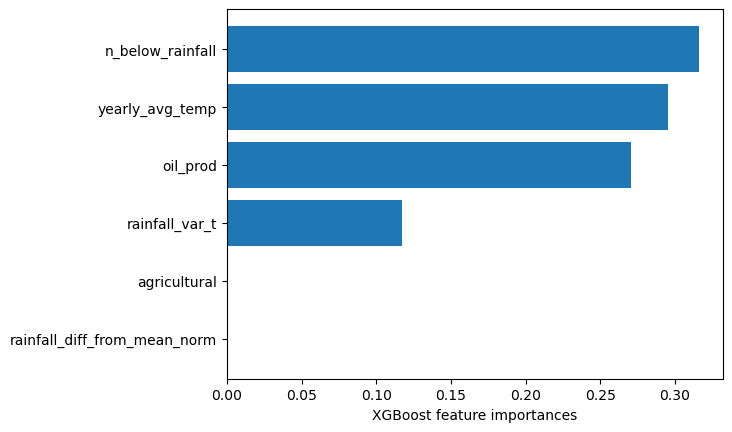

In [29]:
print(grid.best_params_, grid_cv.best_score_)
best_model = grid.best_estimator_.named_steps['xgb']
sorted_idx = best_model.estimator.feature_importances_.argsort()
plt.barh(X.columns[sorted_idx], best_model.estimator.feature_importances_[sorted_idx])
plt.xlabel('XGBoost feature importances')
plt.plot()

[0]	validation_0-rmse:0.06776
[1]	validation_0-rmse:0.06776
[2]	validation_0-rmse:0.06776
[3]	validation_0-rmse:0.06771
[4]	validation_0-rmse:0.06770
[5]	validation_0-rmse:0.06770
[6]	validation_0-rmse:0.06767
[7]	validation_0-rmse:0.06766
[8]	validation_0-rmse:0.06766
[9]	validation_0-rmse:0.06766
[0]	validation_0-rmse:0.06547
[1]	validation_0-rmse:0.06539
[2]	validation_0-rmse:0.06542
[3]	validation_0-rmse:0.06538
[4]	validation_0-rmse:0.06539
[5]	validation_0-rmse:0.06542
[6]	validation_0-rmse:0.06547
[7]	validation_0-rmse:0.06547
[8]	validation_0-rmse:0.06548
[9]	validation_0-rmse:0.06550
[0]	validation_0-rmse:0.05739
[1]	validation_0-rmse:0.05737
[2]	validation_0-rmse:0.05734
[3]	validation_0-rmse:0.05734
[4]	validation_0-rmse:0.05735
[5]	validation_0-rmse:0.05737
[6]	validation_0-rmse:0.05737
[7]	validation_0-rmse:0.05736
[8]	validation_0-rmse:0.05736
[9]	validation_0-rmse:0.05734
[0]	validation_0-rmse:0.07189
[1]	validation_0-rmse:0.07189
[2]	validation_0-rmse:0.07170
[3]	valida

/usr/local/Caskroom/miniconda/base/envs/nature-and-conflicts-irem/lib/python3.12/site-packages/sklearn/pipeline.py:62: FutureWarning: This Pipeline instance is not fitted yet. Call 'fit' with appropriate arguments before using other methods such as transform, predict, etc. This will raise an error in 1.8 instead of the current warning.
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/nature-and-conflicts-irem/lib/python3.12/site-packages/sklearn/pipeline.py:62: FutureWarning: This Pipeline instance is not fitted yet. Call 'fit' with appropriate arguments before using other methods such as transform, predict, etc. This will raise an error in 1.8 instead of the current warning.
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/nature-and-conflicts-irem/lib/python3.12/site-packages/sklearn/pipeline.py:62: FutureWarning: This Pipeline instance is not fitted yet. Call 'fit' with appropriate arguments before using other methods such as transform, predict, etc. This will raise 

[5]	validation_0-rmse:0.05771
[6]	validation_0-rmse:0.05774
[7]	validation_0-rmse:0.05781
[8]	validation_0-rmse:0.05781
[9]	validation_0-rmse:0.05780
[0]	validation_0-rmse:0.05900
[1]	validation_0-rmse:0.05882
[2]	validation_0-rmse:0.05868
[3]	validation_0-rmse:0.05868
[4]	validation_0-rmse:0.05862
[5]	validation_0-rmse:0.05856
[6]	validation_0-rmse:0.05856
[7]	validation_0-rmse:0.05857
[8]	validation_0-rmse:0.05857
[9]	validation_0-rmse:0.05854
[10]	validation_0-rmse:0.05854
[11]	validation_0-rmse:0.05851
[12]	validation_0-rmse:0.05850
[13]	validation_0-rmse:0.05852
[14]	validation_0-rmse:0.05855
[15]	validation_0-rmse:0.05853
[16]	validation_0-rmse:0.05848
[17]	validation_0-rmse:0.05846
[18]	validation_0-rmse:0.05850
[19]	validation_0-rmse:0.05850
[20]	validation_0-rmse:0.05851
[21]	validation_0-rmse:0.05849
[22]	validation_0-rmse:0.05850
[23]	validation_0-rmse:0.05849
[24]	validation_0-rmse:0.05852
[25]	validation_0-rmse:0.05852
[26]	validation_0-rmse:0.05855
[27]	validation_0-rmse:

/usr/local/Caskroom/miniconda/base/envs/nature-and-conflicts-irem/lib/python3.12/site-packages/sklearn/pipeline.py:62: FutureWarning: This Pipeline instance is not fitted yet. Call 'fit' with appropriate arguments before using other methods such as transform, predict, etc. This will raise an error in 1.8 instead of the current warning.
  warnings.warn(


[87]	validation_0-rmse:0.05880
[88]	validation_0-rmse:0.05882
[89]	validation_0-rmse:0.05885
[90]	validation_0-rmse:0.05885
[91]	validation_0-rmse:0.05885
[92]	validation_0-rmse:0.05888
[93]	validation_0-rmse:0.05888
[94]	validation_0-rmse:0.05888
[95]	validation_0-rmse:0.05889
[96]	validation_0-rmse:0.05889
[97]	validation_0-rmse:0.05890
[98]	validation_0-rmse:0.05889
[99]	validation_0-rmse:0.05890
[0]	validation_0-rmse:0.07287
[1]	validation_0-rmse:0.07272
[2]	validation_0-rmse:0.07270
[3]	validation_0-rmse:0.07262
[4]	validation_0-rmse:0.07261
[5]	validation_0-rmse:0.07255
[6]	validation_0-rmse:0.07258
[7]	validation_0-rmse:0.07259
[8]	validation_0-rmse:0.07254
[9]	validation_0-rmse:0.07253
[10]	validation_0-rmse:0.07250
[11]	validation_0-rmse:0.07250
[12]	validation_0-rmse:0.07250
[13]	validation_0-rmse:0.07254
[14]	validation_0-rmse:0.07256
[15]	validation_0-rmse:0.07257
[16]	validation_0-rmse:0.07255
[17]	validation_0-rmse:0.07255
[18]	validation_0-rmse:0.07255
[19]	validation_0-

/usr/local/Caskroom/miniconda/base/envs/nature-and-conflicts-irem/lib/python3.12/site-packages/sklearn/pipeline.py:62: FutureWarning: This Pipeline instance is not fitted yet. Call 'fit' with appropriate arguments before using other methods such as transform, predict, etc. This will raise an error in 1.8 instead of the current warning.
  warnings.warn(


[93]	validation_0-rmse:0.07254
[94]	validation_0-rmse:0.07255
[95]	validation_0-rmse:0.07255
[96]	validation_0-rmse:0.07255
[97]	validation_0-rmse:0.07255
[98]	validation_0-rmse:0.07257
[99]	validation_0-rmse:0.07256
[0]	validation_0-rmse:0.05863
[1]	validation_0-rmse:0.05867
[2]	validation_0-rmse:0.05865
[3]	validation_0-rmse:0.05867
[4]	validation_0-rmse:0.05870
[5]	validation_0-rmse:0.05869
[6]	validation_0-rmse:0.05868
[7]	validation_0-rmse:0.05870
[8]	validation_0-rmse:0.05870
[9]	validation_0-rmse:0.05870
[10]	validation_0-rmse:0.05868
[11]	validation_0-rmse:0.05870
[12]	validation_0-rmse:0.05868
[13]	validation_0-rmse:0.05868
[14]	validation_0-rmse:0.05868
[15]	validation_0-rmse:0.05868
[16]	validation_0-rmse:0.05869
[17]	validation_0-rmse:0.05869
[18]	validation_0-rmse:0.05869
[19]	validation_0-rmse:0.05869
[20]	validation_0-rmse:0.05869
[21]	validation_0-rmse:0.05868
[22]	validation_0-rmse:0.05870
[23]	validation_0-rmse:0.05872
[24]	validation_0-rmse:0.05871
[25]	validation_0-

/usr/local/Caskroom/miniconda/base/envs/nature-and-conflicts-irem/lib/python3.12/site-packages/sklearn/pipeline.py:62: FutureWarning: This Pipeline instance is not fitted yet. Call 'fit' with appropriate arguments before using other methods such as transform, predict, etc. This will raise an error in 1.8 instead of the current warning.
  warnings.warn(


[92]	validation_0-rmse:0.05881
[93]	validation_0-rmse:0.05880
[94]	validation_0-rmse:0.05880
[95]	validation_0-rmse:0.05880
[96]	validation_0-rmse:0.05880
[97]	validation_0-rmse:0.05880
[98]	validation_0-rmse:0.05879
[99]	validation_0-rmse:0.05878
[0]	validation_0-rmse:0.07260
[1]	validation_0-rmse:0.07260
[2]	validation_0-rmse:0.07260
[3]	validation_0-rmse:0.07254
[4]	validation_0-rmse:0.07251
[5]	validation_0-rmse:0.07251
[6]	validation_0-rmse:0.07248
[7]	validation_0-rmse:0.07246
[8]	validation_0-rmse:0.07245
[9]	validation_0-rmse:0.07243
[10]	validation_0-rmse:0.07245
[11]	validation_0-rmse:0.07245
[12]	validation_0-rmse:0.07243
[13]	validation_0-rmse:0.07245
[14]	validation_0-rmse:0.07244
[15]	validation_0-rmse:0.07244
[16]	validation_0-rmse:0.07245
[17]	validation_0-rmse:0.07243
[18]	validation_0-rmse:0.07241
[19]	validation_0-rmse:0.07242
[20]	validation_0-rmse:0.07242
[21]	validation_0-rmse:0.07243
[22]	validation_0-rmse:0.07242
[23]	validation_0-rmse:0.07244
[24]	validation_0-

/usr/local/Caskroom/miniconda/base/envs/nature-and-conflicts-irem/lib/python3.12/site-packages/sklearn/pipeline.py:62: FutureWarning: This Pipeline instance is not fitted yet. Call 'fit' with appropriate arguments before using other methods such as transform, predict, etc. This will raise an error in 1.8 instead of the current warning.
  warnings.warn(


[92]	validation_0-rmse:0.07254
[93]	validation_0-rmse:0.07255
[94]	validation_0-rmse:0.07254
[95]	validation_0-rmse:0.07255
[96]	validation_0-rmse:0.07255
[97]	validation_0-rmse:0.07256
[98]	validation_0-rmse:0.07255
[99]	validation_0-rmse:0.07254
[0]	validation_0-rmse:0.05967
[1]	validation_0-rmse:0.05955
[2]	validation_0-rmse:0.05955
[3]	validation_0-rmse:0.05953
[4]	validation_0-rmse:0.05951
[5]	validation_0-rmse:0.05943
[6]	validation_0-rmse:0.05944
[7]	validation_0-rmse:0.05942
[8]	validation_0-rmse:0.05943
[9]	validation_0-rmse:0.05932
[10]	validation_0-rmse:0.05931
[11]	validation_0-rmse:0.05931
[12]	validation_0-rmse:0.05929
[13]	validation_0-rmse:0.05930
[14]	validation_0-rmse:0.05929
[15]	validation_0-rmse:0.05930
[16]	validation_0-rmse:0.05928
[17]	validation_0-rmse:0.05929
[18]	validation_0-rmse:0.05922
[19]	validation_0-rmse:0.05922
[20]	validation_0-rmse:0.05920
[21]	validation_0-rmse:0.05922
[22]	validation_0-rmse:0.05922
[23]	validation_0-rmse:0.05919
[24]	validation_0-

/usr/local/Caskroom/miniconda/base/envs/nature-and-conflicts-irem/lib/python3.12/site-packages/sklearn/pipeline.py:62: FutureWarning: This Pipeline instance is not fitted yet. Call 'fit' with appropriate arguments before using other methods such as transform, predict, etc. This will raise an error in 1.8 instead of the current warning.
  warnings.warn(


[94]	validation_0-rmse:0.05905
[95]	validation_0-rmse:0.05904
[96]	validation_0-rmse:0.05905
[97]	validation_0-rmse:0.05904
[98]	validation_0-rmse:0.05905
[99]	validation_0-rmse:0.05904
[0]	validation_0-rmse:0.06966
[1]	validation_0-rmse:0.06964
[2]	validation_0-rmse:0.06965
[3]	validation_0-rmse:0.06959
[4]	validation_0-rmse:0.06963
[5]	validation_0-rmse:0.06959
[6]	validation_0-rmse:0.06961
[7]	validation_0-rmse:0.06961
[8]	validation_0-rmse:0.06963
[9]	validation_0-rmse:0.06964
[10]	validation_0-rmse:0.06960
[11]	validation_0-rmse:0.06964
[12]	validation_0-rmse:0.06964
[13]	validation_0-rmse:0.06964
[14]	validation_0-rmse:0.06963
[15]	validation_0-rmse:0.06966
[16]	validation_0-rmse:0.06965
[17]	validation_0-rmse:0.06962
[18]	validation_0-rmse:0.06962
[19]	validation_0-rmse:0.06964
[20]	validation_0-rmse:0.06965
[21]	validation_0-rmse:0.06964
[22]	validation_0-rmse:0.06966
[23]	validation_0-rmse:0.06968
[24]	validation_0-rmse:0.06966
[25]	validation_0-rmse:0.06965
[26]	validation_0-

/usr/local/Caskroom/miniconda/base/envs/nature-and-conflicts-irem/lib/python3.12/site-packages/sklearn/pipeline.py:62: FutureWarning: This Pipeline instance is not fitted yet. Call 'fit' with appropriate arguments before using other methods such as transform, predict, etc. This will raise an error in 1.8 instead of the current warning.
  warnings.warn(


[70]	validation_0-rmse:0.06974
[71]	validation_0-rmse:0.06975
[72]	validation_0-rmse:0.06974
[73]	validation_0-rmse:0.06975
[74]	validation_0-rmse:0.06974
[75]	validation_0-rmse:0.06975
[76]	validation_0-rmse:0.06974
[77]	validation_0-rmse:0.06975
[78]	validation_0-rmse:0.06974
[79]	validation_0-rmse:0.06974
[80]	validation_0-rmse:0.06975
[81]	validation_0-rmse:0.06974
[82]	validation_0-rmse:0.06974
[83]	validation_0-rmse:0.06975
[84]	validation_0-rmse:0.06974
[85]	validation_0-rmse:0.06976
[86]	validation_0-rmse:0.06975
[87]	validation_0-rmse:0.06974
[88]	validation_0-rmse:0.06975
[89]	validation_0-rmse:0.06974
[90]	validation_0-rmse:0.06975
[91]	validation_0-rmse:0.06974
[92]	validation_0-rmse:0.06974
[93]	validation_0-rmse:0.06975
[94]	validation_0-rmse:0.06974
[95]	validation_0-rmse:0.06973
[96]	validation_0-rmse:0.06974
[97]	validation_0-rmse:0.06974
[98]	validation_0-rmse:0.06974
[99]	validation_0-rmse:0.06973
[100]	validation_0-rmse:0.06974
[101]	validation_0-rmse:0.06974
[102]	

/usr/local/Caskroom/miniconda/base/envs/nature-and-conflicts-irem/lib/python3.12/site-packages/sklearn/pipeline.py:62: FutureWarning: This Pipeline instance is not fitted yet. Call 'fit' with appropriate arguments before using other methods such as transform, predict, etc. This will raise an error in 1.8 instead of the current warning.
  warnings.warn(


[60]	validation_0-rmse:0.07263
[61]	validation_0-rmse:0.07263
[62]	validation_0-rmse:0.07263
[63]	validation_0-rmse:0.07262
[64]	validation_0-rmse:0.07261
[65]	validation_0-rmse:0.07264
[66]	validation_0-rmse:0.07264
[67]	validation_0-rmse:0.07264
[68]	validation_0-rmse:0.07266
[69]	validation_0-rmse:0.07267
[70]	validation_0-rmse:0.07266
[71]	validation_0-rmse:0.07267
[72]	validation_0-rmse:0.07266
[73]	validation_0-rmse:0.07267
[74]	validation_0-rmse:0.07267
[75]	validation_0-rmse:0.07268
[76]	validation_0-rmse:0.07268
[77]	validation_0-rmse:0.07267
[78]	validation_0-rmse:0.07268
[79]	validation_0-rmse:0.07269
[80]	validation_0-rmse:0.07269
[81]	validation_0-rmse:0.07269
[82]	validation_0-rmse:0.07269
[83]	validation_0-rmse:0.07269
[84]	validation_0-rmse:0.07269
[85]	validation_0-rmse:0.07271
[86]	validation_0-rmse:0.07273
[87]	validation_0-rmse:0.07271
[88]	validation_0-rmse:0.07273
[89]	validation_0-rmse:0.07273
[90]	validation_0-rmse:0.07273
[91]	validation_0-rmse:0.07274
[92]	val

/usr/local/Caskroom/miniconda/base/envs/nature-and-conflicts-irem/lib/python3.12/site-packages/sklearn/pipeline.py:62: FutureWarning: This Pipeline instance is not fitted yet. Call 'fit' with appropriate arguments before using other methods such as transform, predict, etc. This will raise an error in 1.8 instead of the current warning.
  warnings.warn(


[89]	validation_0-rmse:0.07079
[90]	validation_0-rmse:0.07079
[91]	validation_0-rmse:0.07079
[92]	validation_0-rmse:0.07080
[93]	validation_0-rmse:0.07079
[94]	validation_0-rmse:0.07080
[95]	validation_0-rmse:0.07079
[96]	validation_0-rmse:0.07080
[97]	validation_0-rmse:0.07079
[98]	validation_0-rmse:0.07080
[99]	validation_0-rmse:0.07079
[100]	validation_0-rmse:0.07080
[101]	validation_0-rmse:0.07079
[102]	validation_0-rmse:0.07080
[103]	validation_0-rmse:0.07080
[104]	validation_0-rmse:0.07080
[105]	validation_0-rmse:0.07080
[106]	validation_0-rmse:0.07080
[107]	validation_0-rmse:0.07080
[108]	validation_0-rmse:0.07081
[109]	validation_0-rmse:0.07080
[110]	validation_0-rmse:0.07081
[111]	validation_0-rmse:0.07081
[112]	validation_0-rmse:0.07080
[113]	validation_0-rmse:0.07081
[114]	validation_0-rmse:0.07080
[115]	validation_0-rmse:0.07081
[116]	validation_0-rmse:0.07080
[117]	validation_0-rmse:0.07081
[118]	validation_0-rmse:0.07080
[119]	validation_0-rmse:0.07081
[120]	validation_0-

/usr/local/Caskroom/miniconda/base/envs/nature-and-conflicts-irem/lib/python3.12/site-packages/sklearn/pipeline.py:62: FutureWarning: This Pipeline instance is not fitted yet. Call 'fit' with appropriate arguments before using other methods such as transform, predict, etc. This will raise an error in 1.8 instead of the current warning.
  warnings.warn(


[58]	validation_0-rmse:0.05748
[59]	validation_0-rmse:0.05750
[60]	validation_0-rmse:0.05750
[61]	validation_0-rmse:0.05748
[62]	validation_0-rmse:0.05748
[63]	validation_0-rmse:0.05750
[64]	validation_0-rmse:0.05747
[65]	validation_0-rmse:0.05747
[66]	validation_0-rmse:0.05747
[67]	validation_0-rmse:0.05748
[68]	validation_0-rmse:0.05748
[69]	validation_0-rmse:0.05748
[70]	validation_0-rmse:0.05749
[71]	validation_0-rmse:0.05748
[72]	validation_0-rmse:0.05748
[73]	validation_0-rmse:0.05749
[74]	validation_0-rmse:0.05748
[75]	validation_0-rmse:0.05749
[76]	validation_0-rmse:0.05748
[77]	validation_0-rmse:0.05747
[78]	validation_0-rmse:0.05748
[79]	validation_0-rmse:0.05748
[80]	validation_0-rmse:0.05748
[81]	validation_0-rmse:0.05748
[82]	validation_0-rmse:0.05749
[83]	validation_0-rmse:0.05748
[84]	validation_0-rmse:0.05749
[85]	validation_0-rmse:0.05750
[86]	validation_0-rmse:0.05750
[87]	validation_0-rmse:0.05751
[88]	validation_0-rmse:0.05751
[89]	validation_0-rmse:0.05750
[90]	val

/usr/local/Caskroom/miniconda/base/envs/nature-and-conflicts-irem/lib/python3.12/site-packages/sklearn/pipeline.py:62: FutureWarning: This Pipeline instance is not fitted yet. Call 'fit' with appropriate arguments before using other methods such as transform, predict, etc. This will raise an error in 1.8 instead of the current warning.
  warnings.warn(


[69]	validation_0-rmse:0.06275
[70]	validation_0-rmse:0.06274
[71]	validation_0-rmse:0.06275
[72]	validation_0-rmse:0.06275
[73]	validation_0-rmse:0.06275
[74]	validation_0-rmse:0.06276
[75]	validation_0-rmse:0.06276
[76]	validation_0-rmse:0.06276
[77]	validation_0-rmse:0.06277
[78]	validation_0-rmse:0.06277
[79]	validation_0-rmse:0.06275
[80]	validation_0-rmse:0.06277
[81]	validation_0-rmse:0.06277
[82]	validation_0-rmse:0.06278
[83]	validation_0-rmse:0.06278
[84]	validation_0-rmse:0.06278
[85]	validation_0-rmse:0.06277
[86]	validation_0-rmse:0.06278
[87]	validation_0-rmse:0.06278
[88]	validation_0-rmse:0.06280
[89]	validation_0-rmse:0.06280
[90]	validation_0-rmse:0.06280
[91]	validation_0-rmse:0.06280
[92]	validation_0-rmse:0.06281
[93]	validation_0-rmse:0.06280
[94]	validation_0-rmse:0.06281
[95]	validation_0-rmse:0.06281
[96]	validation_0-rmse:0.06281
[97]	validation_0-rmse:0.06281
[98]	validation_0-rmse:0.06282
[99]	validation_0-rmse:0.06281
[100]	validation_0-rmse:0.06282
[101]	v

/usr/local/Caskroom/miniconda/base/envs/nature-and-conflicts-irem/lib/python3.12/site-packages/sklearn/pipeline.py:62: FutureWarning: This Pipeline instance is not fitted yet. Call 'fit' with appropriate arguments before using other methods such as transform, predict, etc. This will raise an error in 1.8 instead of the current warning.
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/nature-and-conflicts-irem/lib/python3.12/site-packages/sklearn/pipeline.py:62: FutureWarning: This Pipeline instance is not fitted yet. Call 'fit' with appropriate arguments before using other methods such as transform, predict, etc. This will raise an error in 1.8 instead of the current warning.
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/nature-and-conflicts-irem/lib/python3.12/site-packages/sklearn/pipeline.py:62: FutureWarning: This Pipeline instance is not fitted yet. Call 'fit' with appropriate arguments before using other methods such as transform, predict, etc. This will raise 

[0]	validation_0-rmse:0.05531
[1]	validation_0-rmse:0.05524
[2]	validation_0-rmse:0.05525
[3]	validation_0-rmse:0.05531
[4]	validation_0-rmse:0.05524
[5]	validation_0-rmse:0.05526
[6]	validation_0-rmse:0.05537
[7]	validation_0-rmse:0.05540
[8]	validation_0-rmse:0.05541
[9]	validation_0-rmse:0.05548
[0]	validation_0-rmse:0.06981
[1]	validation_0-rmse:0.06972
[2]	validation_0-rmse:0.06970
[3]	validation_0-rmse:0.06966
[4]	validation_0-rmse:0.06963
[5]	validation_0-rmse:0.06961
[6]	validation_0-rmse:0.06963
[7]	validation_0-rmse:0.06962
[8]	validation_0-rmse:0.06962
[9]	validation_0-rmse:0.06962
[10]	validation_0-rmse:0.06960
[11]	validation_0-rmse:0.06972
[12]	validation_0-rmse:0.06976
[13]	validation_0-rmse:0.06974
[14]	validation_0-rmse:0.06975
[15]	validation_0-rmse:0.06974
[16]	validation_0-rmse:0.06978
[17]	validation_0-rmse:0.06973
[18]	validation_0-rmse:0.06971
[19]	validation_0-rmse:0.06978
[20]	validation_0-rmse:0.06963
[21]	validation_0-rmse:0.06964
[22]	validation_0-rmse:0.069

/usr/local/Caskroom/miniconda/base/envs/nature-and-conflicts-irem/lib/python3.12/site-packages/sklearn/pipeline.py:62: FutureWarning: This Pipeline instance is not fitted yet. Call 'fit' with appropriate arguments before using other methods such as transform, predict, etc. This will raise an error in 1.8 instead of the current warning.
  warnings.warn(


[72]	validation_0-rmse:0.07093
[73]	validation_0-rmse:0.07093
[74]	validation_0-rmse:0.07110
[75]	validation_0-rmse:0.07110
[76]	validation_0-rmse:0.07110
[77]	validation_0-rmse:0.07117
[78]	validation_0-rmse:0.07119
[79]	validation_0-rmse:0.07120
[80]	validation_0-rmse:0.07126
[81]	validation_0-rmse:0.07127
[82]	validation_0-rmse:0.07136
[83]	validation_0-rmse:0.07138
[84]	validation_0-rmse:0.07140
[85]	validation_0-rmse:0.07141
[86]	validation_0-rmse:0.07141
[87]	validation_0-rmse:0.07140
[88]	validation_0-rmse:0.07130
[89]	validation_0-rmse:0.07132
[90]	validation_0-rmse:0.07134
[91]	validation_0-rmse:0.07135
[92]	validation_0-rmse:0.07132
[93]	validation_0-rmse:0.07125
[94]	validation_0-rmse:0.07125
[95]	validation_0-rmse:0.07124
[96]	validation_0-rmse:0.07124
[97]	validation_0-rmse:0.07124
[98]	validation_0-rmse:0.07126
[99]	validation_0-rmse:0.07125
[0]	validation_0-rmse:0.07959
[1]	validation_0-rmse:0.07936
[2]	validation_0-rmse:0.07932
[3]	validation_0-rmse:0.07941
[4]	validati

/usr/local/Caskroom/miniconda/base/envs/nature-and-conflicts-irem/lib/python3.12/site-packages/sklearn/pipeline.py:62: FutureWarning: This Pipeline instance is not fitted yet. Call 'fit' with appropriate arguments before using other methods such as transform, predict, etc. This will raise an error in 1.8 instead of the current warning.
  warnings.warn(


[68]	validation_0-rmse:0.08055
[69]	validation_0-rmse:0.08054
[70]	validation_0-rmse:0.08058
[71]	validation_0-rmse:0.08055
[72]	validation_0-rmse:0.08061
[73]	validation_0-rmse:0.08066
[74]	validation_0-rmse:0.08067
[75]	validation_0-rmse:0.08070
[76]	validation_0-rmse:0.08071
[77]	validation_0-rmse:0.08071
[78]	validation_0-rmse:0.08073
[79]	validation_0-rmse:0.08075
[80]	validation_0-rmse:0.08074
[81]	validation_0-rmse:0.08074
[82]	validation_0-rmse:0.08078
[83]	validation_0-rmse:0.08079
[84]	validation_0-rmse:0.08078
[85]	validation_0-rmse:0.08080
[86]	validation_0-rmse:0.08078
[87]	validation_0-rmse:0.08076
[88]	validation_0-rmse:0.08077
[89]	validation_0-rmse:0.08075
[90]	validation_0-rmse:0.08080
[91]	validation_0-rmse:0.08078
[92]	validation_0-rmse:0.08081
[93]	validation_0-rmse:0.08080
[94]	validation_0-rmse:0.08080
[95]	validation_0-rmse:0.08092
[96]	validation_0-rmse:0.08092
[97]	validation_0-rmse:0.08093
[98]	validation_0-rmse:0.08096
[99]	validation_0-rmse:0.08097
[0]	vali

/usr/local/Caskroom/miniconda/base/envs/nature-and-conflicts-irem/lib/python3.12/site-packages/sklearn/pipeline.py:62: FutureWarning: This Pipeline instance is not fitted yet. Call 'fit' with appropriate arguments before using other methods such as transform, predict, etc. This will raise an error in 1.8 instead of the current warning.
  warnings.warn(


[59]	validation_0-rmse:0.05957
[60]	validation_0-rmse:0.05963
[61]	validation_0-rmse:0.05968
[62]	validation_0-rmse:0.05967
[63]	validation_0-rmse:0.05972
[64]	validation_0-rmse:0.05974
[65]	validation_0-rmse:0.05974
[66]	validation_0-rmse:0.05973
[67]	validation_0-rmse:0.05974
[68]	validation_0-rmse:0.05974
[69]	validation_0-rmse:0.05973
[70]	validation_0-rmse:0.05980
[71]	validation_0-rmse:0.05983
[72]	validation_0-rmse:0.05985
[73]	validation_0-rmse:0.05989
[74]	validation_0-rmse:0.05991
[75]	validation_0-rmse:0.05989
[76]	validation_0-rmse:0.05986
[77]	validation_0-rmse:0.05984
[78]	validation_0-rmse:0.05988
[79]	validation_0-rmse:0.05991
[80]	validation_0-rmse:0.05991
[81]	validation_0-rmse:0.05997
[82]	validation_0-rmse:0.05999
[83]	validation_0-rmse:0.05999
[84]	validation_0-rmse:0.05998
[85]	validation_0-rmse:0.06002
[86]	validation_0-rmse:0.06002
[87]	validation_0-rmse:0.06004
[88]	validation_0-rmse:0.05997
[89]	validation_0-rmse:0.06004
[90]	validation_0-rmse:0.06005
[91]	val

/usr/local/Caskroom/miniconda/base/envs/nature-and-conflicts-irem/lib/python3.12/site-packages/sklearn/pipeline.py:62: FutureWarning: This Pipeline instance is not fitted yet. Call 'fit' with appropriate arguments before using other methods such as transform, predict, etc. This will raise an error in 1.8 instead of the current warning.
  warnings.warn(


[54]	validation_0-rmse:0.07683
[55]	validation_0-rmse:0.07680
[56]	validation_0-rmse:0.07680
[57]	validation_0-rmse:0.07685
[58]	validation_0-rmse:0.07683
[59]	validation_0-rmse:0.07684
[60]	validation_0-rmse:0.07687
[61]	validation_0-rmse:0.07688
[62]	validation_0-rmse:0.07689
[63]	validation_0-rmse:0.07690
[64]	validation_0-rmse:0.07690
[65]	validation_0-rmse:0.07692
[66]	validation_0-rmse:0.07695
[67]	validation_0-rmse:0.07696
[68]	validation_0-rmse:0.07701
[69]	validation_0-rmse:0.07698
[70]	validation_0-rmse:0.07706
[71]	validation_0-rmse:0.07703
[72]	validation_0-rmse:0.07702
[73]	validation_0-rmse:0.07703
[74]	validation_0-rmse:0.07704
[75]	validation_0-rmse:0.07706
[76]	validation_0-rmse:0.07712
[77]	validation_0-rmse:0.07710
[78]	validation_0-rmse:0.07713
[79]	validation_0-rmse:0.07714
[80]	validation_0-rmse:0.07714
[81]	validation_0-rmse:0.07717
[82]	validation_0-rmse:0.07720
[83]	validation_0-rmse:0.07721
[84]	validation_0-rmse:0.07722
[85]	validation_0-rmse:0.07728
[86]	val

/usr/local/Caskroom/miniconda/base/envs/nature-and-conflicts-irem/lib/python3.12/site-packages/sklearn/pipeline.py:62: FutureWarning: This Pipeline instance is not fitted yet. Call 'fit' with appropriate arguments before using other methods such as transform, predict, etc. This will raise an error in 1.8 instead of the current warning.
  warnings.warn(


[55]	validation_0-rmse:0.05725
[56]	validation_0-rmse:0.05735
[57]	validation_0-rmse:0.05730
[58]	validation_0-rmse:0.05730
[59]	validation_0-rmse:0.05730
[60]	validation_0-rmse:0.05736
[61]	validation_0-rmse:0.05743
[62]	validation_0-rmse:0.05738
[63]	validation_0-rmse:0.05743
[64]	validation_0-rmse:0.05740
[65]	validation_0-rmse:0.05740
[66]	validation_0-rmse:0.05746
[67]	validation_0-rmse:0.05745
[68]	validation_0-rmse:0.05752
[69]	validation_0-rmse:0.05757
[70]	validation_0-rmse:0.05756
[71]	validation_0-rmse:0.05752
[72]	validation_0-rmse:0.05752
[73]	validation_0-rmse:0.05752
[74]	validation_0-rmse:0.05754
[75]	validation_0-rmse:0.05754
[76]	validation_0-rmse:0.05757
[77]	validation_0-rmse:0.05762
[78]	validation_0-rmse:0.05770
[79]	validation_0-rmse:0.05785
[80]	validation_0-rmse:0.05795
[81]	validation_0-rmse:0.05797
[82]	validation_0-rmse:0.05797
[83]	validation_0-rmse:0.05801
[84]	validation_0-rmse:0.05811
[85]	validation_0-rmse:0.05811
[86]	validation_0-rmse:0.05844
[87]	val

/usr/local/Caskroom/miniconda/base/envs/nature-and-conflicts-irem/lib/python3.12/site-packages/sklearn/pipeline.py:62: FutureWarning: This Pipeline instance is not fitted yet. Call 'fit' with appropriate arguments before using other methods such as transform, predict, etc. This will raise an error in 1.8 instead of the current warning.
  warnings.warn(


[40]	validation_0-rmse:0.07365
[41]	validation_0-rmse:0.07362
[42]	validation_0-rmse:0.07370
[43]	validation_0-rmse:0.07365
[44]	validation_0-rmse:0.07366
[45]	validation_0-rmse:0.07368
[46]	validation_0-rmse:0.07360
[47]	validation_0-rmse:0.07361
[48]	validation_0-rmse:0.07361
[49]	validation_0-rmse:0.07362
[50]	validation_0-rmse:0.07370
[51]	validation_0-rmse:0.07367
[52]	validation_0-rmse:0.07368
[53]	validation_0-rmse:0.07367
[54]	validation_0-rmse:0.07370
[55]	validation_0-rmse:0.07373
[56]	validation_0-rmse:0.07378
[57]	validation_0-rmse:0.07381
[58]	validation_0-rmse:0.07386
[59]	validation_0-rmse:0.07382
[60]	validation_0-rmse:0.07381
[61]	validation_0-rmse:0.07386
[62]	validation_0-rmse:0.07388
[63]	validation_0-rmse:0.07389
[64]	validation_0-rmse:0.07388
[65]	validation_0-rmse:0.07389
[66]	validation_0-rmse:0.07394
[67]	validation_0-rmse:0.07400
[68]	validation_0-rmse:0.07399
[69]	validation_0-rmse:0.07403
[70]	validation_0-rmse:0.07405
[71]	validation_0-rmse:0.07404
[72]	val

/usr/local/Caskroom/miniconda/base/envs/nature-and-conflicts-irem/lib/python3.12/site-packages/sklearn/pipeline.py:62: FutureWarning: This Pipeline instance is not fitted yet. Call 'fit' with appropriate arguments before using other methods such as transform, predict, etc. This will raise an error in 1.8 instead of the current warning.
  warnings.warn(


[53]	validation_0-rmse:0.06874
[54]	validation_0-rmse:0.06878
[55]	validation_0-rmse:0.06877
[56]	validation_0-rmse:0.06879
[57]	validation_0-rmse:0.06877
[58]	validation_0-rmse:0.06879
[59]	validation_0-rmse:0.06877
[60]	validation_0-rmse:0.06879
[61]	validation_0-rmse:0.06877
[62]	validation_0-rmse:0.06876
[63]	validation_0-rmse:0.06891
[64]	validation_0-rmse:0.06892
[65]	validation_0-rmse:0.06891
[66]	validation_0-rmse:0.06893
[67]	validation_0-rmse:0.06894
[68]	validation_0-rmse:0.06894
[69]	validation_0-rmse:0.06907
[70]	validation_0-rmse:0.06910
[71]	validation_0-rmse:0.06911
[72]	validation_0-rmse:0.06911
[73]	validation_0-rmse:0.06925
[74]	validation_0-rmse:0.06925
[75]	validation_0-rmse:0.06928
[76]	validation_0-rmse:0.06928
[77]	validation_0-rmse:0.06928
[78]	validation_0-rmse:0.06929
[79]	validation_0-rmse:0.06932
[80]	validation_0-rmse:0.06936
[81]	validation_0-rmse:0.06937
[82]	validation_0-rmse:0.06944
[83]	validation_0-rmse:0.06948
[84]	validation_0-rmse:0.06946
[85]	val

/usr/local/Caskroom/miniconda/base/envs/nature-and-conflicts-irem/lib/python3.12/site-packages/sklearn/pipeline.py:62: FutureWarning: This Pipeline instance is not fitted yet. Call 'fit' with appropriate arguments before using other methods such as transform, predict, etc. This will raise an error in 1.8 instead of the current warning.
  warnings.warn(


[31]	validation_0-rmse:0.06162
[32]	validation_0-rmse:0.06170
[33]	validation_0-rmse:0.06193
[34]	validation_0-rmse:0.06197
[35]	validation_0-rmse:0.06197
[36]	validation_0-rmse:0.06197
[37]	validation_0-rmse:0.06200
[38]	validation_0-rmse:0.06201
[39]	validation_0-rmse:0.06203
[40]	validation_0-rmse:0.06201
[41]	validation_0-rmse:0.06200
[42]	validation_0-rmse:0.06203
[43]	validation_0-rmse:0.06212
[44]	validation_0-rmse:0.06214
[45]	validation_0-rmse:0.06216
[46]	validation_0-rmse:0.06218
[47]	validation_0-rmse:0.06222
[48]	validation_0-rmse:0.06226
[49]	validation_0-rmse:0.06227
[50]	validation_0-rmse:0.06229
[51]	validation_0-rmse:0.06228
[52]	validation_0-rmse:0.06227
[53]	validation_0-rmse:0.06227
[54]	validation_0-rmse:0.06232
[55]	validation_0-rmse:0.06240
[56]	validation_0-rmse:0.06235
[57]	validation_0-rmse:0.06239
[58]	validation_0-rmse:0.06236
[59]	validation_0-rmse:0.06246
[60]	validation_0-rmse:0.06247
[61]	validation_0-rmse:0.06252
[62]	validation_0-rmse:0.06254
[63]	val

/usr/local/Caskroom/miniconda/base/envs/nature-and-conflicts-irem/lib/python3.12/site-packages/sklearn/pipeline.py:62: FutureWarning: This Pipeline instance is not fitted yet. Call 'fit' with appropriate arguments before using other methods such as transform, predict, etc. This will raise an error in 1.8 instead of the current warning.
  warnings.warn(


[39]	validation_0-rmse:0.07436
[40]	validation_0-rmse:0.07438
[41]	validation_0-rmse:0.07441
[42]	validation_0-rmse:0.07440
[43]	validation_0-rmse:0.07439
[44]	validation_0-rmse:0.07430
[45]	validation_0-rmse:0.07427
[46]	validation_0-rmse:0.07426
[47]	validation_0-rmse:0.07422
[48]	validation_0-rmse:0.07420
[49]	validation_0-rmse:0.07420
[50]	validation_0-rmse:0.07420
[51]	validation_0-rmse:0.07421
[52]	validation_0-rmse:0.07424
[53]	validation_0-rmse:0.07436
[54]	validation_0-rmse:0.07437
[55]	validation_0-rmse:0.07439
[56]	validation_0-rmse:0.07441
[57]	validation_0-rmse:0.07442
[58]	validation_0-rmse:0.07443
[59]	validation_0-rmse:0.07446
[60]	validation_0-rmse:0.07449
[61]	validation_0-rmse:0.07448
[62]	validation_0-rmse:0.07455
[63]	validation_0-rmse:0.07455
[64]	validation_0-rmse:0.07455
[65]	validation_0-rmse:0.07457
[66]	validation_0-rmse:0.07454
[67]	validation_0-rmse:0.07457
[68]	validation_0-rmse:0.07456
[69]	validation_0-rmse:0.07457
[70]	validation_0-rmse:0.07456
[71]	val

/usr/local/Caskroom/miniconda/base/envs/nature-and-conflicts-irem/lib/python3.12/site-packages/sklearn/pipeline.py:62: FutureWarning: This Pipeline instance is not fitted yet. Call 'fit' with appropriate arguments before using other methods such as transform, predict, etc. This will raise an error in 1.8 instead of the current warning.
  warnings.warn(


[49]	validation_0-rmse:0.07052
[50]	validation_0-rmse:0.07049
[51]	validation_0-rmse:0.07047
[52]	validation_0-rmse:0.07036
[53]	validation_0-rmse:0.07037
[54]	validation_0-rmse:0.07041
[55]	validation_0-rmse:0.07043
[56]	validation_0-rmse:0.07041
[57]	validation_0-rmse:0.07042
[58]	validation_0-rmse:0.07041
[59]	validation_0-rmse:0.07043
[60]	validation_0-rmse:0.07036
[61]	validation_0-rmse:0.07041
[62]	validation_0-rmse:0.07063
[63]	validation_0-rmse:0.07068
[64]	validation_0-rmse:0.07070
[65]	validation_0-rmse:0.07076
[66]	validation_0-rmse:0.07075
[67]	validation_0-rmse:0.07074
[68]	validation_0-rmse:0.07074
[69]	validation_0-rmse:0.07078
[70]	validation_0-rmse:0.07086
[71]	validation_0-rmse:0.07085
[72]	validation_0-rmse:0.07088
[73]	validation_0-rmse:0.07070
[74]	validation_0-rmse:0.07071
[75]	validation_0-rmse:0.07070
[76]	validation_0-rmse:0.07071
[77]	validation_0-rmse:0.07083
[78]	validation_0-rmse:0.07086
[79]	validation_0-rmse:0.07088
[80]	validation_0-rmse:0.07094
[81]	val

/usr/local/Caskroom/miniconda/base/envs/nature-and-conflicts-irem/lib/python3.12/site-packages/sklearn/pipeline.py:62: FutureWarning: This Pipeline instance is not fitted yet. Call 'fit' with appropriate arguments before using other methods such as transform, predict, etc. This will raise an error in 1.8 instead of the current warning.
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/nature-and-conflicts-irem/lib/python3.12/site-packages/sklearn/pipeline.py:62: FutureWarning: This Pipeline instance is not fitted yet. Call 'fit' with appropriate arguments before using other methods such as transform, predict, etc. This will raise an error in 1.8 instead of the current warning.
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/nature-and-conflicts-irem/lib/python3.12/site-packages/sklearn/pipeline.py:62: FutureWarning: This Pipeline instance is not fitted yet. Call 'fit' with appropriate arguments before using other methods such as transform, predict, etc. This will raise 

[0]	validation_0-rmse:0.05582
[1]	validation_0-rmse:0.05598
[2]	validation_0-rmse:0.05606
[3]	validation_0-rmse:0.05625
[4]	validation_0-rmse:0.05638
[5]	validation_0-rmse:0.05647
[6]	validation_0-rmse:0.05637
[7]	validation_0-rmse:0.05637
[8]	validation_0-rmse:0.05635
[9]	validation_0-rmse:0.05657
[0]	validation_0-rmse:0.07322
[1]	validation_0-rmse:0.07319
[2]	validation_0-rmse:0.07325
[3]	validation_0-rmse:0.07319
[4]	validation_0-rmse:0.07330
[5]	validation_0-rmse:0.07334
[6]	validation_0-rmse:0.07334
[7]	validation_0-rmse:0.07336
[8]	validation_0-rmse:0.07340
[9]	validation_0-rmse:0.07345
[0]	validation_0-rmse:0.05668
[1]	validation_0-rmse:0.05666
[2]	validation_0-rmse:0.05683
[3]	validation_0-rmse:0.05682
[4]	validation_0-rmse:0.05682
[5]	validation_0-rmse:0.05680
[6]	validation_0-rmse:0.05683
[7]	validation_0-rmse:0.05691
[8]	validation_0-rmse:0.05697
[9]	validation_0-rmse:0.05710
[0]	validation_0-rmse:0.07711
[1]	validation_0-rmse:0.07716
[2]	validation_0-rmse:0.07722
[3]	valida

/usr/local/Caskroom/miniconda/base/envs/nature-and-conflicts-irem/lib/python3.12/site-packages/sklearn/pipeline.py:62: FutureWarning: This Pipeline instance is not fitted yet. Call 'fit' with appropriate arguments before using other methods such as transform, predict, etc. This will raise an error in 1.8 instead of the current warning.
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/nature-and-conflicts-irem/lib/python3.12/site-packages/sklearn/pipeline.py:62: FutureWarning: This Pipeline instance is not fitted yet. Call 'fit' with appropriate arguments before using other methods such as transform, predict, etc. This will raise an error in 1.8 instead of the current warning.
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/nature-and-conflicts-irem/lib/python3.12/site-packages/sklearn/pipeline.py:62: FutureWarning: This Pipeline instance is not fitted yet. Call 'fit' with appropriate arguments before using other methods such as transform, predict, etc. This will raise 

[6]	validation_0-rmse:0.07767
[7]	validation_0-rmse:0.07804
[8]	validation_0-rmse:0.07819
[9]	validation_0-rmse:0.07831
[10]	validation_0-rmse:0.07820
[11]	validation_0-rmse:0.07819
[12]	validation_0-rmse:0.07817
[13]	validation_0-rmse:0.07846
[14]	validation_0-rmse:0.07847
[15]	validation_0-rmse:0.07849
[16]	validation_0-rmse:0.07860
[17]	validation_0-rmse:0.07866
[18]	validation_0-rmse:0.07868
[19]	validation_0-rmse:0.07885
[20]	validation_0-rmse:0.07884
[21]	validation_0-rmse:0.07890
[22]	validation_0-rmse:0.07883
[23]	validation_0-rmse:0.07882
[24]	validation_0-rmse:0.07885
[25]	validation_0-rmse:0.07889
[26]	validation_0-rmse:0.07898
[27]	validation_0-rmse:0.07888
[28]	validation_0-rmse:0.07893
[29]	validation_0-rmse:0.07899
[30]	validation_0-rmse:0.07911
[31]	validation_0-rmse:0.07916
[32]	validation_0-rmse:0.07929
[33]	validation_0-rmse:0.07937
[34]	validation_0-rmse:0.07945
[35]	validation_0-rmse:0.07948
[36]	validation_0-rmse:0.07934
[37]	validation_0-rmse:0.07941
[38]	validat

/usr/local/Caskroom/miniconda/base/envs/nature-and-conflicts-irem/lib/python3.12/site-packages/sklearn/pipeline.py:62: FutureWarning: This Pipeline instance is not fitted yet. Call 'fit' with appropriate arguments before using other methods such as transform, predict, etc. This will raise an error in 1.8 instead of the current warning.
  warnings.warn(


[26]	validation_0-rmse:0.06889
[27]	validation_0-rmse:0.06943
[28]	validation_0-rmse:0.06961
[29]	validation_0-rmse:0.06962
[30]	validation_0-rmse:0.06972
[31]	validation_0-rmse:0.06981
[32]	validation_0-rmse:0.06982
[33]	validation_0-rmse:0.06981
[34]	validation_0-rmse:0.07003
[35]	validation_0-rmse:0.07053
[36]	validation_0-rmse:0.07052
[37]	validation_0-rmse:0.07063
[38]	validation_0-rmse:0.07068
[39]	validation_0-rmse:0.07160
[40]	validation_0-rmse:0.07160
[41]	validation_0-rmse:0.07163
[42]	validation_0-rmse:0.07172
[43]	validation_0-rmse:0.07180
[44]	validation_0-rmse:0.07173
[45]	validation_0-rmse:0.07181
[46]	validation_0-rmse:0.07183
[47]	validation_0-rmse:0.07186
[48]	validation_0-rmse:0.07186
[49]	validation_0-rmse:0.07188
[50]	validation_0-rmse:0.07194
[51]	validation_0-rmse:0.07200
[52]	validation_0-rmse:0.07206
[53]	validation_0-rmse:0.07207
[54]	validation_0-rmse:0.07216
[55]	validation_0-rmse:0.07216
[56]	validation_0-rmse:0.07233
[57]	validation_0-rmse:0.07236
[58]	val

/usr/local/Caskroom/miniconda/base/envs/nature-and-conflicts-irem/lib/python3.12/site-packages/sklearn/pipeline.py:62: FutureWarning: This Pipeline instance is not fitted yet. Call 'fit' with appropriate arguments before using other methods such as transform, predict, etc. This will raise an error in 1.8 instead of the current warning.
  warnings.warn(


[40]	validation_0-rmse:0.06773
[41]	validation_0-rmse:0.06777
[42]	validation_0-rmse:0.06774
[43]	validation_0-rmse:0.06776
[44]	validation_0-rmse:0.06777
[45]	validation_0-rmse:0.06779
[46]	validation_0-rmse:0.06779
[47]	validation_0-rmse:0.06783
[48]	validation_0-rmse:0.06786
[49]	validation_0-rmse:0.06791
[50]	validation_0-rmse:0.06786
[51]	validation_0-rmse:0.06786
[52]	validation_0-rmse:0.06789
[53]	validation_0-rmse:0.06790
[54]	validation_0-rmse:0.06794
[55]	validation_0-rmse:0.06797
[56]	validation_0-rmse:0.06797
[57]	validation_0-rmse:0.06797
[58]	validation_0-rmse:0.06803
[59]	validation_0-rmse:0.06809
[60]	validation_0-rmse:0.06808
[61]	validation_0-rmse:0.06807
[62]	validation_0-rmse:0.06808
[63]	validation_0-rmse:0.06808
[64]	validation_0-rmse:0.06814
[65]	validation_0-rmse:0.06816
[66]	validation_0-rmse:0.06834
[67]	validation_0-rmse:0.06850
[68]	validation_0-rmse:0.06858
[69]	validation_0-rmse:0.06853
[70]	validation_0-rmse:0.06850
[71]	validation_0-rmse:0.06848
[72]	val

/usr/local/Caskroom/miniconda/base/envs/nature-and-conflicts-irem/lib/python3.12/site-packages/sklearn/pipeline.py:62: FutureWarning: This Pipeline instance is not fitted yet. Call 'fit' with appropriate arguments before using other methods such as transform, predict, etc. This will raise an error in 1.8 instead of the current warning.
  warnings.warn(


[25]	validation_0-rmse:0.07465
[26]	validation_0-rmse:0.07457
[27]	validation_0-rmse:0.07425
[28]	validation_0-rmse:0.07435
[29]	validation_0-rmse:0.07434
[30]	validation_0-rmse:0.07431
[31]	validation_0-rmse:0.07441
[32]	validation_0-rmse:0.07446
[33]	validation_0-rmse:0.07445
[34]	validation_0-rmse:0.07454
[35]	validation_0-rmse:0.07458
[36]	validation_0-rmse:0.07465
[37]	validation_0-rmse:0.07467
[38]	validation_0-rmse:0.07484
[39]	validation_0-rmse:0.07514
[40]	validation_0-rmse:0.07525
[41]	validation_0-rmse:0.07539
[42]	validation_0-rmse:0.07542
[43]	validation_0-rmse:0.07537
[44]	validation_0-rmse:0.07541
[45]	validation_0-rmse:0.07545
[46]	validation_0-rmse:0.07546
[47]	validation_0-rmse:0.07547
[48]	validation_0-rmse:0.07547
[49]	validation_0-rmse:0.07546
[50]	validation_0-rmse:0.07580
[51]	validation_0-rmse:0.07583
[52]	validation_0-rmse:0.07625
[53]	validation_0-rmse:0.07627
[54]	validation_0-rmse:0.07634
[55]	validation_0-rmse:0.07637
[56]	validation_0-rmse:0.07634
[57]	val

/usr/local/Caskroom/miniconda/base/envs/nature-and-conflicts-irem/lib/python3.12/site-packages/sklearn/pipeline.py:62: FutureWarning: This Pipeline instance is not fitted yet. Call 'fit' with appropriate arguments before using other methods such as transform, predict, etc. This will raise an error in 1.8 instead of the current warning.
  warnings.warn(


[21]	validation_0-rmse:0.07914
[22]	validation_0-rmse:0.07925
[23]	validation_0-rmse:0.07922
[24]	validation_0-rmse:0.07927
[25]	validation_0-rmse:0.07935
[26]	validation_0-rmse:0.07951
[27]	validation_0-rmse:0.07958
[28]	validation_0-rmse:0.07958
[29]	validation_0-rmse:0.07963
[30]	validation_0-rmse:0.07965
[31]	validation_0-rmse:0.07964
[32]	validation_0-rmse:0.07968
[33]	validation_0-rmse:0.07970
[34]	validation_0-rmse:0.07991
[35]	validation_0-rmse:0.08004
[36]	validation_0-rmse:0.07996
[37]	validation_0-rmse:0.08003
[38]	validation_0-rmse:0.08020
[39]	validation_0-rmse:0.08021
[40]	validation_0-rmse:0.08045
[41]	validation_0-rmse:0.08046
[42]	validation_0-rmse:0.08049
[43]	validation_0-rmse:0.08053
[44]	validation_0-rmse:0.08060
[45]	validation_0-rmse:0.08056
[46]	validation_0-rmse:0.08058
[47]	validation_0-rmse:0.08071
[48]	validation_0-rmse:0.08095
[49]	validation_0-rmse:0.08085
[50]	validation_0-rmse:0.08087
[51]	validation_0-rmse:0.08101
[52]	validation_0-rmse:0.08111
[53]	val

/usr/local/Caskroom/miniconda/base/envs/nature-and-conflicts-irem/lib/python3.12/site-packages/sklearn/pipeline.py:62: FutureWarning: This Pipeline instance is not fitted yet. Call 'fit' with appropriate arguments before using other methods such as transform, predict, etc. This will raise an error in 1.8 instead of the current warning.
  warnings.warn(


[41]	validation_0-rmse:0.07657
[42]	validation_0-rmse:0.07666
[43]	validation_0-rmse:0.07688
[44]	validation_0-rmse:0.07689
[45]	validation_0-rmse:0.07682
[46]	validation_0-rmse:0.07685
[47]	validation_0-rmse:0.07688
[48]	validation_0-rmse:0.07690
[49]	validation_0-rmse:0.07686
[50]	validation_0-rmse:0.07682
[51]	validation_0-rmse:0.07686
[52]	validation_0-rmse:0.07686
[53]	validation_0-rmse:0.07689
[54]	validation_0-rmse:0.07715
[55]	validation_0-rmse:0.07713
[56]	validation_0-rmse:0.07716
[57]	validation_0-rmse:0.07716
[58]	validation_0-rmse:0.07717
[59]	validation_0-rmse:0.07728
[60]	validation_0-rmse:0.07735
[61]	validation_0-rmse:0.07735
[62]	validation_0-rmse:0.07738
[63]	validation_0-rmse:0.07730
[64]	validation_0-rmse:0.07729
[65]	validation_0-rmse:0.07724
[66]	validation_0-rmse:0.07730
[67]	validation_0-rmse:0.07730
[68]	validation_0-rmse:0.07734
[69]	validation_0-rmse:0.07738
[70]	validation_0-rmse:0.07743
[71]	validation_0-rmse:0.07738
[72]	validation_0-rmse:0.07739
[73]	val

/usr/local/Caskroom/miniconda/base/envs/nature-and-conflicts-irem/lib/python3.12/site-packages/sklearn/pipeline.py:62: FutureWarning: This Pipeline instance is not fitted yet. Call 'fit' with appropriate arguments before using other methods such as transform, predict, etc. This will raise an error in 1.8 instead of the current warning.
  warnings.warn(


[31]	validation_0-rmse:0.07876
[32]	validation_0-rmse:0.07876
[33]	validation_0-rmse:0.07875
[34]	validation_0-rmse:0.07880
[35]	validation_0-rmse:0.07881
[36]	validation_0-rmse:0.07884
[37]	validation_0-rmse:0.07885
[38]	validation_0-rmse:0.07887
[39]	validation_0-rmse:0.07890
[40]	validation_0-rmse:0.07888
[41]	validation_0-rmse:0.07881
[42]	validation_0-rmse:0.07884
[43]	validation_0-rmse:0.07904
[44]	validation_0-rmse:0.07911
[45]	validation_0-rmse:0.07916
[46]	validation_0-rmse:0.07919
[47]	validation_0-rmse:0.07915
[48]	validation_0-rmse:0.07915
[49]	validation_0-rmse:0.07918
[50]	validation_0-rmse:0.07925
[51]	validation_0-rmse:0.07930
[52]	validation_0-rmse:0.07930
[53]	validation_0-rmse:0.07934
[54]	validation_0-rmse:0.07938
[55]	validation_0-rmse:0.07941
[56]	validation_0-rmse:0.07946
[57]	validation_0-rmse:0.07946
[58]	validation_0-rmse:0.07948
[59]	validation_0-rmse:0.07942
[60]	validation_0-rmse:0.07947
[61]	validation_0-rmse:0.07950
[62]	validation_0-rmse:0.07953
[63]	val

/usr/local/Caskroom/miniconda/base/envs/nature-and-conflicts-irem/lib/python3.12/site-packages/sklearn/pipeline.py:62: FutureWarning: This Pipeline instance is not fitted yet. Call 'fit' with appropriate arguments before using other methods such as transform, predict, etc. This will raise an error in 1.8 instead of the current warning.
  warnings.warn(


[50]	validation_0-rmse:0.06919
[51]	validation_0-rmse:0.06921
[52]	validation_0-rmse:0.06922
[53]	validation_0-rmse:0.06925
[54]	validation_0-rmse:0.06923
[55]	validation_0-rmse:0.06925
[56]	validation_0-rmse:0.06924
[57]	validation_0-rmse:0.06934
[58]	validation_0-rmse:0.06940
[59]	validation_0-rmse:0.06944
[60]	validation_0-rmse:0.06944
[61]	validation_0-rmse:0.06946
[62]	validation_0-rmse:0.06947
[63]	validation_0-rmse:0.06951
[64]	validation_0-rmse:0.06955
[65]	validation_0-rmse:0.06954
[66]	validation_0-rmse:0.06959
[67]	validation_0-rmse:0.06956
[68]	validation_0-rmse:0.06955
[69]	validation_0-rmse:0.06958
[70]	validation_0-rmse:0.06959
[71]	validation_0-rmse:0.06959
[72]	validation_0-rmse:0.06963
[73]	validation_0-rmse:0.06961
[74]	validation_0-rmse:0.06961
[75]	validation_0-rmse:0.06968
[76]	validation_0-rmse:0.06971
[77]	validation_0-rmse:0.06971
[78]	validation_0-rmse:0.06978
[79]	validation_0-rmse:0.06982
[80]	validation_0-rmse:0.06982
[81]	validation_0-rmse:0.06984
[82]	val

/usr/local/Caskroom/miniconda/base/envs/nature-and-conflicts-irem/lib/python3.12/site-packages/sklearn/pipeline.py:62: FutureWarning: This Pipeline instance is not fitted yet. Call 'fit' with appropriate arguments before using other methods such as transform, predict, etc. This will raise an error in 1.8 instead of the current warning.
  warnings.warn(


[44]	validation_0-rmse:0.06828
[45]	validation_0-rmse:0.06868
[46]	validation_0-rmse:0.06871
[47]	validation_0-rmse:0.06872
[48]	validation_0-rmse:0.06873
[49]	validation_0-rmse:0.06885
[50]	validation_0-rmse:0.06896
[51]	validation_0-rmse:0.06898
[52]	validation_0-rmse:0.06901
[53]	validation_0-rmse:0.06900
[54]	validation_0-rmse:0.06905
[55]	validation_0-rmse:0.06903
[56]	validation_0-rmse:0.06905
[57]	validation_0-rmse:0.06916
[58]	validation_0-rmse:0.06928
[59]	validation_0-rmse:0.06927
[60]	validation_0-rmse:0.06930
[61]	validation_0-rmse:0.06937
[62]	validation_0-rmse:0.06953
[63]	validation_0-rmse:0.06960
[64]	validation_0-rmse:0.06958
[65]	validation_0-rmse:0.06960
[66]	validation_0-rmse:0.06955
[67]	validation_0-rmse:0.06959
[68]	validation_0-rmse:0.06969
[69]	validation_0-rmse:0.06974
[70]	validation_0-rmse:0.06973
[71]	validation_0-rmse:0.07016
[72]	validation_0-rmse:0.07022
[73]	validation_0-rmse:0.07026
[74]	validation_0-rmse:0.07029
[75]	validation_0-rmse:0.07027
[76]	val

/usr/local/Caskroom/miniconda/base/envs/nature-and-conflicts-irem/lib/python3.12/site-packages/sklearn/pipeline.py:62: FutureWarning: This Pipeline instance is not fitted yet. Call 'fit' with appropriate arguments before using other methods such as transform, predict, etc. This will raise an error in 1.8 instead of the current warning.
  warnings.warn(


[32]	validation_0-rmse:0.07237
[33]	validation_0-rmse:0.07243
[34]	validation_0-rmse:0.07255
[35]	validation_0-rmse:0.07261
[36]	validation_0-rmse:0.07268
[37]	validation_0-rmse:0.07273
[38]	validation_0-rmse:0.07282
[39]	validation_0-rmse:0.07274
[40]	validation_0-rmse:0.07282
[41]	validation_0-rmse:0.07349
[42]	validation_0-rmse:0.07342
[43]	validation_0-rmse:0.07344
[44]	validation_0-rmse:0.07342
[45]	validation_0-rmse:0.07340
[46]	validation_0-rmse:0.07351
[47]	validation_0-rmse:0.07349
[48]	validation_0-rmse:0.07357
[49]	validation_0-rmse:0.07347
[50]	validation_0-rmse:0.07350
[51]	validation_0-rmse:0.07354
[52]	validation_0-rmse:0.07354
[53]	validation_0-rmse:0.07373
[54]	validation_0-rmse:0.07385
[55]	validation_0-rmse:0.07390
[56]	validation_0-rmse:0.07408
[57]	validation_0-rmse:0.07407
[58]	validation_0-rmse:0.07436
[59]	validation_0-rmse:0.07436
[60]	validation_0-rmse:0.07437
[61]	validation_0-rmse:0.07473
[62]	validation_0-rmse:0.07468
[63]	validation_0-rmse:0.07484
[64]	val

/usr/local/Caskroom/miniconda/base/envs/nature-and-conflicts-irem/lib/python3.12/site-packages/sklearn/pipeline.py:62: FutureWarning: This Pipeline instance is not fitted yet. Call 'fit' with appropriate arguments before using other methods such as transform, predict, etc. This will raise an error in 1.8 instead of the current warning.
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/nature-and-conflicts-irem/lib/python3.12/site-packages/sklearn/pipeline.py:62: FutureWarning: This Pipeline instance is not fitted yet. Call 'fit' with appropriate arguments before using other methods such as transform, predict, etc. This will raise an error in 1.8 instead of the current warning.
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/nature-and-conflicts-irem/lib/python3.12/site-packages/sklearn/pipeline.py:62: FutureWarning: This Pipeline instance is not fitted yet. Call 'fit' with appropriate arguments before using other methods such as transform, predict, etc. This will raise 

[0]	validation_0-rmse:0.06737
[1]	validation_0-rmse:0.06761
[2]	validation_0-rmse:0.06792
[3]	validation_0-rmse:0.06804
[4]	validation_0-rmse:0.06834
[5]	validation_0-rmse:0.06841
[6]	validation_0-rmse:0.06865
[7]	validation_0-rmse:0.06887
[8]	validation_0-rmse:0.06924
[9]	validation_0-rmse:0.06928
[0]	validation_0-rmse:0.06099
[1]	validation_0-rmse:0.06114
[2]	validation_0-rmse:0.06171
[3]	validation_0-rmse:0.06221
[4]	validation_0-rmse:0.06254
[5]	validation_0-rmse:0.06274
[6]	validation_0-rmse:0.06276
[7]	validation_0-rmse:0.06357
[8]	validation_0-rmse:0.06396
[9]	validation_0-rmse:0.06419
[0]	validation_0-rmse:0.06920
[1]	validation_0-rmse:0.06977
[2]	validation_0-rmse:0.07031
[3]	validation_0-rmse:0.07111
[4]	validation_0-rmse:0.07133
[5]	validation_0-rmse:0.07135
[6]	validation_0-rmse:0.07165
[7]	validation_0-rmse:0.07177
[8]	validation_0-rmse:0.07179
[9]	validation_0-rmse:0.07192


/usr/local/Caskroom/miniconda/base/envs/nature-and-conflicts-irem/lib/python3.12/site-packages/sklearn/pipeline.py:62: FutureWarning: This Pipeline instance is not fitted yet. Call 'fit' with appropriate arguments before using other methods such as transform, predict, etc. This will raise an error in 1.8 instead of the current warning.
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/nature-and-conflicts-irem/lib/python3.12/site-packages/sklearn/pipeline.py:62: FutureWarning: This Pipeline instance is not fitted yet. Call 'fit' with appropriate arguments before using other methods such as transform, predict, etc. This will raise an error in 1.8 instead of the current warning.
  warnings.warn(


[0]	validation_0-rmse:0.06259
[1]	validation_0-rmse:0.06300
[2]	validation_0-rmse:0.06329
[3]	validation_0-rmse:0.06379
[4]	validation_0-rmse:0.06433
[5]	validation_0-rmse:0.06455
[6]	validation_0-rmse:0.06555
[7]	validation_0-rmse:0.06567
[8]	validation_0-rmse:0.06579
[9]	validation_0-rmse:0.06621
[10]	validation_0-rmse:0.06663
[11]	validation_0-rmse:0.06690
[12]	validation_0-rmse:0.06732


/usr/local/Caskroom/miniconda/base/envs/nature-and-conflicts-irem/lib/python3.12/site-packages/sklearn/pipeline.py:62: FutureWarning: This Pipeline instance is not fitted yet. Call 'fit' with appropriate arguments before using other methods such as transform, predict, etc. This will raise an error in 1.8 instead of the current warning.
  warnings.warn(


[13]	validation_0-rmse:0.06797
[14]	validation_0-rmse:0.06817
[15]	validation_0-rmse:0.06848
[16]	validation_0-rmse:0.06978
[17]	validation_0-rmse:0.07007
[18]	validation_0-rmse:0.07013
[19]	validation_0-rmse:0.07026
[20]	validation_0-rmse:0.07085
[21]	validation_0-rmse:0.07092
[22]	validation_0-rmse:0.07099
[23]	validation_0-rmse:0.07115
[24]	validation_0-rmse:0.07141
[25]	validation_0-rmse:0.07154
[26]	validation_0-rmse:0.07157
[27]	validation_0-rmse:0.07169
[28]	validation_0-rmse:0.07188
[29]	validation_0-rmse:0.07205
[30]	validation_0-rmse:0.07215
[31]	validation_0-rmse:0.07231
[32]	validation_0-rmse:0.07243
[33]	validation_0-rmse:0.07258
[34]	validation_0-rmse:0.07252
[35]	validation_0-rmse:0.07276
[36]	validation_0-rmse:0.07370
[37]	validation_0-rmse:0.07447
[38]	validation_0-rmse:0.07550
[39]	validation_0-rmse:0.07642
[40]	validation_0-rmse:0.07655
[41]	validation_0-rmse:0.07676
[42]	validation_0-rmse:0.07673
[43]	validation_0-rmse:0.07685
[44]	validation_0-rmse:0.07695
[45]	val

/usr/local/Caskroom/miniconda/base/envs/nature-and-conflicts-irem/lib/python3.12/site-packages/sklearn/pipeline.py:62: FutureWarning: This Pipeline instance is not fitted yet. Call 'fit' with appropriate arguments before using other methods such as transform, predict, etc. This will raise an error in 1.8 instead of the current warning.
  warnings.warn(


[27]	validation_0-rmse:0.08260
[28]	validation_0-rmse:0.08289
[29]	validation_0-rmse:0.08291
[30]	validation_0-rmse:0.08301
[31]	validation_0-rmse:0.08326
[32]	validation_0-rmse:0.08337
[33]	validation_0-rmse:0.08336
[34]	validation_0-rmse:0.08349
[35]	validation_0-rmse:0.08358
[36]	validation_0-rmse:0.08370
[37]	validation_0-rmse:0.08371
[38]	validation_0-rmse:0.08378
[39]	validation_0-rmse:0.08385
[40]	validation_0-rmse:0.08412
[41]	validation_0-rmse:0.08415
[42]	validation_0-rmse:0.08422
[43]	validation_0-rmse:0.08437
[44]	validation_0-rmse:0.08440
[45]	validation_0-rmse:0.08456
[46]	validation_0-rmse:0.08469
[47]	validation_0-rmse:0.08474
[48]	validation_0-rmse:0.08476
[49]	validation_0-rmse:0.08481
[50]	validation_0-rmse:0.08482
[51]	validation_0-rmse:0.08490
[52]	validation_0-rmse:0.08497
[53]	validation_0-rmse:0.08506
[54]	validation_0-rmse:0.08530
[55]	validation_0-rmse:0.08533
[56]	validation_0-rmse:0.08541
[57]	validation_0-rmse:0.08549
[58]	validation_0-rmse:0.08560
[59]	val

/usr/local/Caskroom/miniconda/base/envs/nature-and-conflicts-irem/lib/python3.12/site-packages/sklearn/pipeline.py:62: FutureWarning: This Pipeline instance is not fitted yet. Call 'fit' with appropriate arguments before using other methods such as transform, predict, etc. This will raise an error in 1.8 instead of the current warning.
  warnings.warn(


[23]	validation_0-rmse:0.05990
[24]	validation_0-rmse:0.06023
[25]	validation_0-rmse:0.06027
[26]	validation_0-rmse:0.06038
[27]	validation_0-rmse:0.06051
[28]	validation_0-rmse:0.06072
[29]	validation_0-rmse:0.06098
[30]	validation_0-rmse:0.06098
[31]	validation_0-rmse:0.06112
[32]	validation_0-rmse:0.06133
[33]	validation_0-rmse:0.06146
[34]	validation_0-rmse:0.06152
[35]	validation_0-rmse:0.06169
[36]	validation_0-rmse:0.06176
[37]	validation_0-rmse:0.06183
[38]	validation_0-rmse:0.06187
[39]	validation_0-rmse:0.06195
[40]	validation_0-rmse:0.06211
[41]	validation_0-rmse:0.06215
[42]	validation_0-rmse:0.06220
[43]	validation_0-rmse:0.06236
[44]	validation_0-rmse:0.06246
[45]	validation_0-rmse:0.06265
[46]	validation_0-rmse:0.06274
[47]	validation_0-rmse:0.06284
[48]	validation_0-rmse:0.06286
[49]	validation_0-rmse:0.06299
[50]	validation_0-rmse:0.06304
[51]	validation_0-rmse:0.06302
[52]	validation_0-rmse:0.06312
[53]	validation_0-rmse:0.06318
[54]	validation_0-rmse:0.06319
[55]	val

/usr/local/Caskroom/miniconda/base/envs/nature-and-conflicts-irem/lib/python3.12/site-packages/sklearn/pipeline.py:62: FutureWarning: This Pipeline instance is not fitted yet. Call 'fit' with appropriate arguments before using other methods such as transform, predict, etc. This will raise an error in 1.8 instead of the current warning.
  warnings.warn(


[17]	validation_0-rmse:0.07056
[18]	validation_0-rmse:0.07054
[19]	validation_0-rmse:0.07077
[20]	validation_0-rmse:0.07095
[21]	validation_0-rmse:0.07107
[22]	validation_0-rmse:0.07130
[23]	validation_0-rmse:0.07131
[24]	validation_0-rmse:0.07138
[25]	validation_0-rmse:0.07152
[26]	validation_0-rmse:0.07157
[27]	validation_0-rmse:0.07171
[28]	validation_0-rmse:0.07207
[29]	validation_0-rmse:0.07204
[30]	validation_0-rmse:0.07205
[31]	validation_0-rmse:0.07221
[32]	validation_0-rmse:0.07226
[33]	validation_0-rmse:0.07226
[34]	validation_0-rmse:0.07268
[35]	validation_0-rmse:0.07313
[36]	validation_0-rmse:0.07315
[37]	validation_0-rmse:0.07339
[38]	validation_0-rmse:0.07346
[39]	validation_0-rmse:0.07355
[40]	validation_0-rmse:0.07364
[41]	validation_0-rmse:0.07381
[42]	validation_0-rmse:0.07383
[43]	validation_0-rmse:0.07384
[44]	validation_0-rmse:0.07418
[45]	validation_0-rmse:0.07450
[46]	validation_0-rmse:0.07454
[47]	validation_0-rmse:0.07464
[48]	validation_0-rmse:0.07482
[49]	val

/usr/local/Caskroom/miniconda/base/envs/nature-and-conflicts-irem/lib/python3.12/site-packages/sklearn/pipeline.py:62: FutureWarning: This Pipeline instance is not fitted yet. Call 'fit' with appropriate arguments before using other methods such as transform, predict, etc. This will raise an error in 1.8 instead of the current warning.
  warnings.warn(


[27]	validation_0-rmse:0.07733
[28]	validation_0-rmse:0.07739
[29]	validation_0-rmse:0.07768
[30]	validation_0-rmse:0.07777
[31]	validation_0-rmse:0.07781
[32]	validation_0-rmse:0.07802
[33]	validation_0-rmse:0.07805
[34]	validation_0-rmse:0.07821
[35]	validation_0-rmse:0.07836
[36]	validation_0-rmse:0.07863
[37]	validation_0-rmse:0.07871
[38]	validation_0-rmse:0.07875
[39]	validation_0-rmse:0.07888
[40]	validation_0-rmse:0.07897
[41]	validation_0-rmse:0.07904
[42]	validation_0-rmse:0.07955
[43]	validation_0-rmse:0.07966
[44]	validation_0-rmse:0.07969
[45]	validation_0-rmse:0.08033
[46]	validation_0-rmse:0.08042
[47]	validation_0-rmse:0.08048
[48]	validation_0-rmse:0.08061
[49]	validation_0-rmse:0.08071
[50]	validation_0-rmse:0.08066
[51]	validation_0-rmse:0.08098
[52]	validation_0-rmse:0.08120
[53]	validation_0-rmse:0.08171
[54]	validation_0-rmse:0.08176
[55]	validation_0-rmse:0.08188
[56]	validation_0-rmse:0.08249
[57]	validation_0-rmse:0.08259
[58]	validation_0-rmse:0.08265
[59]	val

/usr/local/Caskroom/miniconda/base/envs/nature-and-conflicts-irem/lib/python3.12/site-packages/sklearn/pipeline.py:62: FutureWarning: This Pipeline instance is not fitted yet. Call 'fit' with appropriate arguments before using other methods such as transform, predict, etc. This will raise an error in 1.8 instead of the current warning.
  warnings.warn(


[30]	validation_0-rmse:0.06850
[31]	validation_0-rmse:0.06862
[32]	validation_0-rmse:0.06896
[33]	validation_0-rmse:0.06897
[34]	validation_0-rmse:0.06897
[35]	validation_0-rmse:0.06913
[36]	validation_0-rmse:0.06924
[37]	validation_0-rmse:0.06920
[38]	validation_0-rmse:0.06923
[39]	validation_0-rmse:0.06937
[40]	validation_0-rmse:0.06950
[41]	validation_0-rmse:0.06960
[42]	validation_0-rmse:0.06979
[43]	validation_0-rmse:0.06986
[44]	validation_0-rmse:0.06993
[45]	validation_0-rmse:0.07004
[46]	validation_0-rmse:0.07006
[47]	validation_0-rmse:0.07008
[48]	validation_0-rmse:0.07020
[49]	validation_0-rmse:0.07029
[50]	validation_0-rmse:0.07041
[51]	validation_0-rmse:0.07052
[52]	validation_0-rmse:0.07052
[53]	validation_0-rmse:0.07055
[54]	validation_0-rmse:0.07060
[55]	validation_0-rmse:0.07072
[56]	validation_0-rmse:0.07084
[57]	validation_0-rmse:0.07092
[58]	validation_0-rmse:0.07097
[59]	validation_0-rmse:0.07104
[60]	validation_0-rmse:0.07100
[61]	validation_0-rmse:0.07102
[62]	val

/usr/local/Caskroom/miniconda/base/envs/nature-and-conflicts-irem/lib/python3.12/site-packages/sklearn/pipeline.py:62: FutureWarning: This Pipeline instance is not fitted yet. Call 'fit' with appropriate arguments before using other methods such as transform, predict, etc. This will raise an error in 1.8 instead of the current warning.
  warnings.warn(


[22]	validation_0-rmse:0.08845
[23]	validation_0-rmse:0.08847
[24]	validation_0-rmse:0.08857
[25]	validation_0-rmse:0.08854
[26]	validation_0-rmse:0.08871
[27]	validation_0-rmse:0.08874
[28]	validation_0-rmse:0.08886
[29]	validation_0-rmse:0.08900
[30]	validation_0-rmse:0.08939
[31]	validation_0-rmse:0.08979
[32]	validation_0-rmse:0.08969
[33]	validation_0-rmse:0.08974
[34]	validation_0-rmse:0.08996
[35]	validation_0-rmse:0.09071
[36]	validation_0-rmse:0.09089
[37]	validation_0-rmse:0.09090
[38]	validation_0-rmse:0.09126
[39]	validation_0-rmse:0.09143
[40]	validation_0-rmse:0.09149
[41]	validation_0-rmse:0.09165
[42]	validation_0-rmse:0.09164
[43]	validation_0-rmse:0.09174
[44]	validation_0-rmse:0.09178
[45]	validation_0-rmse:0.09197
[46]	validation_0-rmse:0.09202
[47]	validation_0-rmse:0.09207
[48]	validation_0-rmse:0.09266
[49]	validation_0-rmse:0.09282
[50]	validation_0-rmse:0.09283
[51]	validation_0-rmse:0.09286
[52]	validation_0-rmse:0.09292
[53]	validation_0-rmse:0.09301
[54]	val

/usr/local/Caskroom/miniconda/base/envs/nature-and-conflicts-irem/lib/python3.12/site-packages/sklearn/pipeline.py:62: FutureWarning: This Pipeline instance is not fitted yet. Call 'fit' with appropriate arguments before using other methods such as transform, predict, etc. This will raise an error in 1.8 instead of the current warning.
  warnings.warn(


[24]	validation_0-rmse:0.06173
[25]	validation_0-rmse:0.06188
[26]	validation_0-rmse:0.06228
[27]	validation_0-rmse:0.06246
[28]	validation_0-rmse:0.06285
[29]	validation_0-rmse:0.06298
[30]	validation_0-rmse:0.06309
[31]	validation_0-rmse:0.06320
[32]	validation_0-rmse:0.06341
[33]	validation_0-rmse:0.06345
[34]	validation_0-rmse:0.06357
[35]	validation_0-rmse:0.06368
[36]	validation_0-rmse:0.06376
[37]	validation_0-rmse:0.06380
[38]	validation_0-rmse:0.06401
[39]	validation_0-rmse:0.06408
[40]	validation_0-rmse:0.06425
[41]	validation_0-rmse:0.06433
[42]	validation_0-rmse:0.06427
[43]	validation_0-rmse:0.06453
[44]	validation_0-rmse:0.06462
[45]	validation_0-rmse:0.06491
[46]	validation_0-rmse:0.06497
[47]	validation_0-rmse:0.06506
[48]	validation_0-rmse:0.06510
[49]	validation_0-rmse:0.06516
[50]	validation_0-rmse:0.06534
[51]	validation_0-rmse:0.06538
[52]	validation_0-rmse:0.06546
[53]	validation_0-rmse:0.06548
[54]	validation_0-rmse:0.06559
[55]	validation_0-rmse:0.06581
[56]	val

/usr/local/Caskroom/miniconda/base/envs/nature-and-conflicts-irem/lib/python3.12/site-packages/sklearn/pipeline.py:62: FutureWarning: This Pipeline instance is not fitted yet. Call 'fit' with appropriate arguments before using other methods such as transform, predict, etc. This will raise an error in 1.8 instead of the current warning.
  warnings.warn(


[17]	validation_0-rmse:0.08074
[18]	validation_0-rmse:0.08078
[19]	validation_0-rmse:0.08110
[20]	validation_0-rmse:0.08115
[21]	validation_0-rmse:0.08143
[22]	validation_0-rmse:0.08150
[23]	validation_0-rmse:0.08206
[24]	validation_0-rmse:0.08271
[25]	validation_0-rmse:0.08278
[26]	validation_0-rmse:0.08340
[27]	validation_0-rmse:0.08352
[28]	validation_0-rmse:0.08358
[29]	validation_0-rmse:0.08385
[30]	validation_0-rmse:0.08394
[31]	validation_0-rmse:0.08411
[32]	validation_0-rmse:0.08412
[33]	validation_0-rmse:0.08443
[34]	validation_0-rmse:0.08466
[35]	validation_0-rmse:0.08479
[36]	validation_0-rmse:0.08484
[37]	validation_0-rmse:0.08491
[38]	validation_0-rmse:0.08499
[39]	validation_0-rmse:0.08504
[40]	validation_0-rmse:0.08519
[41]	validation_0-rmse:0.08528
[42]	validation_0-rmse:0.08535
[43]	validation_0-rmse:0.08549
[44]	validation_0-rmse:0.08562
[45]	validation_0-rmse:0.08587
[46]	validation_0-rmse:0.08589
[47]	validation_0-rmse:0.08599
[48]	validation_0-rmse:0.08599
[49]	val

/usr/local/Caskroom/miniconda/base/envs/nature-and-conflicts-irem/lib/python3.12/site-packages/sklearn/pipeline.py:62: FutureWarning: This Pipeline instance is not fitted yet. Call 'fit' with appropriate arguments before using other methods such as transform, predict, etc. This will raise an error in 1.8 instead of the current warning.
  warnings.warn(


[23]	validation_0-rmse:0.08814
[24]	validation_0-rmse:0.08824
[25]	validation_0-rmse:0.08828
[26]	validation_0-rmse:0.08832
[27]	validation_0-rmse:0.08838
[28]	validation_0-rmse:0.08841
[29]	validation_0-rmse:0.08845
[30]	validation_0-rmse:0.08854
[31]	validation_0-rmse:0.08874
[32]	validation_0-rmse:0.08880
[33]	validation_0-rmse:0.08884
[34]	validation_0-rmse:0.08887
[35]	validation_0-rmse:0.08895
[36]	validation_0-rmse:0.08905
[37]	validation_0-rmse:0.08915
[38]	validation_0-rmse:0.08913
[39]	validation_0-rmse:0.08943
[40]	validation_0-rmse:0.08963
[41]	validation_0-rmse:0.08964
[42]	validation_0-rmse:0.08980
[43]	validation_0-rmse:0.08998
[44]	validation_0-rmse:0.09001
[45]	validation_0-rmse:0.09030
[46]	validation_0-rmse:0.09046
[47]	validation_0-rmse:0.09052
[48]	validation_0-rmse:0.09054
[49]	validation_0-rmse:0.09057
[50]	validation_0-rmse:0.09057
[51]	validation_0-rmse:0.09062
[52]	validation_0-rmse:0.09101
[53]	validation_0-rmse:0.09123
[54]	validation_0-rmse:0.09145
[55]	val

/usr/local/Caskroom/miniconda/base/envs/nature-and-conflicts-irem/lib/python3.12/site-packages/sklearn/pipeline.py:62: FutureWarning: This Pipeline instance is not fitted yet. Call 'fit' with appropriate arguments before using other methods such as transform, predict, etc. This will raise an error in 1.8 instead of the current warning.
  warnings.warn(


[]

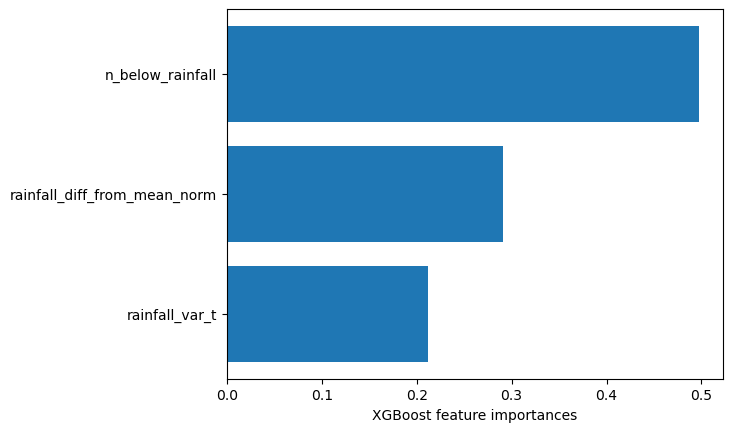

In [30]:
pipe = Pipeline([
    ('scaler', StandardScaler()),
    ('xgb', XGBoostRegressorForSklearn())
])

param_grid = {
    'xgb__n_estimators': [10, 100, 500],
    'xgb__max_depth': [1, 3, 5, 10]
}

grid = GridSearchCV(pipe, param_grid, scoring='neg_root_mean_squared_error')

feat = ['n_below_rainfall', 'rainfall_var_t', 'rainfall_diff_from_mean_norm']

target = 'gdp_g'

X = subset[feat]
y = subset[target]

grid.fit(X, y)

print(grid.best_params_, grid_cv.best_score_)

best_model = grid.best_estimator_.named_steps['xgb']
sorted_idx = best_model.estimator.feature_importances_.argsort()
plt.barh(X.columns[sorted_idx], best_model.estimator.feature_importances_[sorted_idx])
plt.xlabel('XGBoost feature importances')
plt.plot()

## Proper model testing with CV

In [18]:
from sklearn.model_selection import KFold, train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor
import xgboost as xgb
from sklearn.metrics import root_mean_squared_error

In [20]:
feats = ['n_below_rainfall', 'rainfall_var_t', 'rainfall_diff_from_mean_norm', 'cum_rainfall_diff',
         'oil_rent', 'pt_gdp_agriculture']
target = 'gdp_g'

models = [LinearRegression(), xgb.XGBRegressor(n_estimators=100, max_depth=3), RandomForestRegressor(n_estimators=100, max_depth=3)]

train, test = train_test_split(subset, test_size=0.2)

n_sp = 5
kfold = KFold(n_splits=n_sp, shuffle=True)

results = []
for im, model in enumerate(models):
    avg_rmse = 0
    for i, (train_index, test_index) in enumerate(kfold.split(train)):
        tt = train.iloc[train_index]
        ho = train.iloc[test_index]

        model.fit(tt[feats], tt[target])
        preds = model.predict(ho[feats])
        rmse = root_mean_squared_error(ho[target], preds)

        avg_rmse += rmse

    avg_rmse /= n_sp
    results.append(avg_rmse)

In [22]:
results

[0.06717621901861838, 0.06969948715041001, 0.06754276508160534]

In [28]:
feats = ['rainfall_var_t', 'rainfall_var_t_1', 'Year']
target = 'gdp_g'

models = [LinearRegression(), xgb.XGBRegressor(n_estimators=100, max_depth=3), RandomForestRegressor(n_estimators=100, max_depth=3)]

train, test = train_test_split(subset, test_size=0.2)

n_sp = 5
kfold = KFold(n_splits=n_sp, shuffle=True)

results = []
for im, model in enumerate(models):
    avg_rmse = 0
    for i, (train_index, test_index) in enumerate(kfold.split(train)):
        tt = train.iloc[train_index]
        ho = train.iloc[test_index]

        model.fit(tt[feats], tt[target])
        preds = model.predict(ho[feats])
        rmse = root_mean_squared_error(ho[target], preds)

        avg_rmse += rmse

    avg_rmse /= n_sp
    results.append(avg_rmse)

In [30]:
results

[0.0663882350161411, 0.06669619064836385, 0.06589866749206488]